In [104]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [105]:
import sys
sys.path.append('../..')
from firstpassage.FPTCalculator import *
from compiler.LOGraph2 import *
from scripts.compare_trees import nx_to_vdsp
from scripts.random_graph_order import get_spanning_tree
import random
import perceval as pcvl
import itertools

In [97]:
random.seed(2334)
G = nx.erdos_renyi_graph(12,0.3)
C = list(nx.connected_components(G))
for idx in range(1,len(C)):
    G.add_edge(list(C[idx-1])[0],list(C[idx])[0])
print(G.edges)


[(0, 6), (0, 11), (1, 4), (1, 6), (1, 8), (1, 10), (1, 11), (2, 4), (3, 4), (3, 8), (3, 10), (5, 7), (7, 8), (7, 9), (7, 11), (8, 9), (8, 10)]


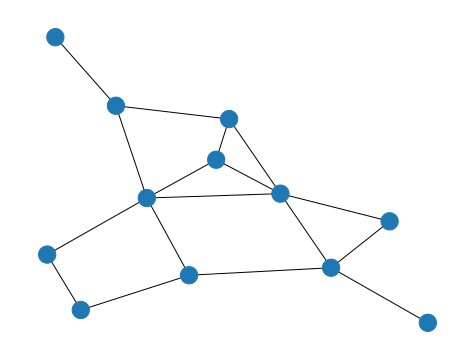

In [106]:
nx.draw(G)

In [99]:
sorted([(v,G.degree(v)) for v in G.nodes], key= lambda k: k[1])[-1][0]
G.edges

EdgeView([(0, 6), (0, 11), (1, 4), (1, 6), (1, 8), (1, 10), (1, 11), (2, 4), (3, 4), (3, 8), (3, 10), (5, 7), (7, 8), (7, 9), (7, 11), (8, 9), (8, 10)])

In [100]:
# max_degree_vertex = sorted([(v,G.degree(v)) for v in G.nodes], key= lambda k: k[1])[-1][0]
# vdsp_tree = nx_to_vdsp(nx.minimum_spanning_tree(G), 0)
vdsp_tree = nx_to_vdsp(get_spanning_tree(G, traverse_method='bfs', depth='min', min_degree=False),0)
q = LOGraph(0, G)
current_optimal_graph, current_loops = build_optimal_dfs_search(vdsp_tree.head,q, False)

add tree edge 4 2
fuse 4 6
{4: 8, 2: 10}
merge 4 2
{4: 8, 2: 10}
add tree edge 4 3
sink from  8 to 10
fuse 10 12
{4: 14, 2: 8, 3: 16}
merge 4 3
{4: 14, 2: 8, 3: 16}
subtree with head 2 vertices: [2]
subtree with head 3 vertices: [3]
add tree edge 7 5
fuse 4 6
{7: 8, 5: 10}
merge 7 5
{7: 8, 5: 10}
subtree with head 5 vertices: [5]
add tree edge 8 7
fuse 4 6
{8: 8, 7: 10}
merge 8 7
{8: 8, 7: 14, 5: 16}
add tree edge 8 9
sink from  8 to 16
fuse 16 18
{8: 20, 7: 12, 5: 14, 9: 22}
merge 8 9
{8: 20, 7: 12, 5: 14, 9: 22}
subtree with head 7 vertices: [7, 5]
subtree with head 9 vertices: [9]
add graph edge 7 9
fuse 28 30
sink from  22 to 32
sink from  12 to 20
fuse 20 22
fuse 32 34
{8: 18, 7: 24, 5: 12, 9: 30}
add tree edge 1 10
fuse 4 6
{1: 8, 10: 10}
merge 1 10
{1: 8, 10: 10}
add tree edge 1 11
sink from  8 to 10
fuse 10 12
{1: 14, 10: 8, 11: 16}
merge 1 11
{1: 14, 10: 8, 11: 16}
add tree edge 1 4
sink from  14 to 16
fuse 16 18
{1: 20, 10: 8, 11: 14, 4: 22}
merge 1 4
{1: 20, 10: 8, 11: 14, 4

In [101]:
current_optimal_graph.get_fusion_order()
print("DEPTH:",current_optimal_graph.depth())

DEPTH: 22


In [102]:
fusion_order = current_optimal_graph.get_fusion_order()
get_fp_times(fusion_order, int(current_optimal_graph.circuit.m/2), [0.5,0.66,0.75,0.85,1])

{0.5: 430920.94047655025,
 0.66: 1029.2477020261072,
 0.75: 170.56350554446146,
 0.85: 60.80345418946948,
 1: 28.99999999254259}

[(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]
in dfs for graph with nodes [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


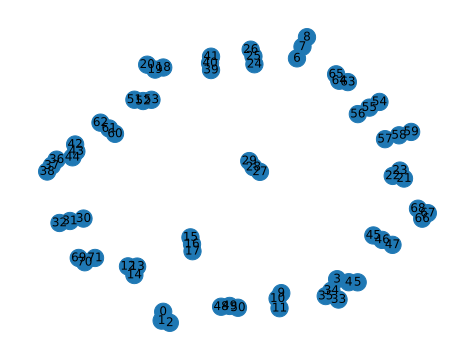

fusion  (29, 30)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


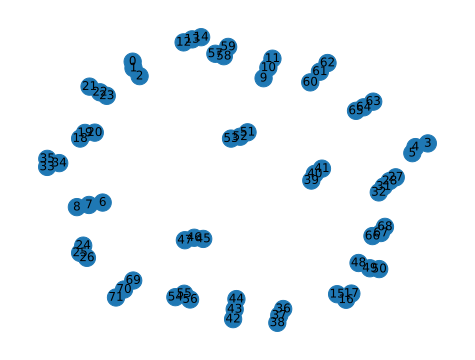

fusion  (23, 47)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


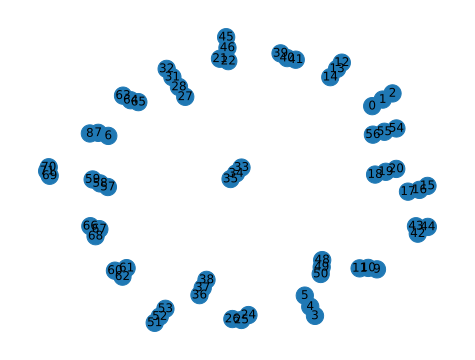

fusion  (17, 18)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 19, 20, 21, 22, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


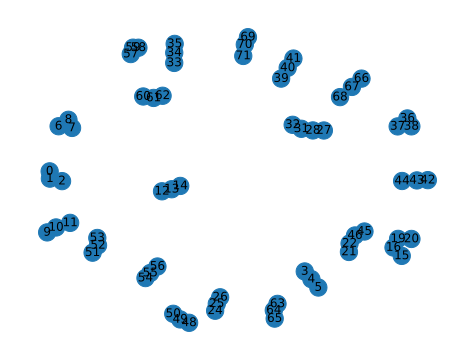

fusion  (13, 15)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 19, 20, 21, 22, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


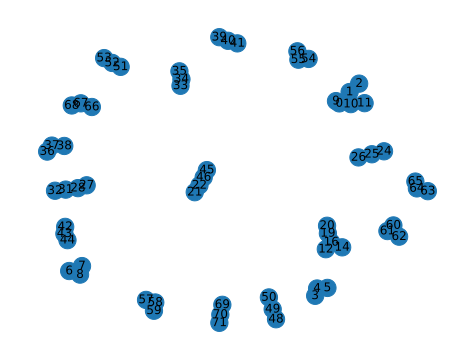

fusion  (14, 54)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 16, 19, 20, 21, 22, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


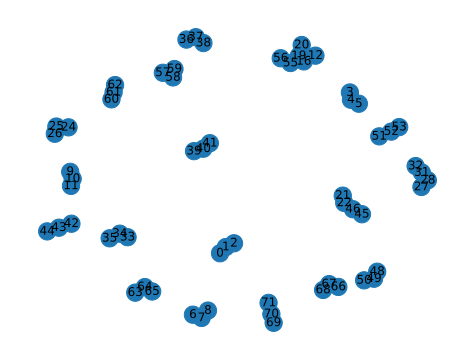

fusion  (5, 6)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 16, 19, 20, 21, 22, 24, 25, 26, 27, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


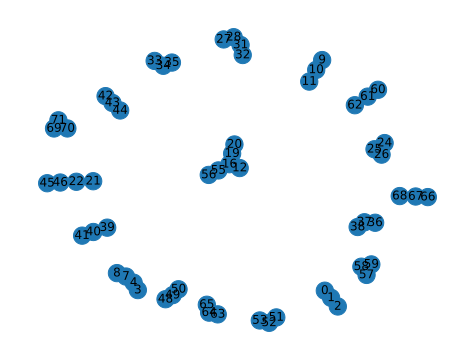

fusion  (26, 27)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 16, 19, 20, 21, 22, 24, 25, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


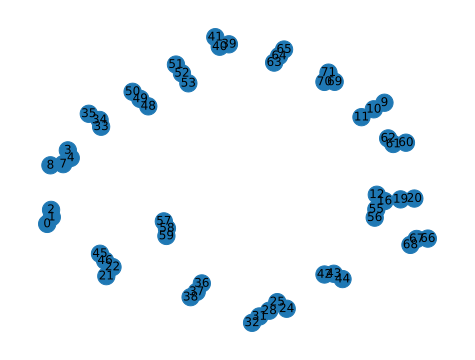

fusion  (62, 63)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 8, 9, 10, 11, 12, 16, 19, 20, 21, 22, 24, 25, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


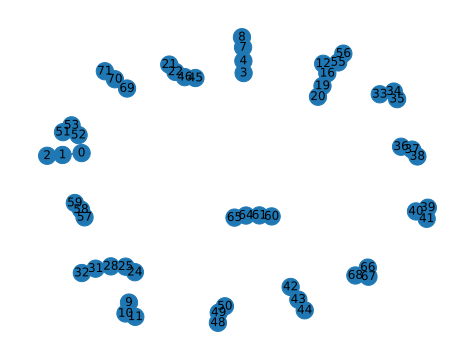

fusion  (8, 9)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 16, 19, 20, 21, 22, 24, 25, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


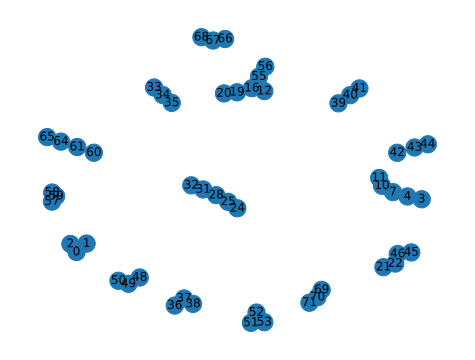

fusion  (16, 24)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 64, 65, 66, 67, 68, 69, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


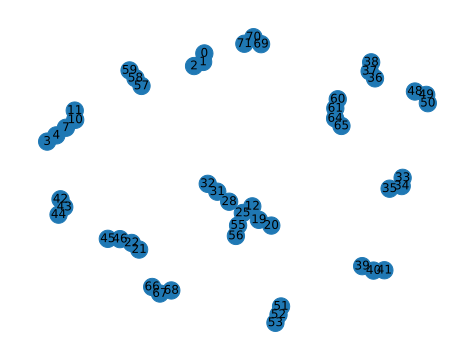

fusion  (68, 69)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 28, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


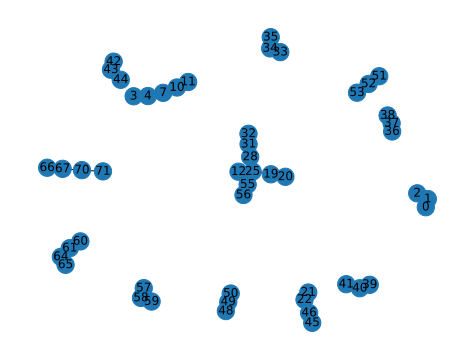

fusion  (37, 59)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 28, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


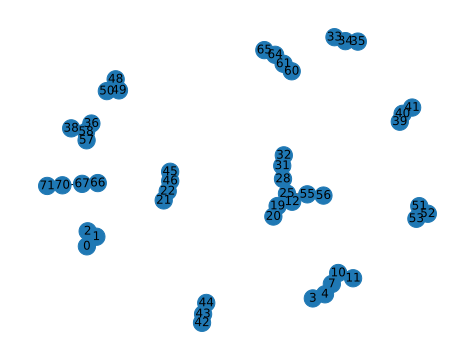

fusion  (43, 60)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 28, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


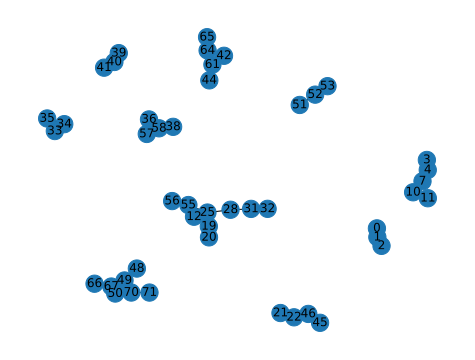

fusion  (28, 33)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 31, 32, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


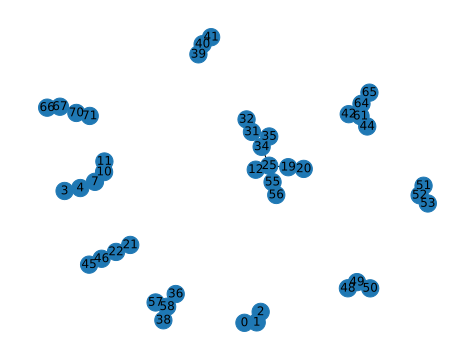

fusion  (50, 51)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 31, 32, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 52, 53, 55, 56, 57, 58, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


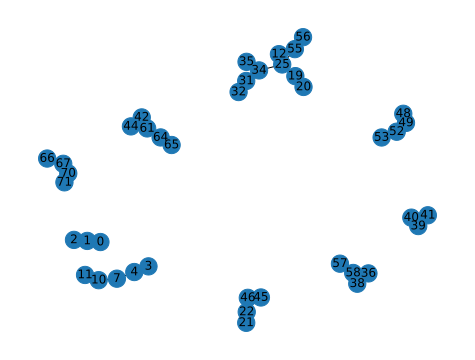

fusion  (31, 36)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 32, 34, 35, 38, 39, 40, 41, 42, 44, 45, 46, 48, 49, 52, 53, 55, 56, 57, 58, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


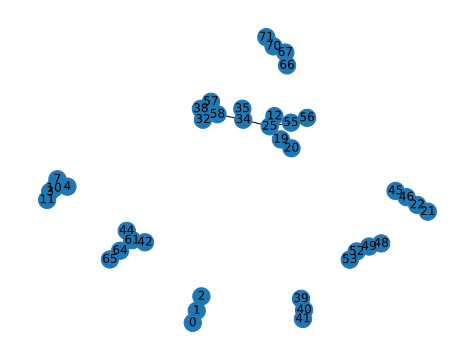

fusion  (34, 48)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 19, 20, 21, 22, 25, 32, 35, 38, 39, 40, 41, 42, 44, 45, 46, 49, 52, 53, 55, 56, 57, 58, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


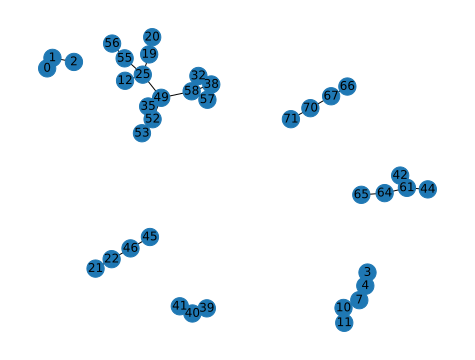

fusion  (19, 21)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 20, 22, 25, 32, 35, 38, 39, 40, 41, 42, 44, 45, 46, 49, 52, 53, 55, 56, 57, 58, 61, 64, 65, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


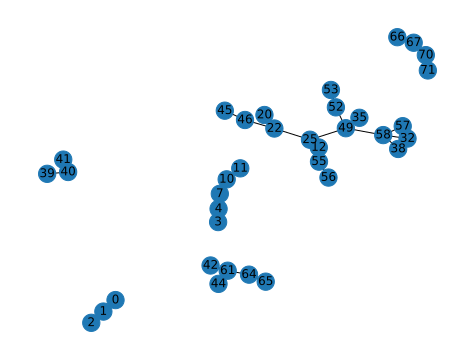

fusion  (49, 65)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 20, 22, 25, 32, 35, 38, 39, 40, 41, 42, 44, 45, 46, 52, 53, 55, 56, 57, 58, 61, 64, 66, 67, 70, 71] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


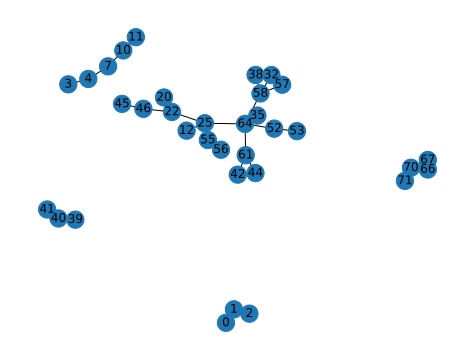

fusion  (55, 71)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 20, 22, 25, 32, 35, 38, 39, 40, 41, 42, 44, 45, 46, 52, 53, 56, 57, 58, 61, 64, 66, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


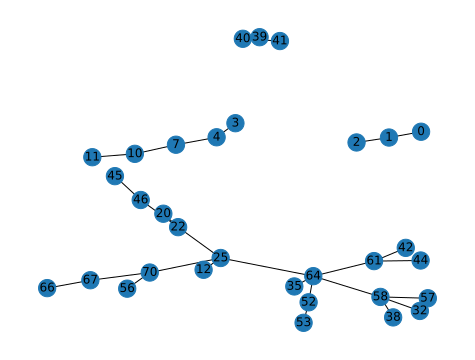

fusion  (35, 41)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 20, 22, 25, 32, 38, 39, 40, 42, 44, 45, 46, 52, 53, 56, 57, 58, 61, 64, 66, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


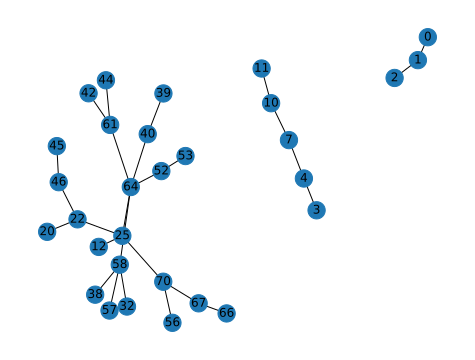

fusion  (56, 57)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 20, 22, 25, 32, 38, 39, 40, 42, 44, 45, 46, 52, 53, 58, 61, 64, 66, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


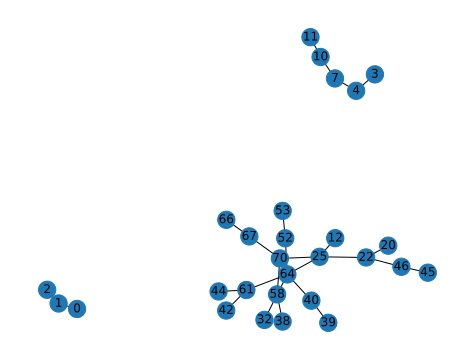

fusion  (46, 53)  success
in dfs for graph with nodes [0, 1, 2, 3, 4, 7, 10, 11, 12, 20, 22, 25, 32, 38, 39, 40, 42, 44, 45, 52, 58, 61, 64, 66, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


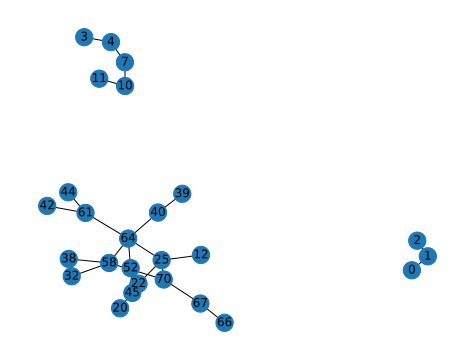

fusion  (2, 3)  success
in dfs for graph with nodes [0, 1, 4, 7, 10, 11, 12, 20, 22, 25, 32, 38, 39, 40, 42, 44, 45, 52, 58, 61, 64, 66, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


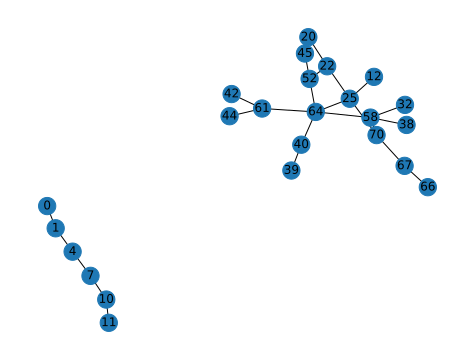

fusion  (10, 12)  success
in dfs for graph with nodes [0, 1, 4, 7, 11, 20, 22, 25, 32, 38, 39, 40, 42, 44, 45, 52, 58, 61, 64, 66, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


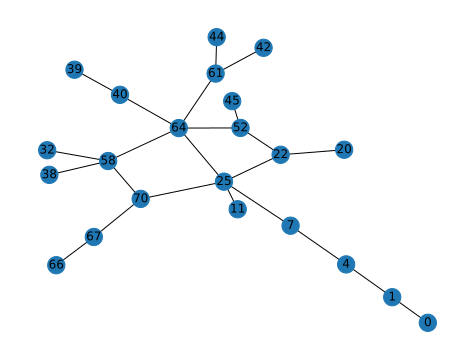

fusion  (11, 42)  success
in dfs for graph with nodes [0, 1, 4, 7, 20, 22, 25, 32, 38, 39, 40, 44, 45, 52, 58, 61, 64, 66, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


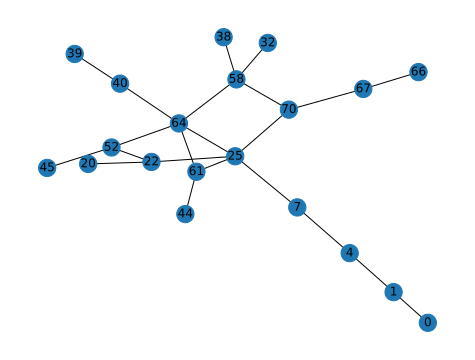

fusion  (4, 66)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 38, 39, 40, 44, 45, 52, 58, 61, 64, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


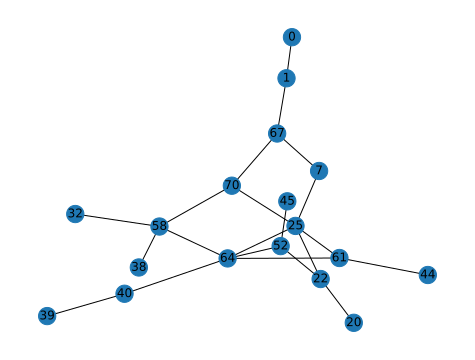

fusion  (38, 39)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 44, 45, 52, 58, 61, 64, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


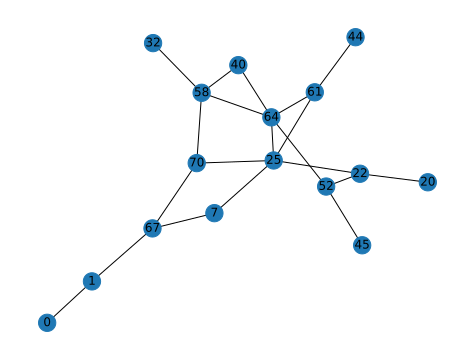

fusion  (44, 45)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 52, 58, 61, 64, 67, 70] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (38, 39), (44, 45)]


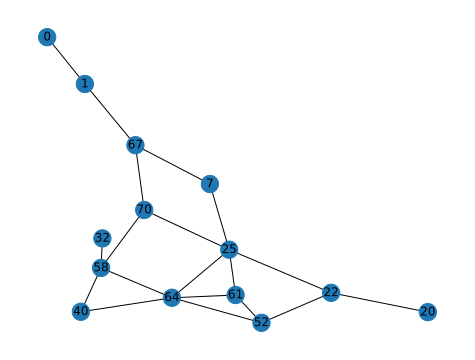

fusion failure  44 45
rebuilding vertex 44
connected components for neighbor 61 : {64, 32, 1, 67, 0, 70, 7, 40, 52, 20, 22, 25, 58, 61}
set initial ghz as  (44, 61, 75) fusing the last with neighbor 61
rebuilding vertex 45
connected components for neighbor 52 : {64, 32, 1, 67, 0, 70, 7, 40, 52, 20, 22, 25, 58, 61}
set initial ghz as  (45, 52, 78) fusing the last with neighbor 52
vertex map: {44: 74, 61: 73, 45: 77, 52: 76}
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 52, 58, 61, 64, 67, 70, 72, 73, 74, 75, 76, 77] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (61, 72), (52, 75), (74, 77)]


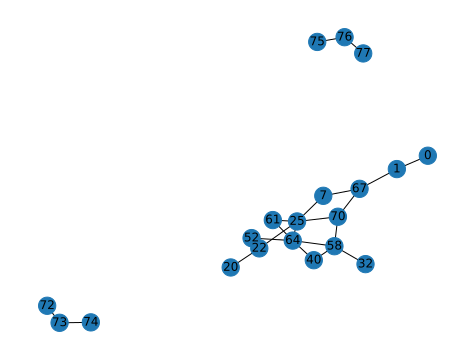

fusion  (61, 72)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 52, 58, 64, 67, 70, 73, 74, 75, 76, 77] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (61, 72), (52, 75), (74, 77)]


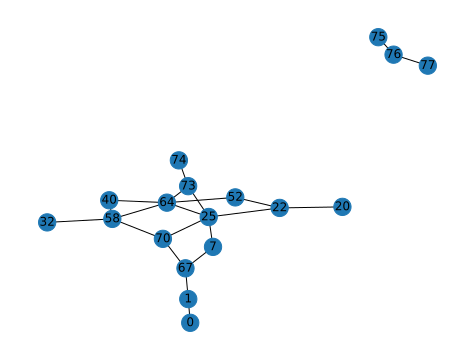

fusion  (52, 75)  success
fusion failure  52 75
rebuilding vertex 52
connected components for neighbor 64 : {64, 32, 1, 67, 0, 70, 7, 40, 73, 74, 20, 22, 25, 58}
set initial ghz as  (52, 64, 81) fusing the last with neighbor 64
add subgraph of neighbor 22
rebuilding vertex 75
connected components for neighbor 76 : {76, 77}
set initial ghz as  (75, 76, 77)
vertex map: {52: 82, 64: 79, 22: 85, 75: 89, 76: 88, 77: 87}
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 58, 64, 67, 70, 73, 74, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (83, 84), (86, 22), (82, 89), (74, 87)]


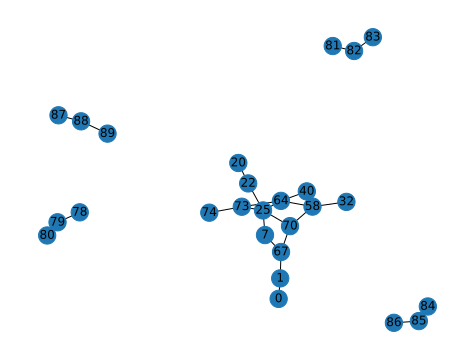

fusion  (64, 78)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 58, 67, 70, 73, 74, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (83, 84), (86, 22), (82, 89), (74, 87)]


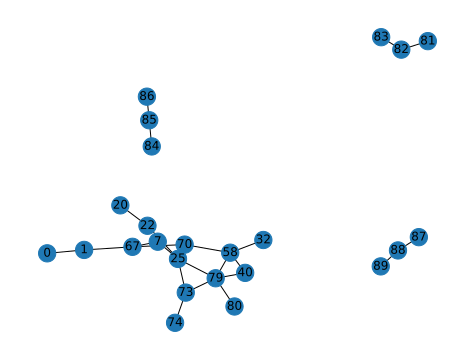

fusion  (80, 81)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 58, 67, 70, 73, 74, 79, 82, 83, 84, 85, 86, 87, 88, 89] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (83, 84), (86, 22), (82, 89), (74, 87)]


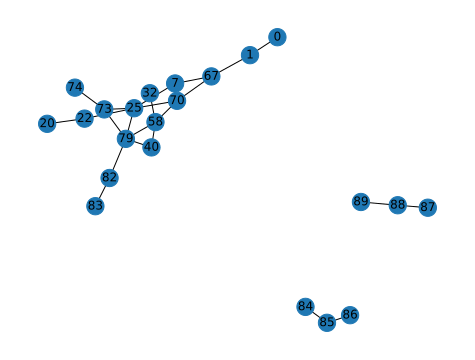

fusion  (83, 84)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 58, 67, 70, 73, 74, 79, 82, 85, 86, 87, 88, 89] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (83, 84), (86, 22), (82, 89), (74, 87)]


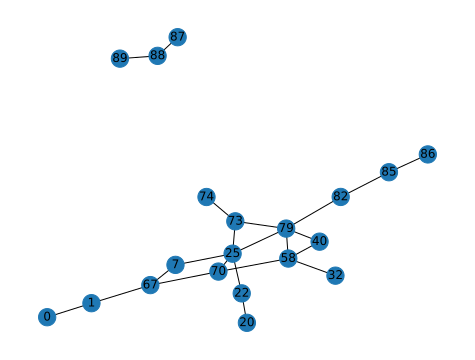

fusion  (86, 22)  success
fusion failure  86 22
rebuilding vertex 86
connected components for neighbor 85 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 79, 82, 85, 25, 58}
set initial ghz as  (86, 85, 93) fusing the last with neighbor 85
rebuilding vertex 22
connected components for neighbor 20 : {20}
connected components for neighbor 25 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 79, 82, 85, 25, 58}
set initial ghz as  (22, 25, 96) fusing the last with neighbor 25
add singular vertex 20
vertex map: {86: 92, 85: 91, 22: 97, 25: 94, 20: 98}
in dfs for graph with nodes [0, 1, 7, 25, 32, 40, 58, 67, 70, 73, 74, 79, 82, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (85, 90), (25, 93), (95, 96), (92, 97), (82, 

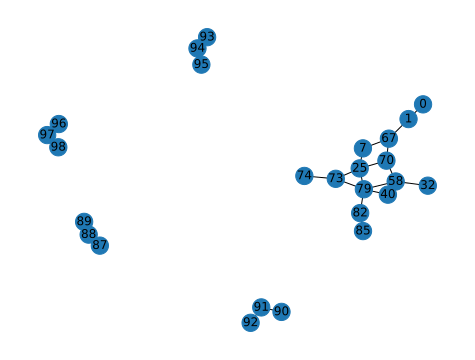

fusion  (85, 90)  success
in dfs for graph with nodes [0, 1, 7, 25, 32, 40, 58, 67, 70, 73, 74, 79, 82, 87, 88, 89, 91, 92, 93, 94, 95, 96, 97, 98] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (85, 90), (25, 93), (95, 96), (92, 97), (82, 89), (74, 87)]


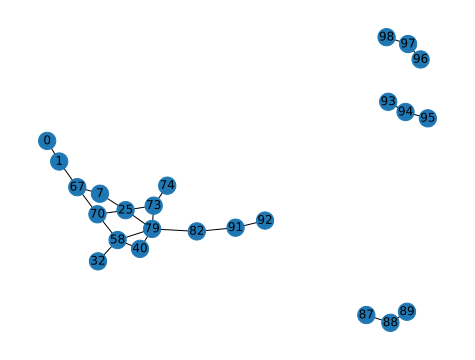

fusion  (25, 93)  success
in dfs for graph with nodes [0, 1, 7, 32, 40, 58, 67, 70, 73, 74, 79, 82, 87, 88, 89, 91, 92, 94, 95, 96, 97, 98] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (85, 90), (25, 93), (95, 96), (92, 97), (82, 89), (74, 87)]


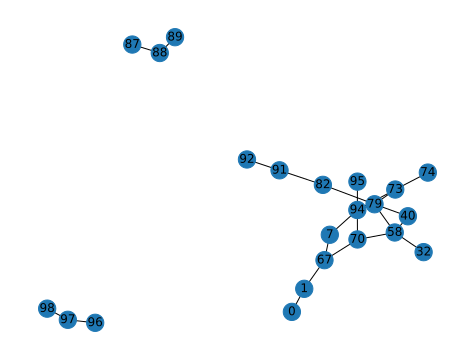

fusion  (95, 96)  success
fusion failure  95 96
rebuilding vertex 95
connected components for neighbor 94 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 79, 82, 58, 91, 92, 94}
set initial ghz as  (95, 94, 102) fusing the last with neighbor 94
rebuilding vertex 96
connected components for neighbor 97 : {97, 98}
set initial ghz as  (96, 97, 98)
vertex map: {95: 101, 94: 100, 96: 104, 97: 103, 98: 102}
fusion failure  25 93
rebuilding vertex 25
connected components for neighbor 70 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 79, 82, 58, 91, 92}
set initial ghz as  (25, 70, 108) fusing the last with neighbor 70
add subgraph of neighbor 7
add subgraph of neighbor 73
add subgraph of neighbor 79
rebuilding vertex 93
connected components for neighbor 94 : {94, 95}
set initial ghz as  (93, 94, 95)
vertex map: {25: 121, 70: 106, 7: 112, 73: 118, 79: 124, 93: 128, 94: 127, 95: 126}
in dfs for graph with nodes [0, 1, 7, 32, 40, 58, 67, 70, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 105, 106, 107, 108, 109, 110,

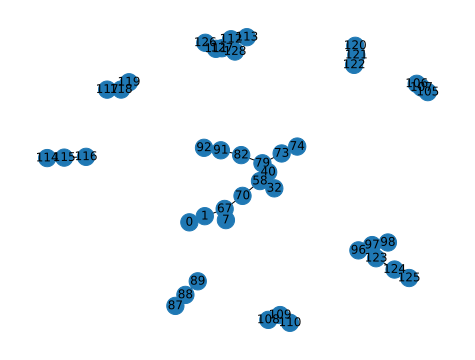

fusion  (70, 105)  success
in dfs for graph with nodes [0, 1, 7, 32, 40, 58, 67, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


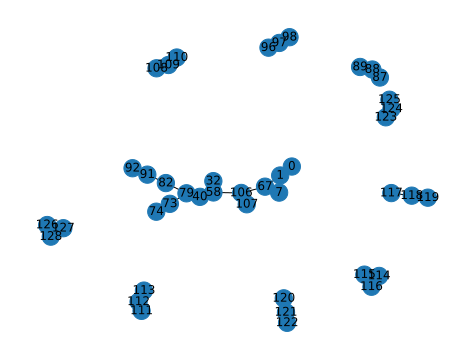

fusion  (107, 108)  success
in dfs for graph with nodes [0, 1, 7, 32, 40, 58, 67, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


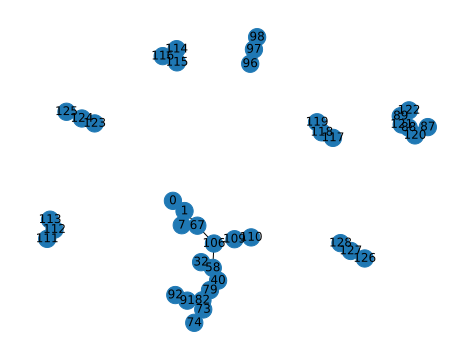

fusion  (110, 111)  success
in dfs for graph with nodes [0, 1, 7, 32, 40, 58, 67, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 109, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


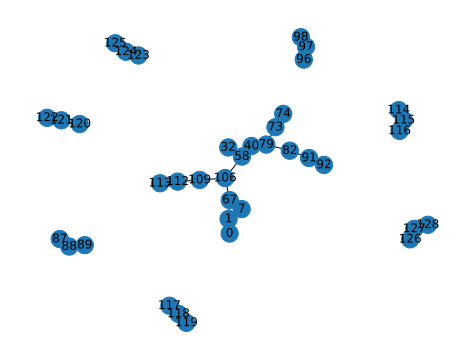

fusion  (113, 7)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 109, 112, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


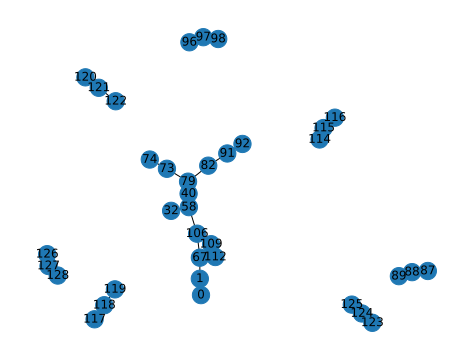

fusion  (109, 114)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


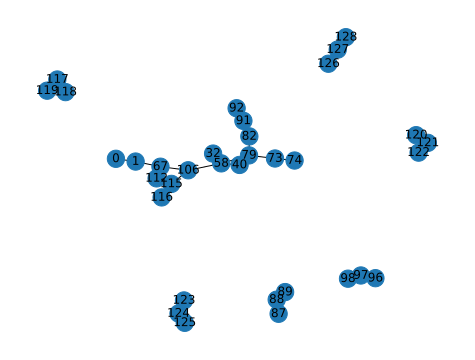

fusion  (116, 117)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 115, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


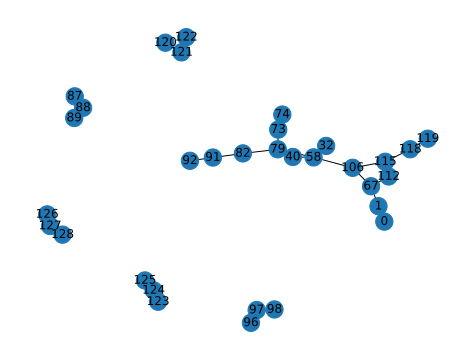

fusion  (119, 73)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 115, 118, 120, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


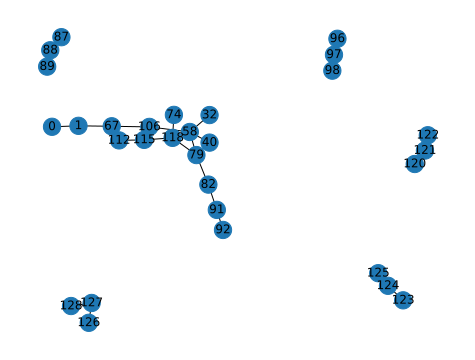

fusion  (115, 120)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 122, 123, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


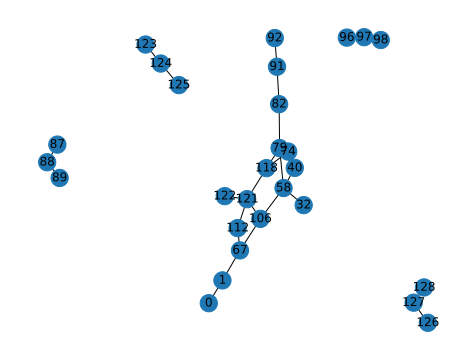

fusion  (122, 123)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 124, 125, 126, 127, 128] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


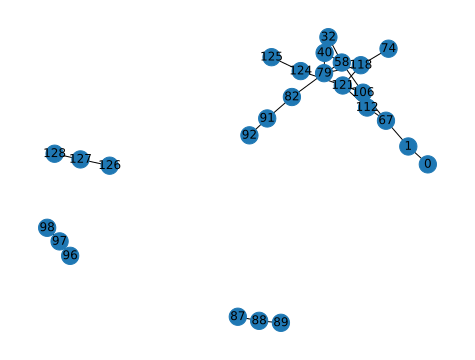

fusion  (125, 79)  success
fusion failure  125 79
rebuilding vertex 125
connected components for neighbor 124 : {32, 1, 0, 67, 40, 106, 74, 112, 118, 121, 58, 124}
set initial ghz as  (125, 124, 132) fusing the last with neighbor 124
rebuilding vertex 79
connected components for neighbor 58 : {32, 1, 0, 67, 40, 106, 74, 112, 118, 121, 58, 124}
set initial ghz as  (79, 58, 135) fusing the last with neighbor 58
add subgraph of neighbor 40
add subgraph of neighbor 82
add subgraph of neighbor 118
vertex map: {125: 131, 124: 130, 79: 148, 58: 133, 40: 139, 82: 145, 118: 151}
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 124, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (3

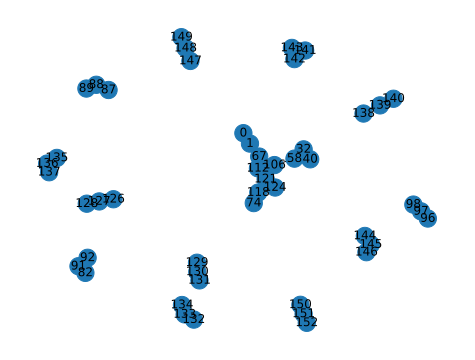

fusion  (124, 129)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


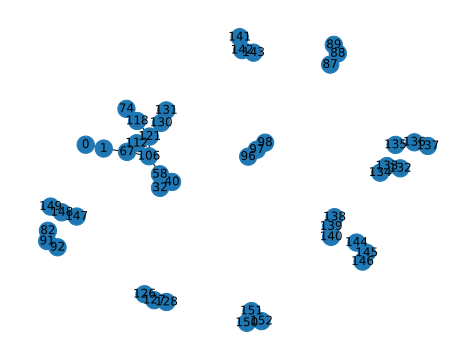

fusion  (58, 132)  success
in dfs for graph with nodes [0, 1, 32, 40, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


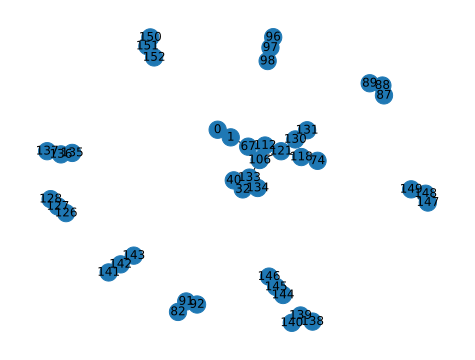

fusion  (134, 135)  success
in dfs for graph with nodes [0, 1, 32, 40, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


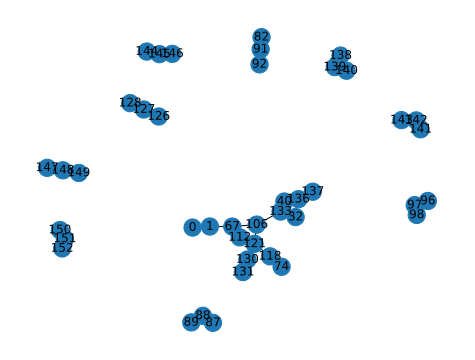

fusion  (137, 138)  success
in dfs for graph with nodes [0, 1, 32, 40, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 136, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


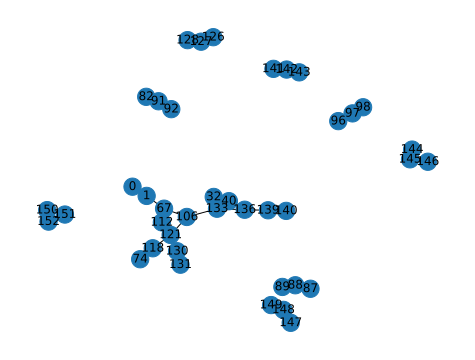

fusion  (140, 40)  success
in dfs for graph with nodes [0, 1, 32, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 136, 139, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


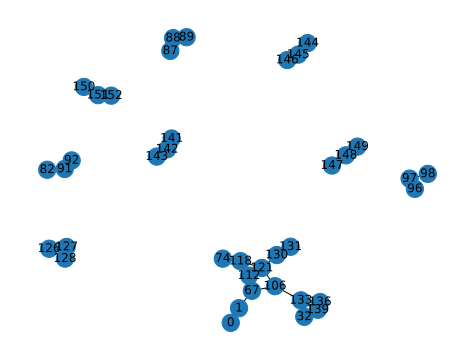

fusion  (136, 141)  success
in dfs for graph with nodes [0, 1, 32, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 139, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


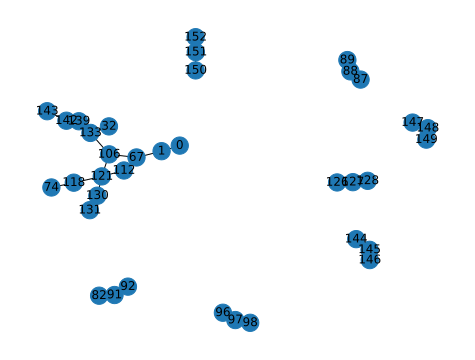

fusion  (143, 144)  success
in dfs for graph with nodes [0, 1, 32, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 139, 142, 145, 146, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


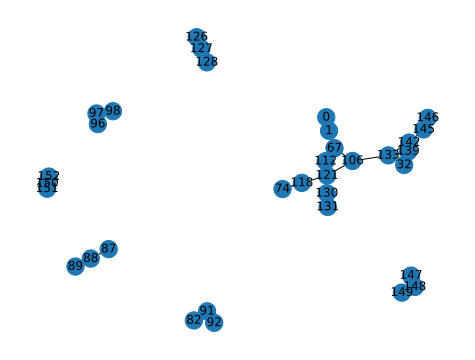

fusion  (146, 82)  success
in dfs for graph with nodes [0, 1, 32, 67, 74, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 139, 142, 145, 147, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


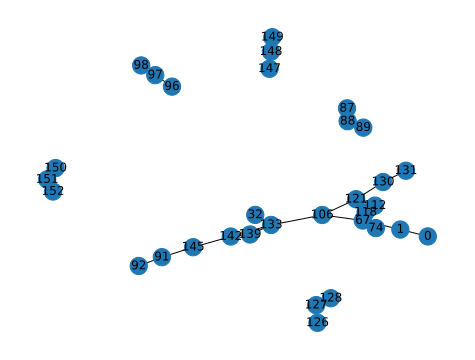

fusion  (142, 147)  success
in dfs for graph with nodes [0, 1, 32, 67, 74, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 139, 145, 148, 149, 150, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


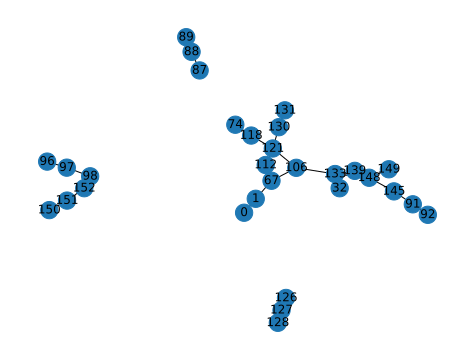

fusion  (149, 150)  success
in dfs for graph with nodes [0, 1, 32, 67, 74, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 139, 145, 148, 151, 152] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


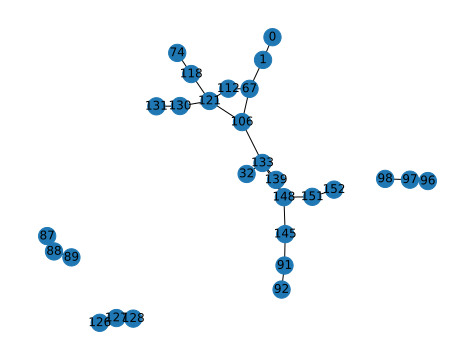

fusion  (152, 118)  success
fusion failure  152 118
rebuilding vertex 152
connected components for neighbor 151 : {32, 1, 130, 67, 0, 133, 131, 106, 139, 112, 145, 148, 151, 121, 91, 92}
set initial ghz as  (152, 151, 156) fusing the last with neighbor 151
rebuilding vertex 118
connected components for neighbor 74 : {74}
connected components for neighbor 121 : {32, 1, 130, 67, 131, 133, 0, 106, 139, 112, 145, 148, 151, 121, 91, 92}
set initial ghz as  (118, 121, 159) fusing the last with neighbor 121
add singular vertex 74
vertex map: {152: 155, 151: 154, 118: 160, 121: 157, 74: 161}
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 133, 139, 145, 148, 151, 153, 154, 155, 156, 157, 158, 159, 160, 161] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56,

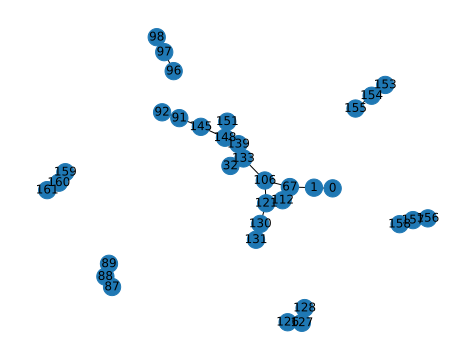

fusion  (151, 153)  success
fusion failure  151 153
rebuilding vertex 151
connected components for neighbor 148 : {32, 1, 130, 67, 0, 133, 131, 106, 139, 112, 145, 148, 121, 91, 92}
set initial ghz as  (151, 148, 165) fusing the last with neighbor 148
rebuilding vertex 153
connected components for neighbor 154 : {154, 155}
set initial ghz as  (153, 154, 155)
vertex map: {151: 164, 148: 163, 153: 167, 154: 166, 155: 165}
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 133, 139, 145, 148, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115

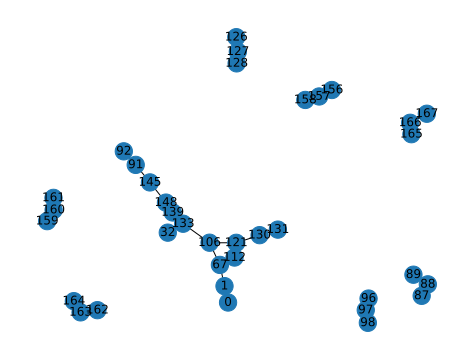

fusion  (148, 162)  success
fusion failure  148 162
rebuilding vertex 148
connected components for neighbor 133 : {32, 1, 130, 67, 0, 133, 131, 106, 139, 112, 121}
set initial ghz as  (148, 133, 171) fusing the last with neighbor 133
add subgraph of neighbor 139
add subgraph of neighbor 145
rebuilding vertex 162
connected components for neighbor 163 : {163, 164}
set initial ghz as  (162, 163, 164)
vertex map: {148: 178, 133: 169, 139: 175, 145: 181, 162: 185, 163: 184, 164: 183}
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 133, 139, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10

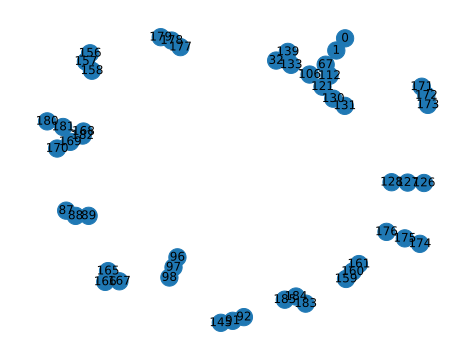

fusion  (133, 168)  success
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 139, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (173, 174), (176, 139), (172, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128), (126, 96), (92, 97), (181, 89), (161, 87)]


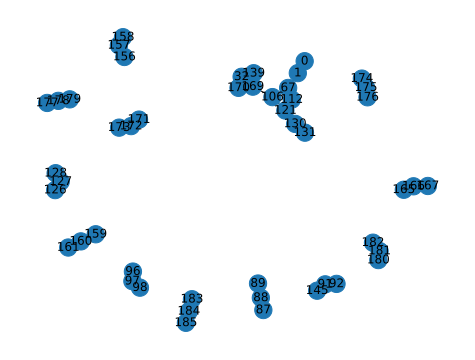

fusion  (170, 171)  success
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 139, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 169, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (173, 174), (176, 139), (172, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128), (126, 96), (92, 97), (181, 89), (161, 87)]


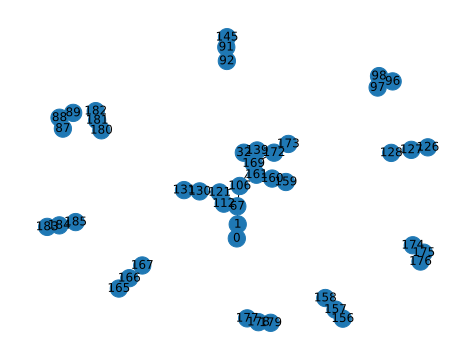

fusion  (173, 174)  success
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 139, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 169, 172, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (173, 174), (176, 139), (172, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128), (126, 96), (92, 97), (181, 89), (161, 87)]


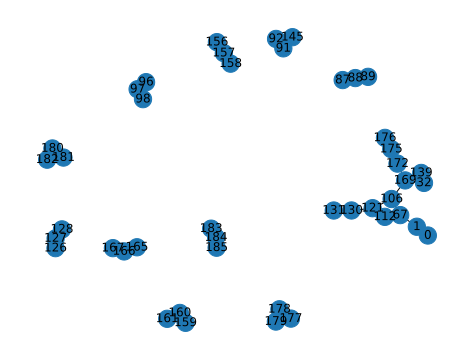

fusion  (176, 139)  success
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 169, 172, 175, 177, 178, 179, 180, 181, 182, 183, 184, 185] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (173, 174), (176, 139), (172, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128), (126, 96), (92, 97), (181, 89), (161, 87)]


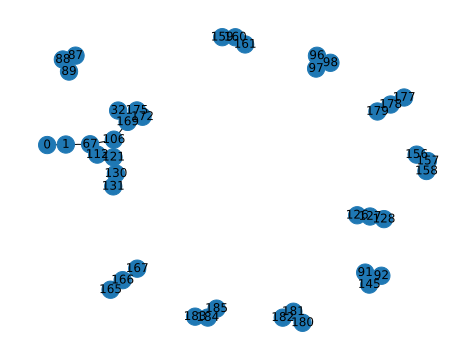

fusion  (172, 177)  success
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 169, 175, 178, 179, 180, 181, 182, 183, 184, 185] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (173, 174), (176, 139), (172, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128), (126, 96), (92, 97), (181, 89), (161, 87)]


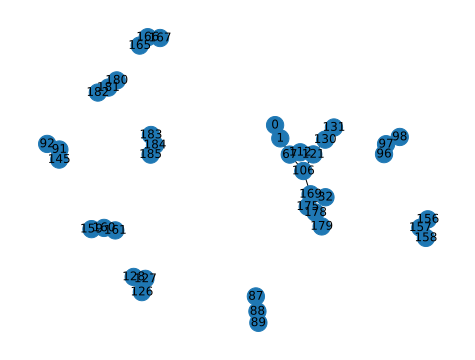

fusion  (179, 180)  success
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 169, 175, 178, 181, 182, 183, 184, 185] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (173, 174), (176, 139), (172, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128), (126, 96), (92, 97), (181, 89), (161, 87)]


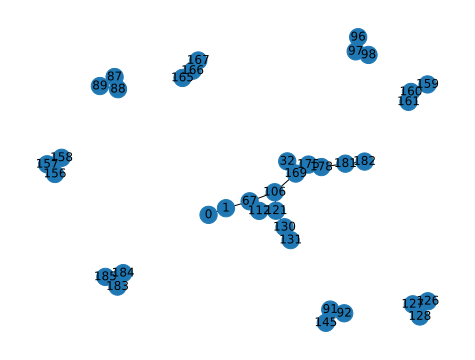

fusion  (182, 145)  success
fusion failure  182 145
rebuilding vertex 182
connected components for neighbor 181 : {32, 1, 130, 67, 0, 131, 169, 106, 175, 112, 178, 181, 121}
set initial ghz as  (182, 181, 189) fusing the last with neighbor 181
rebuilding vertex 145
connected components for neighbor 91 : {91, 92}
set initial ghz as  (145, 91, 92)
vertex map: {182: 188, 181: 187, 145: 191, 91: 190, 92: 189}
fusion failure  179 180
rebuilding vertex 179
connected components for neighbor 178 : {32, 1, 130, 67, 0, 131, 169, 106, 175, 112, 178, 121}
set initial ghz as  (179, 178, 195) fusing the last with neighbor 178
rebuilding vertex 180
connected components for neighbor 181 : {181, 182}
set initial ghz as  (180, 181, 182)
vertex map: {179: 194, 178: 193, 180: 197, 181: 196, 182: 195}
fusion failure  172 177
rebuilding vertex 172
connected components for neighbor 169 : {32, 1, 130, 67, 0, 131, 169, 106, 175, 112, 121}
set initial ghz as  (172, 169, 201) fusing the last with neighbor 169
ad

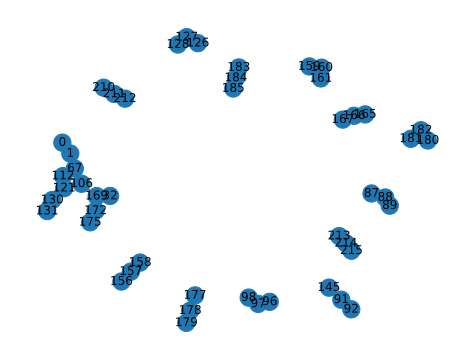

fusion  (175, 210)  success
in dfs for graph with nodes [0, 1, 32, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 169, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 213, 214, 215] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (175, 210), (169, 213), (212, 215), (172, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128), (126, 96), (92, 97), (181, 89), (161, 87)]


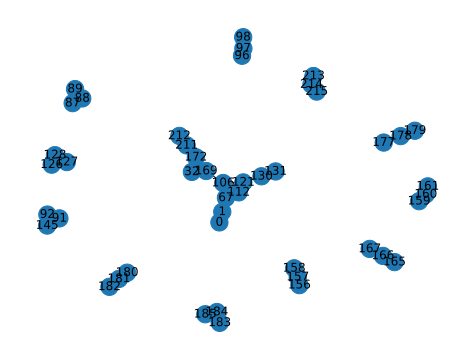

fusion  (169, 213)  success
fusion failure  169 213
rebuilding vertex 169
connected components for neighbor 32 : {32}
connected components for neighbor 106 : {0, 1, 130, 67, 131, 106, 112, 121}
set initial ghz as  (169, 106, 219) fusing the last with neighbor 106
add singular vertex 32
add subgraph of neighbor 172
rebuilding vertex 213
connected components for neighbor 214 : {214, 215}
set initial ghz as  (213, 214, 215)
vertex map: {169: 223, 106: 217, 32: 221, 172: 226, 213: 230, 214: 229, 215: 228}
in dfs for graph with nodes [0, 1, 67, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65

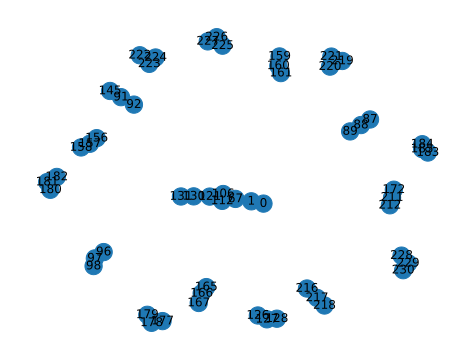

fusion  (106, 216)  success
in dfs for graph with nodes [0, 1, 67, 87, 88, 89, 91, 92, 96, 97, 98, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (106, 216), (218, 219), (220, 222), (224, 225), (227, 172), (223, 230), (212, 228), (226, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184),

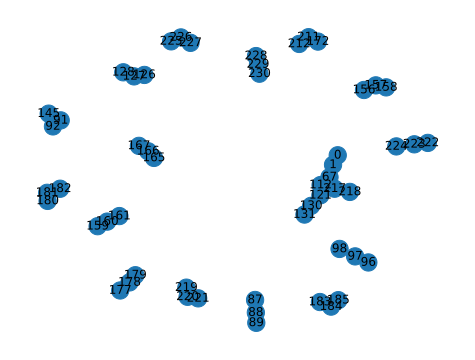

fusion  (218, 219)  success
in dfs for graph with nodes [0, 1, 67, 87, 88, 89, 91, 92, 96, 97, 98, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 217, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (170, 171), (106, 216), (218, 219), (220, 222), (224, 225), (227, 172), (223, 230), (212, 228), (226, 177), (179, 180), (182, 145), (178, 185), (183, 167), (121, 156), (158, 159), (165, 160), (131, 184), (157, 128

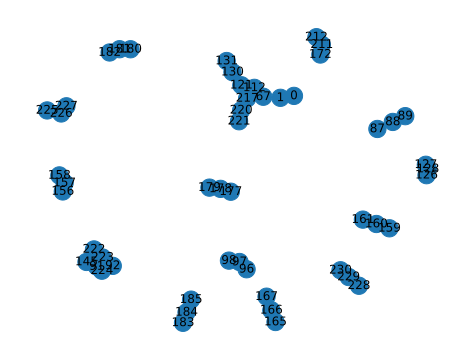

fusion  (220, 222)  success
fusion failure  220 222
rebuilding vertex 220
connected components for neighbor 221 : {221}
connected components for neighbor 217 : {0, 121, 1, 67, 130, 131, 112, 217}
set initial ghz as  (220, 217, 234) fusing the last with neighbor 217
add singular vertex 221
rebuilding vertex 222
connected components for neighbor 223 : {224, 223}
set initial ghz as  (222, 223, 224)
vertex map: {220: 235, 217: 232, 221: 236, 222: 239, 223: 238, 224: 237}
fusion failure  218 219
rebuilding vertex 218
connected components for neighbor 217 : {0, 121, 1, 67, 130, 131, 112, 217}
set initial ghz as  (218, 217, 243) fusing the last with neighbor 217
rebuilding vertex 219
connected components for neighbor 220 : {220, 221}
set initial ghz as  (219, 220, 221)
vertex map: {218: 242, 217: 241, 219: 245, 220: 244, 221: 243}
fusion failure  106 216
rebuilding vertex 106
connected components for neighbor 67 : {0, 1, 130, 67, 131, 112, 121}
set initial ghz as  (106, 67, 249) fusing the la

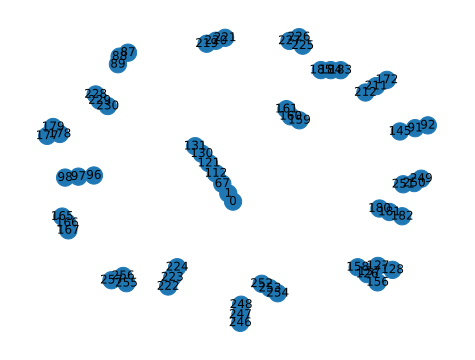

fusion  (67, 246)  success
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (67, 246), (248, 249), (251, 252), (254, 121), (250, 257), (255, 219), (220, 222), (224, 225), (227, 172), (223, 230), (212, 228), (226, 177), (179, 180), (182, 14

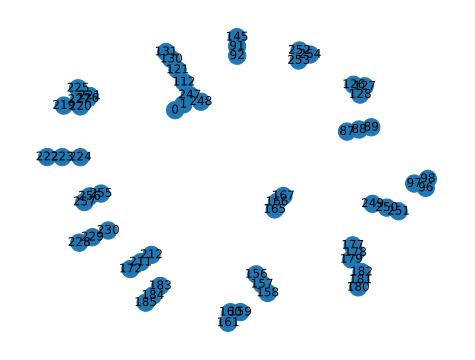

fusion  (248, 249)  success
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 250, 251, 252, 253, 254, 255, 256, 257] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (67, 246), (248, 249), (251, 252), (254, 121), (250, 257), (255, 219), (220, 222), (224, 225), (227, 172), (223, 230), (212, 228), (226, 177), (179, 180), (182, 145), (178,

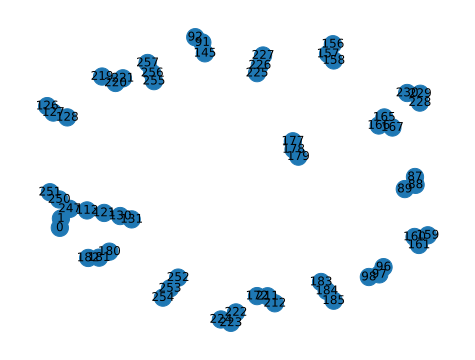

fusion  (251, 252)  success
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 112, 121, 126, 127, 128, 130, 131, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 250, 253, 254, 255, 256, 257] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (67, 246), (248, 249), (251, 252), (254, 121), (250, 257), (255, 219), (220, 222), (224, 225), (227, 172), (223, 230), (212, 228), (226, 177), (179, 180), (182, 145), (178, 185), (18

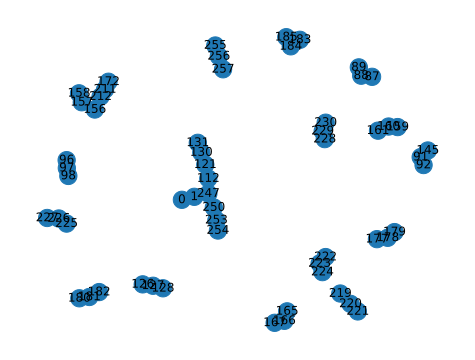

fusion  (254, 121)  success
fusion failure  254 121
rebuilding vertex 254
connected components for neighbor 253 : {0, 1, 112, 247, 250, 253}
set initial ghz as  (254, 253, 261) fusing the last with neighbor 253
rebuilding vertex 121
connected components for neighbor 112 : {0, 1, 112, 247, 250, 253}
set initial ghz as  (121, 112, 264) fusing the last with neighbor 112
vertex map: {254: 260, 253: 259, 121: 265, 112: 262, 130: 268, 131: 269}
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 112, 126, 127, 128, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 250, 253, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), 

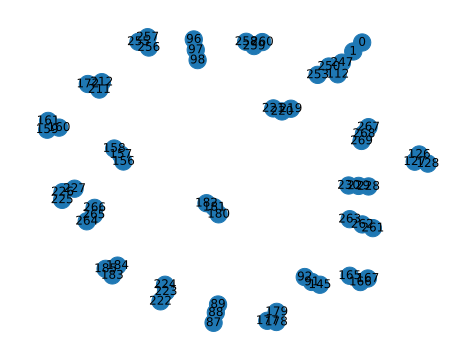

fusion  (253, 258)  success
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 112, 126, 127, 128, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 250, 255, 256, 257, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (67, 246), (248, 249), (253, 258), (112, 261), (263, 264), (266, 267), (260, 265), (250, 257), (255, 219), (220, 222), (224, 225), (227, 172), (223, 230

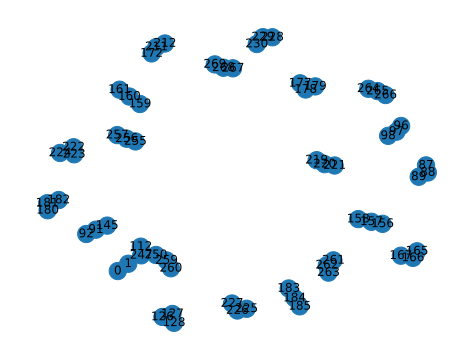

fusion  (112, 261)  success
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 126, 127, 128, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 250, 255, 256, 257, 259, 260, 262, 263, 264, 265, 266, 267, 268, 269] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (67, 246), (248, 249), (253, 258), (112, 261), (263, 264), (266, 267), (260, 265), (250, 257), (255, 219), (220, 222), (224, 225), (227, 172), (223, 230), (212, 2

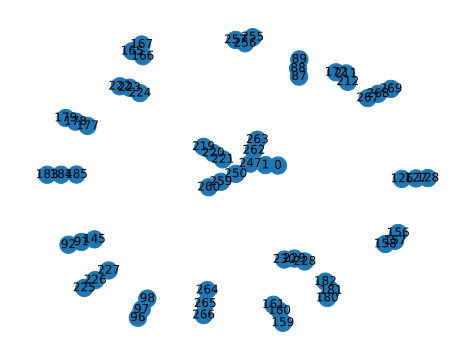

fusion  (263, 264)  success
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 126, 127, 128, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 250, 255, 256, 257, 259, 260, 262, 265, 266, 267, 268, 269] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (137, 138), (140, 40), (136, 141), (143, 144), (133, 168), (67, 246), (248, 249), (253, 258), (112, 261), (263, 264), (266, 267), (260, 265), (250, 257), (255, 219), (220, 222), (224, 225), (227, 172), (223, 230), (212, 228), (226,

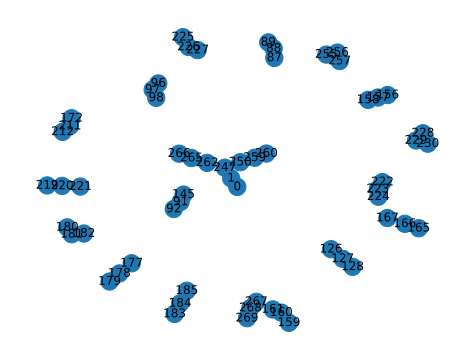

fusion  (266, 267)  success
fusion failure  266 267
rebuilding vertex 266
connected components for neighbor 265 : {0, 1, 259, 260, 262, 265, 247, 250}
set initial ghz as  (266, 265, 273) fusing the last with neighbor 265
rebuilding vertex 267
connected components for neighbor 268 : {268, 269}
set initial ghz as  (267, 268, 269)
vertex map: {266: 272, 265: 271, 267: 275, 268: 274, 269: 273}
fusion failure  263 264
rebuilding vertex 263
connected components for neighbor 262 : {0, 1, 259, 260, 262, 247, 250}
set initial ghz as  (263, 262, 279) fusing the last with neighbor 262
rebuilding vertex 264
connected components for neighbor 265 : {265, 266}
set initial ghz as  (264, 265, 266)
vertex map: {263: 278, 262: 277, 264: 281, 265: 280, 266: 279}
fusion failure  112 261
rebuilding vertex 112
connected components for neighbor 247 : {0, 1, 259, 260, 247, 250}
set initial ghz as  (112, 247, 285) fusing the last with neighbor 247
rebuilding vertex 261
connected components for neighbor 262 : {2

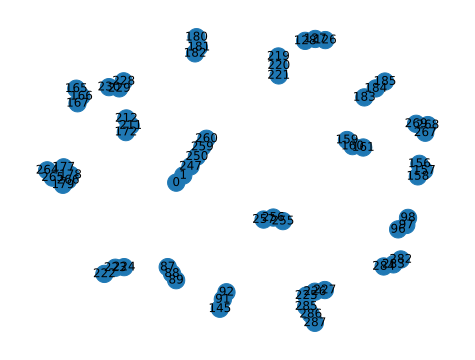

fusion  (247, 282)  success
fusion failure  247 282
rebuilding vertex 247
connected components for neighbor 1 : {0, 1}
set initial ghz as  (247, 1, 0)
add subgraph of neighbor 250
rebuilding vertex 282
connected components for neighbor 283 : {283, 284}
set initial ghz as  (282, 283, 284)
vertex map: {247: 292, 1: 289, 0: 288, 250: 295, 282: 299, 283: 298, 284: 297}
fusion failure  253 258
rebuilding vertex 253
connected components for neighbor 250 : {0, 1, 112, 247, 250}
set initial ghz as  (253, 250, 303) fusing the last with neighbor 250
rebuilding vertex 258
connected components for neighbor 259 : {259, 260}
set initial ghz as  (258, 259, 260)
vertex map: {253: 302, 250: 301, 258: 305, 259: 304, 260: 303}
in dfs for graph with nodes [0, 1, 87, 88, 89, 91, 92, 96, 97, 98, 112, 126, 127, 128, 145, 156, 157, 158, 159, 160, 161, 165, 166, 167, 172, 177, 178, 179, 180, 181, 182, 183, 184, 185, 211, 212, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 247, 250, 255, 256, 257, 

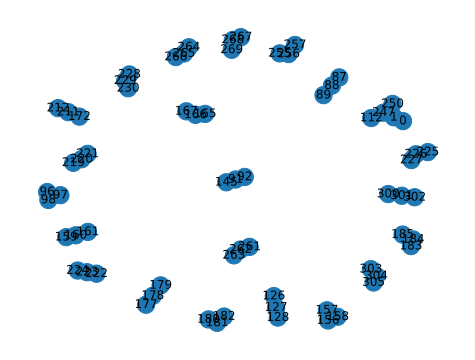

fusion  (250, 300)  success
fusion failure  250 300
rebuilding vertex 250
connected components for neighbor 247 : {112, 1, 0, 247}
set initial ghz as  (250, 247, 309) fusing the last with neighbor 247
rebuilding vertex 300
connected components for neighbor 301 : {301, 302}
set initial ghz as  (300, 301, 302)
vertex map: {250: 308, 247: 307, 300: 311, 301: 310, 302: 309}
fusion failure  251 252
rebuilding vertex 251
connected components for neighbor 250 : {0, 1, 130, 131, 112, 247, 121, 250}
set initial ghz as  (251, 250, 315) fusing the last with neighbor 250
rebuilding vertex 252
connected components for neighbor 253 : {253, 254}
set initial ghz as  (252, 253, 254)
vertex map: {251: 314, 250: 313, 252: 317, 253: 316, 254: 315}
fusion failure  248 249
rebuilding vertex 248
connected components for neighbor 247 : {0, 1, 130, 131, 112, 247, 121}
set initial ghz as  (248, 247, 321) fusing the last with neighbor 247
rebuilding vertex 249
connected components for neighbor 250 : {250, 251}
s

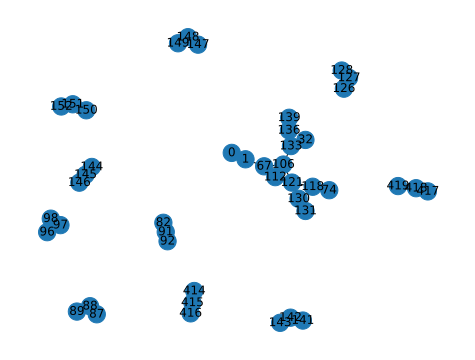

fusion  (139, 414)  success
in dfs for graph with nodes [0, 1, 32, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 133, 136, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 415, 416, 417, 418, 419] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (139, 414), (133, 417), (416, 419), (136, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


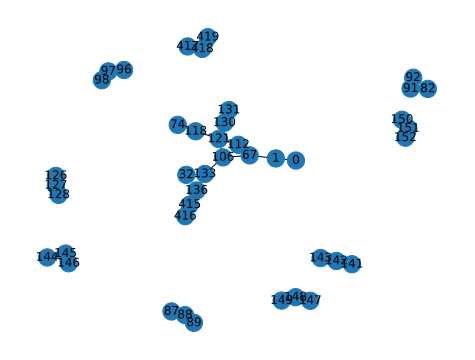

fusion  (133, 417)  success
fusion failure  133 417
rebuilding vertex 133
connected components for neighbor 32 : {32}
connected components for neighbor 106 : {0, 1, 130, 67, 131, 106, 74, 112, 118, 121}
set initial ghz as  (133, 106, 423) fusing the last with neighbor 106
add singular vertex 32
add subgraph of neighbor 136
rebuilding vertex 417
connected components for neighbor 418 : {418, 419}
set initial ghz as  (417, 418, 419)
vertex map: {133: 427, 106: 421, 32: 425, 136: 430, 417: 434, 418: 433, 419: 432}
in dfs for graph with nodes [0, 1, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 118, 121, 126, 127, 128, 130, 131, 136, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 415, 416, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), 

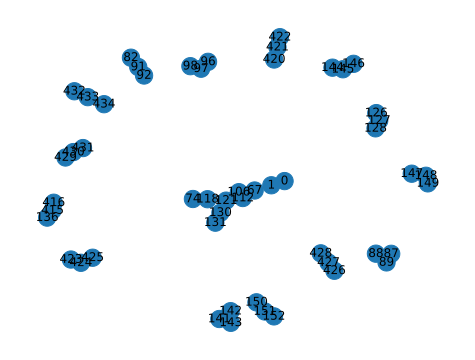

fusion  (106, 420)  success
in dfs for graph with nodes [0, 1, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 112, 118, 121, 126, 127, 128, 130, 131, 136, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 415, 416, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (106, 420), (422, 423), (424, 426), (428, 429), (431, 136), (427, 434), (416, 432), (430, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


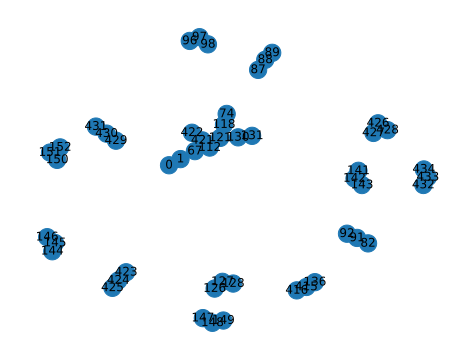

fusion  (422, 423)  success
in dfs for graph with nodes [0, 1, 67, 74, 82, 87, 88, 89, 91, 92, 96, 97, 98, 112, 118, 121, 126, 127, 128, 130, 131, 136, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 415, 416, 421, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (109, 114), (116, 117), (119, 73), (115, 120), (124, 129), (58, 132), (134, 135), (106, 420), (422, 423), (424, 426), (428, 429), (431, 136), (427, 434), (416, 432), (430, 141), (143, 144), (146, 82), (142, 147), (149, 150), (152, 118), (131, 148), (121, 128), (126, 96), (92, 97), (145, 89), (74, 87)]


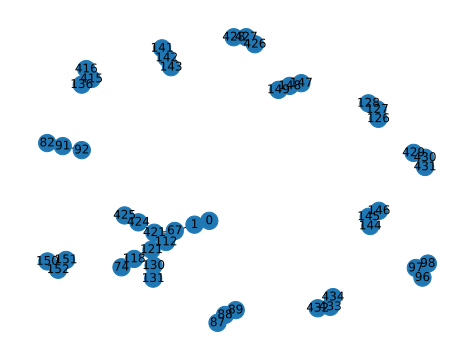

fusion  (424, 426)  success
fusion failure  424 426
rebuilding vertex 424
connected components for neighbor 425 : {425}
connected components for neighbor 421 : {0, 1, 130, 67, 131, 421, 74, 112, 118, 121}
set initial ghz as  (424, 421, 438) fusing the last with neighbor 421
add singular vertex 425
rebuilding vertex 426
connected components for neighbor 427 : {427, 428}
set initial ghz as  (426, 427, 428)
vertex map: {424: 439, 421: 436, 425: 440, 426: 443, 427: 442, 428: 441}
fusion failure  422 423
rebuilding vertex 422
connected components for neighbor 421 : {0, 1, 130, 67, 131, 421, 74, 112, 118, 121}
set initial ghz as  (422, 421, 447) fusing the last with neighbor 421
rebuilding vertex 423
connected components for neighbor 424 : {424, 425}
set initial ghz as  (423, 424, 425)
vertex map: {422: 446, 421: 445, 423: 449, 424: 448, 425: 447}
fusion failure  106 420
rebuilding vertex 106
connected components for neighbor 67 : {0, 1, 130, 67, 131, 74, 112, 118, 121}
set initial ghz as  (

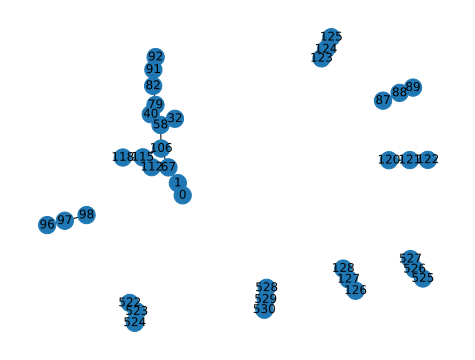

fusion  (118, 522)  success
fusion failure  118 522
rebuilding vertex 118
connected components for neighbor 115 : {32, 1, 0, 67, 40, 106, 79, 112, 82, 115, 58, 91, 92}
set initial ghz as  (118, 115, 534) fusing the last with neighbor 115
rebuilding vertex 522
connected components for neighbor 523 : {523, 524}
set initial ghz as  (522, 523, 524)
vertex map: {118: 533, 115: 532, 522: 536, 523: 535, 524: 534}
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 115, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 531, 532, 533, 534, 535, 536] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (113, 7), (115, 531), (533, 536), (79, 525), (5

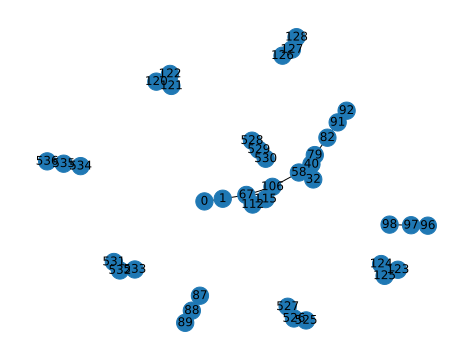

fusion  (115, 531)  success
fusion failure  115 531
rebuilding vertex 115
connected components for neighbor 106 : {32, 1, 0, 67, 40, 106, 79, 112, 82, 58, 91, 92}
set initial ghz as  (115, 106, 540) fusing the last with neighbor 106
add subgraph of neighbor 112
rebuilding vertex 531
connected components for neighbor 532 : {532, 533}
set initial ghz as  (531, 532, 533)
vertex map: {115: 541, 106: 538, 112: 544, 531: 548, 532: 547, 533: 546}
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 112, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 537, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105

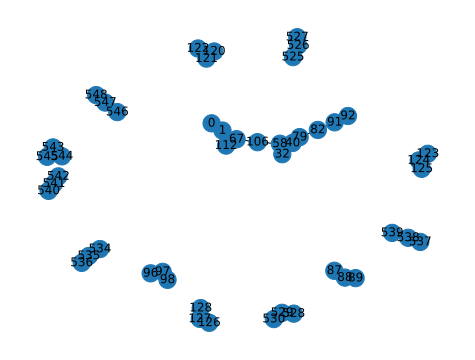

fusion  (106, 537)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 112, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 539, 540, 541, 542, 543, 544, 545, 546, 547, 548] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (542, 543), (545, 112), (541, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


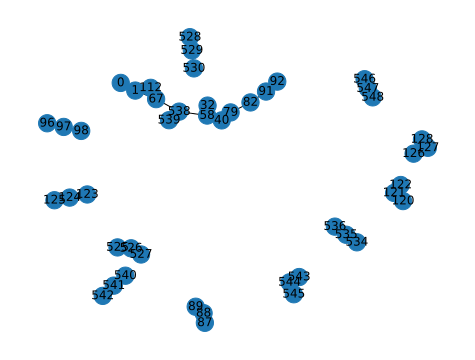

fusion  (539, 540)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 112, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 541, 542, 543, 544, 545, 546, 547, 548] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (542, 543), (545, 112), (541, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


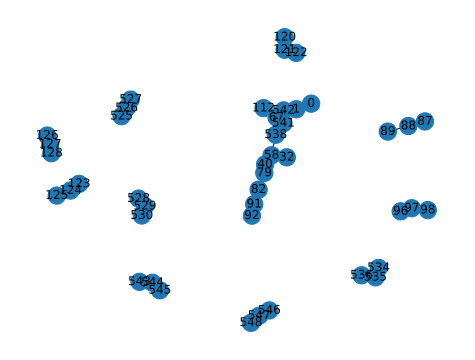

fusion  (542, 543)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 112, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 541, 544, 545, 546, 547, 548] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (542, 543), (545, 112), (541, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


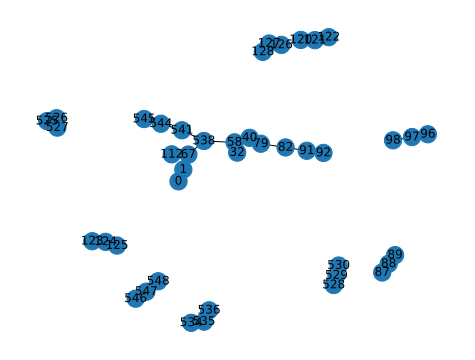

fusion  (545, 112)  success
fusion failure  545 112
rebuilding vertex 545
connected components for neighbor 544 : {544, 1, 32, 67, 58, 0, 40, 79, 82, 538, 91, 92, 541}
set initial ghz as  (545, 544, 552) fusing the last with neighbor 544
rebuilding vertex 112
connected components for neighbor 67 : {0, 1, 32, 67, 58, 544, 40, 79, 82, 538, 91, 92, 541}
set initial ghz as  (112, 67, 555) fusing the last with neighbor 67
vertex map: {545: 551, 544: 550, 112: 554, 67: 553}
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 541, 544, 546, 547, 548, 549, 550, 551, 552, 553, 554] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78),

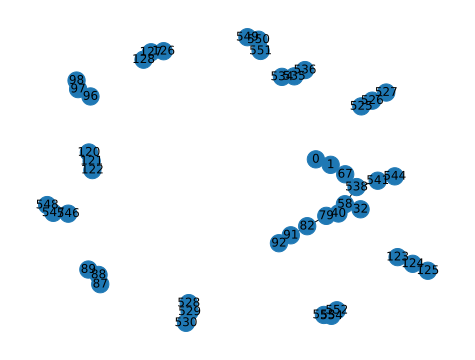

fusion  (544, 549)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 541, 546, 547, 548, 550, 551, 552, 553, 554] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (544, 549), (67, 552), (551, 554), (541, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


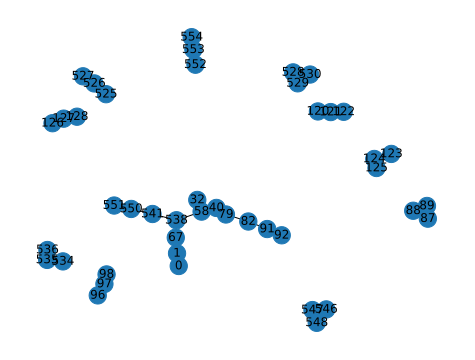

fusion  (67, 552)  success
fusion failure  67 552
rebuilding vertex 67
connected components for neighbor 1 : {0, 1}
set initial ghz as  (67, 1, 0)
add subgraph of neighbor 538
rebuilding vertex 552
connected components for neighbor 553 : {553, 554}
set initial ghz as  (552, 553, 554)
vertex map: {67: 559, 1: 556, 0: 555, 538: 562, 552: 566, 553: 565, 554: 564}
in dfs for graph with nodes [32, 40, 58, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 541, 546, 547, 548, 550, 551, 555, 556, 557, 558, 559, 560, 561, 562, 563, 564, 565, 566] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (56

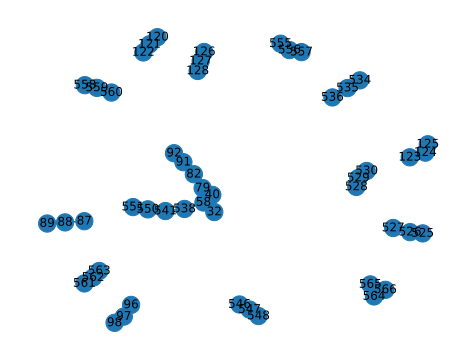

fusion  (557, 558)  success
in dfs for graph with nodes [32, 40, 58, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 541, 546, 547, 548, 550, 551, 555, 556, 559, 560, 561, 562, 563, 564, 565, 566] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (560, 561), (563, 538), (559, 566), (551, 564), (541, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


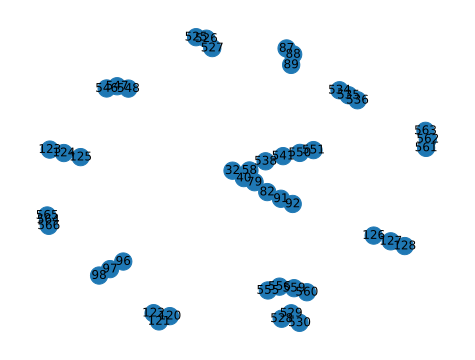

fusion  (560, 561)  success
in dfs for graph with nodes [32, 40, 58, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 538, 541, 546, 547, 548, 550, 551, 555, 556, 559, 562, 563, 564, 565, 566] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (560, 561), (563, 538), (559, 566), (551, 564), (541, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


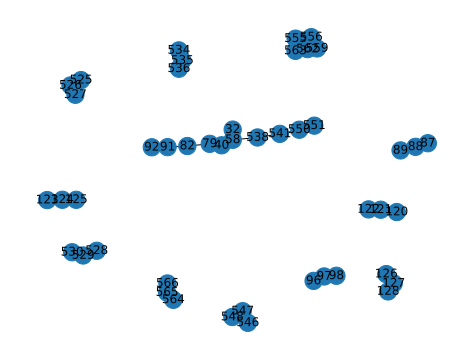

fusion  (563, 538)  success
fusion failure  563 538
rebuilding vertex 563
connected components for neighbor 562 : {562, 555, 556, 559}
set initial ghz as  (563, 562, 570) fusing the last with neighbor 562
rebuilding vertex 538
connected components for neighbor 58 : {32, 40, 79, 82, 58, 91, 92}
set initial ghz as  (538, 58, 573) fusing the last with neighbor 58
add subgraph of neighbor 541
vertex map: {563: 569, 562: 568, 538: 574, 58: 571, 541: 577}
in dfs for graph with nodes [32, 40, 58, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 562, 564, 565, 566, 567, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (1

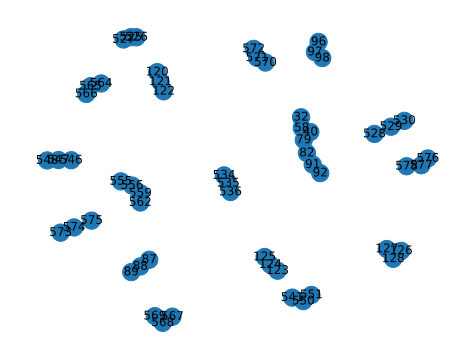

fusion  (562, 567)  success
in dfs for graph with nodes [32, 40, 58, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 570, 571, 572, 573, 574, 575, 576, 577, 578] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (562, 567), (58, 570), (572, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


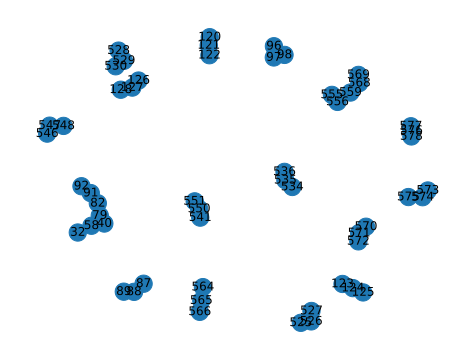

fusion  (58, 570)  success
in dfs for graph with nodes [32, 40, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 571, 572, 573, 574, 575, 576, 577, 578] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (562, 567), (58, 570), (572, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


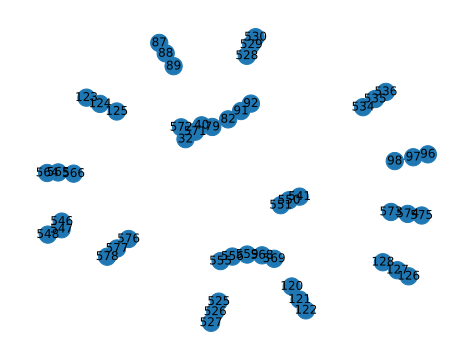

fusion  (572, 573)  success
in dfs for graph with nodes [32, 40, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 571, 574, 575, 576, 577, 578] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (562, 567), (58, 570), (572, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


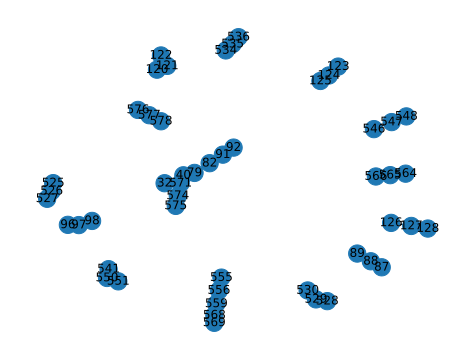

fusion  (575, 576)  success
in dfs for graph with nodes [32, 40, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 571, 574, 577, 578] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (562, 567), (58, 570), (572, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (79, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


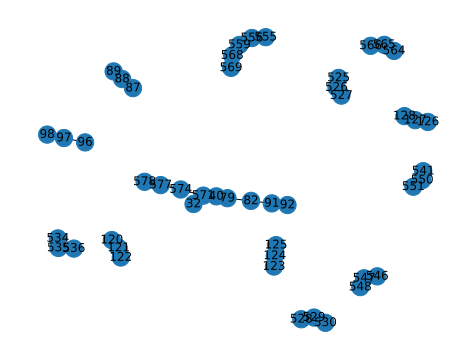

fusion  (578, 541)  success
fusion failure  578 541
rebuilding vertex 578
connected components for neighbor 577 : {32, 577, 40, 91, 79, 82, 571, 92, 574}
set initial ghz as  (578, 577, 582) fusing the last with neighbor 577
rebuilding vertex 541
connected components for neighbor 550 : {550, 551}
set initial ghz as  (541, 550, 551)
vertex map: {578: 581, 577: 580, 541: 584, 550: 583, 551: 582}
fusion failure  575 576
rebuilding vertex 575
connected components for neighbor 574 : {32, 40, 91, 79, 82, 571, 92, 574}
set initial ghz as  (575, 574, 588) fusing the last with neighbor 574
rebuilding vertex 576
connected components for neighbor 577 : {577, 578}
set initial ghz as  (576, 577, 578)
vertex map: {575: 587, 574: 586, 576: 590, 577: 589, 578: 588}
fusion failure  572 573
rebuilding vertex 572
connected components for neighbor 571 : {32, 40, 91, 79, 82, 571, 92}
set initial ghz as  (572, 571, 594) fusing the last with neighbor 571
rebuilding vertex 573
connected components for neighbor

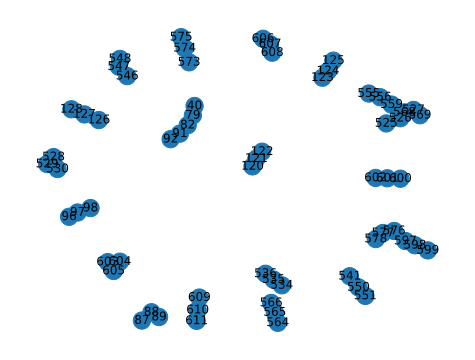

fusion  (40, 597)  success
in dfs for graph with nodes [79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 599, 600, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (605, 606), (608, 79), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (607, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 

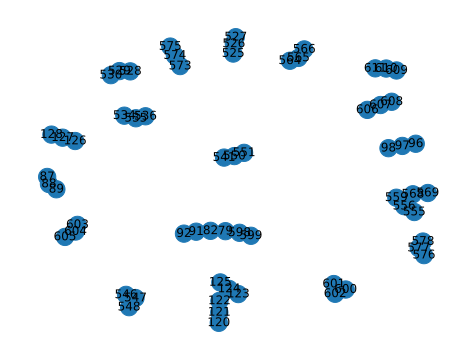

fusion  (599, 600)  success
in dfs for graph with nodes [79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (605, 606), (608, 79), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (607, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530

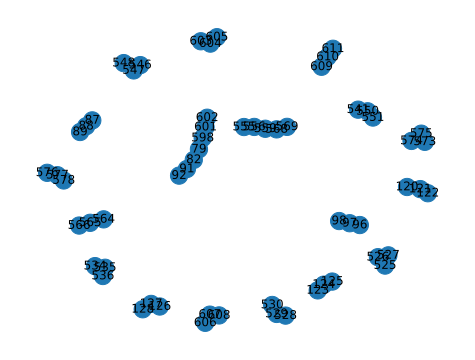

fusion  (601, 603)  success
in dfs for graph with nodes [79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 602, 604, 605, 606, 607, 608, 609, 610, 611] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (605, 606), (608, 79), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (607, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


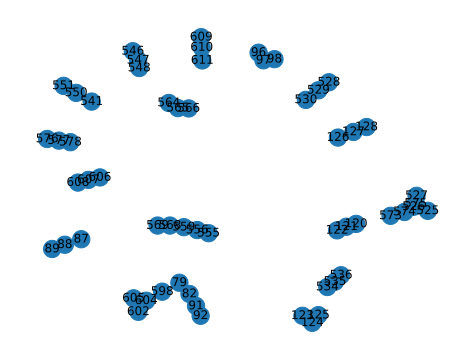

fusion  (605, 606)  success
in dfs for graph with nodes [79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 602, 604, 607, 608, 609, 610, 611] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (605, 606), (608, 79), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (607, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 128), (126, 96), (92, 97), (82, 89), (530, 87)]


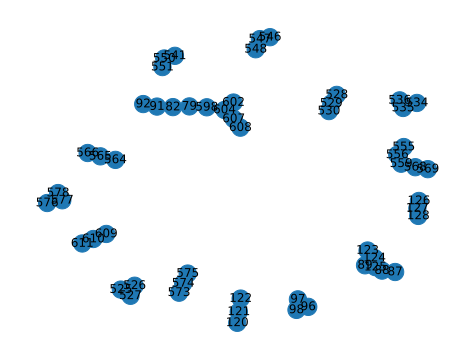

fusion  (608, 79)  success
fusion failure  608 79
rebuilding vertex 608
connected components for neighbor 607 : {602, 604, 598, 607}
set initial ghz as  (608, 607, 615) fusing the last with neighbor 607
rebuilding vertex 79
connected components for neighbor 82 : {82, 91, 92}
set initial ghz as  (79, 82, 618) fusing the last with neighbor 82
add subgraph of neighbor 598
vertex map: {608: 614, 607: 613, 79: 619, 82: 616, 598: 622}
in dfs for graph with nodes [82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 602, 604, 607, 609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 623] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41

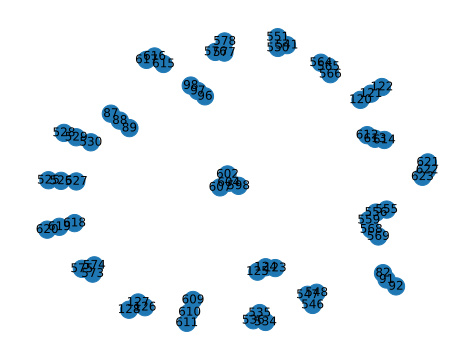

fusion  (607, 612)  success
in dfs for graph with nodes [82, 87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 602, 604, 609, 610, 611, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 623] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (607, 612), (82, 615), (617, 618), (620, 621), (623, 598), (614, 619), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (613, 525), (527, 528), (534, 529), (547, 120), (1

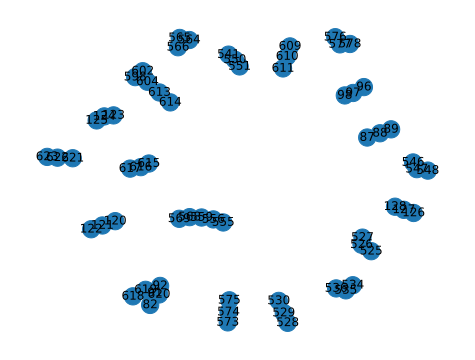

fusion  (82, 615)  success
in dfs for graph with nodes [87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 602, 604, 609, 610, 611, 613, 614, 616, 617, 618, 619, 620, 621, 622, 623] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (607, 612), (82, 615), (617, 618), (620, 621), (623, 598), (614, 619), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (613, 525), (527, 528), (534, 529), (547, 120), (122, 123), 

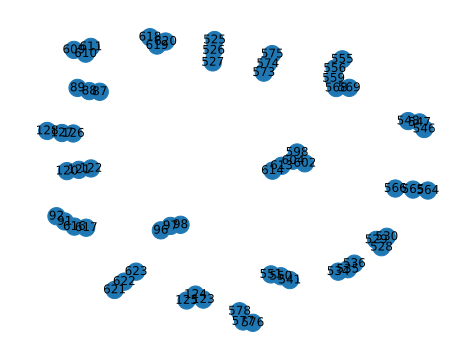

fusion  (617, 618)  success
in dfs for graph with nodes [87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 602, 604, 609, 610, 611, 613, 614, 616, 619, 620, 621, 622, 623] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (607, 612), (82, 615), (617, 618), (620, 621), (623, 598), (614, 619), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (613, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526

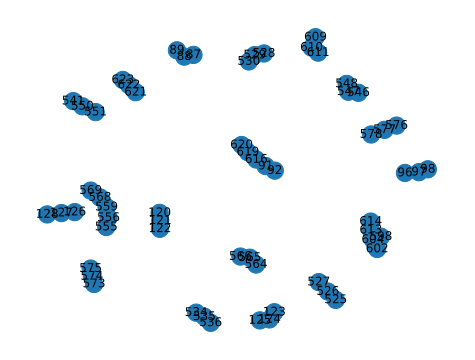

fusion  (620, 621)  success
in dfs for graph with nodes [87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 598, 602, 604, 609, 610, 611, 613, 614, 616, 619, 622, 623] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (607, 612), (82, 615), (617, 618), (620, 621), (623, 598), (614, 619), (604, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (613, 525), (527, 528), (534, 529), (547, 120), (122, 123), (125, 526), (121, 1

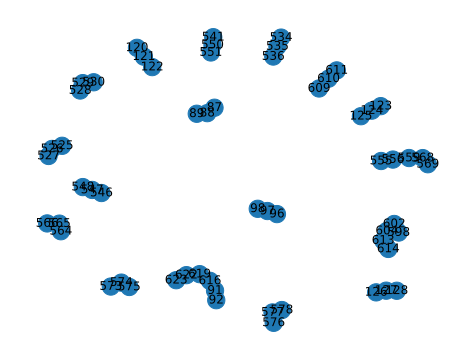

fusion  (623, 598)  success
fusion failure  623 598
rebuilding vertex 623
connected components for neighbor 622 : {616, 619, 622, 91, 92}
set initial ghz as  (623, 622, 627) fusing the last with neighbor 622
rebuilding vertex 598
connected components for neighbor 604 : {602, 604, 613, 614}
set initial ghz as  (598, 604, 630) fusing the last with neighbor 604
vertex map: {623: 626, 622: 625, 598: 629, 604: 628}
in dfs for graph with nodes [87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 602, 604, 609, 610, 611, 613, 614, 616, 619, 622, 624, 625, 626, 627, 628, 629] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12

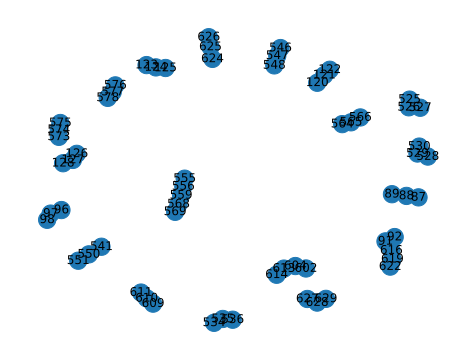

fusion  (622, 624)  success
in dfs for graph with nodes [87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 602, 604, 609, 610, 611, 613, 614, 616, 619, 625, 626, 627, 628, 629] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (110, 111), (106, 537), (539, 540), (557, 558), (40, 597), (599, 600), (601, 603), (607, 612), (82, 615), (617, 618), (622, 624), (604, 627), (626, 629), (614, 619), (628, 611), (609, 573), (575, 576), (578, 541), (569, 574), (559, 566), (551, 564), (577, 548), (546, 536), (613, 525), (527, 528), (534, 529), (547, 120), (122, 123

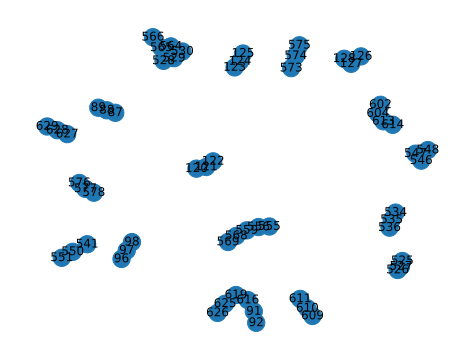

fusion  (604, 627)  success
fusion failure  604 627
rebuilding vertex 604
connected components for neighbor 602 : {602}
connected components for neighbor 613 : {613, 614}
set initial ghz as  (604, 613, 614)
add singular vertex 602
rebuilding vertex 627
connected components for neighbor 628 : {628, 629}
set initial ghz as  (627, 628, 629)
vertex map: {604: 634, 613: 631, 614: 630, 602: 635, 627: 638, 628: 637, 629: 636}
fusion failure  622 624
rebuilding vertex 622
connected components for neighbor 619 : {616, 91, 619, 92}
set initial ghz as  (622, 619, 642) fusing the last with neighbor 619
rebuilding vertex 624
connected components for neighbor 625 : {625, 626}
set initial ghz as  (624, 625, 626)
vertex map: {622: 641, 619: 640, 624: 644, 625: 643, 626: 642}
in dfs for graph with nodes [87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574,

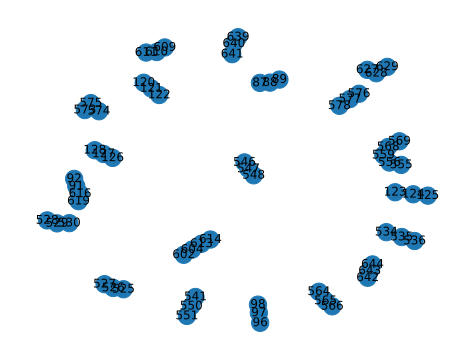

fusion  (619, 639)  success
fusion failure  619 639
rebuilding vertex 619
connected components for neighbor 616 : {616, 91, 92}
set initial ghz as  (619, 616, 648) fusing the last with neighbor 616
rebuilding vertex 639
connected components for neighbor 640 : {640, 641}
set initial ghz as  (639, 640, 641)
vertex map: {619: 647, 616: 646, 639: 650, 640: 649, 641: 648}
in dfs for graph with nodes [87, 88, 89, 91, 92, 96, 97, 98, 120, 121, 122, 123, 124, 125, 126, 127, 128, 525, 526, 527, 528, 529, 530, 534, 535, 536, 541, 546, 547, 548, 550, 551, 555, 556, 559, 564, 565, 566, 568, 569, 573, 574, 575, 576, 577, 578, 602, 604, 609, 610, 611, 613, 614, 616, 627, 628, 629, 642, 643, 644, 645, 646, 647, 648, 649, 650] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (6

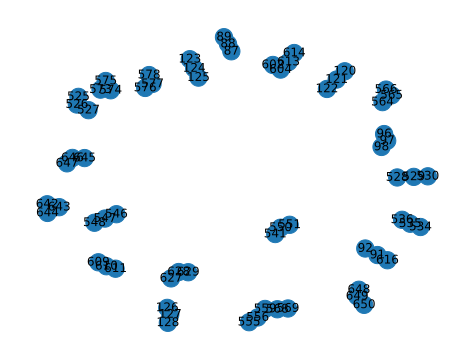

fusion  (616, 645)  success
fusion failure  616 645
rebuilding vertex 616
connected components for neighbor 91 : {91, 92}
set initial ghz as  (616, 91, 92)
rebuilding vertex 645
connected components for neighbor 646 : {646, 647}
set initial ghz as  (645, 646, 647)
vertex map: {616: 653, 91: 652, 92: 651, 645: 656, 646: 655, 647: 654}
fusion failure  620 621
rebuilding vertex 620
connected components for neighbor 619 : {616, 91, 619, 92}
set initial ghz as  (620, 619, 660) fusing the last with neighbor 619
rebuilding vertex 621
connected components for neighbor 622 : {622, 623}
set initial ghz as  (621, 622, 623)
vertex map: {620: 659, 619: 658, 621: 662, 622: 661, 623: 660}
fusion failure  617 618
rebuilding vertex 617
connected components for neighbor 616 : {616, 91, 92}
set initial ghz as  (617, 616, 666) fusing the last with neighbor 616
rebuilding vertex 618
connected components for neighbor 619 : {619, 620}
set initial ghz as  (618, 619, 620)
vertex map: {617: 665, 616: 664, 618: 

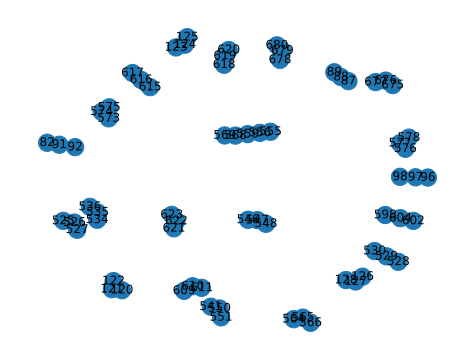

fusion  (604, 675)  success
fusion failure  604 675
rebuilding vertex 604
connected components for neighbor 602 : {602}
connected components for neighbor 598 : {598}
set initial ghz by choosing the first two elements of [602, 598]
rebuilding vertex 675
connected components for neighbor 676 : {676, 677}
set initial ghz as  (675, 676, 677)
vertex map: {602: 683, 604: 682, 598: 681, 675: 686, 676: 685, 677: 684}
fusion failure  605 606
rebuilding vertex 605
connected components for neighbor 604 : {79, 92, 82, 598, 602, 91, 604}
set initial ghz as  (605, 604, 690) fusing the last with neighbor 604
rebuilding vertex 606
connected components for neighbor 607 : {608, 607}
set initial ghz as  (606, 607, 608)
vertex map: {605: 689, 604: 688, 606: 692, 607: 691, 608: 690}
fusion failure  601 603
rebuilding vertex 601
connected components for neighbor 602 : {602}
connected components for neighbor 598 : {79, 82, 598, 91, 92}
set initial ghz as  (601, 598, 696) fusing the last with neighbor 598
add

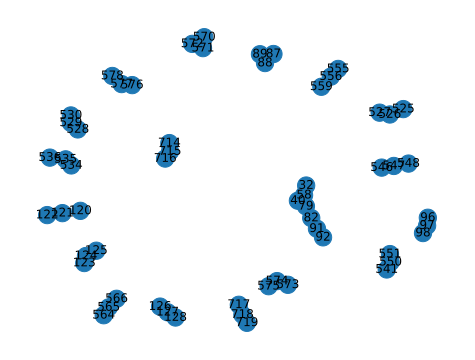

fusion  (559, 714)  success
fusion failure  559 714
rebuilding vertex 559
connected components for neighbor 556 : {555, 556}
set initial ghz as  (559, 556, 555)
rebuilding vertex 714
connected components for neighbor 715 : {715, 716}
set initial ghz as  (714, 715, 716)
vertex map: {559: 722, 556: 721, 555: 720, 714: 725, 715: 724, 716: 723}
fusion failure  560 561
rebuilding vertex 560
connected components for neighbor 559 : {555, 556, 559}
set initial ghz as  (560, 559, 729) fusing the last with neighbor 559
rebuilding vertex 561
connected components for neighbor 562 : {562, 563}
set initial ghz as  (561, 562, 563)
vertex map: {560: 728, 559: 727, 561: 731, 562: 730, 563: 729}
fusion failure  557 558
rebuilding vertex 557
connected components for neighbor 556 : {555, 556}
set initial ghz as  (557, 556, 555)
rebuilding vertex 558
connected components for neighbor 559 : {560, 559}
set initial ghz as  (558, 559, 560)
vertex map: {557: 734, 556: 733, 555: 732, 558: 737, 559: 736, 560: 735

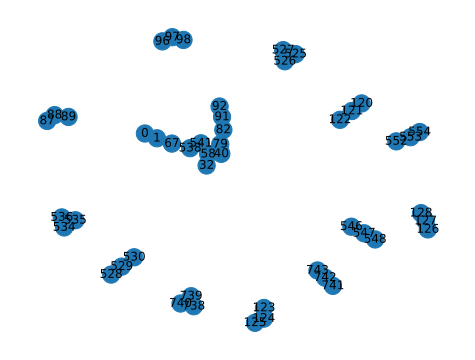

fusion  (541, 738)  success
fusion failure  541 738
rebuilding vertex 541
connected components for neighbor 538 : {32, 1, 0, 67, 58, 40, 79, 82, 538, 91, 92}
set initial ghz as  (541, 538, 747) fusing the last with neighbor 538
rebuilding vertex 738
connected components for neighbor 739 : {739, 740}
set initial ghz as  (738, 739, 740)
vertex map: {541: 746, 538: 745, 738: 749, 739: 748, 740: 747}
fusion failure  542 543
rebuilding vertex 542
connected components for neighbor 541 : {32, 1, 0, 67, 58, 40, 79, 112, 82, 538, 91, 92, 541}
set initial ghz as  (542, 541, 753) fusing the last with neighbor 541
rebuilding vertex 543
connected components for neighbor 544 : {544, 545}
set initial ghz as  (543, 544, 545)
vertex map: {542: 752, 541: 751, 543: 755, 544: 754, 545: 753}
fusion failure  539 540
rebuilding vertex 539
connected components for neighbor 538 : {32, 1, 0, 67, 58, 40, 79, 112, 82, 538, 91, 92}
set initial ghz as  (539, 538, 759) fusing the last with neighbor 538
rebuilding ve

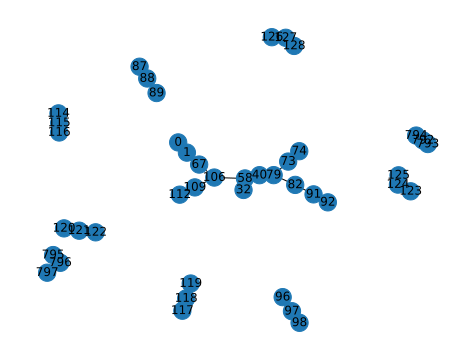

fusion  (112, 792)  success
in dfs for graph with nodes [0, 1, 32, 40, 58, 67, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 795, 796, 797] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (112, 792), (67, 795), (794, 797), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


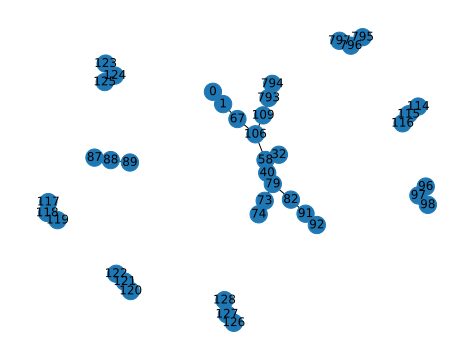

fusion  (67, 795)  success
fusion failure  67 795
rebuilding vertex 67
connected components for neighbor 1 : {0, 1}
set initial ghz as  (67, 1, 0)
add subgraph of neighbor 106
rebuilding vertex 795
connected components for neighbor 796 : {796, 797}
set initial ghz as  (795, 796, 797)
vertex map: {67: 802, 1: 799, 0: 798, 106: 805, 795: 809, 796: 808, 797: 807}
in dfs for graph with nodes [32, 40, 58, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807, 808, 809] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (803, 804), (806, 106), (802, 809), (794, 807), (109, 114), (

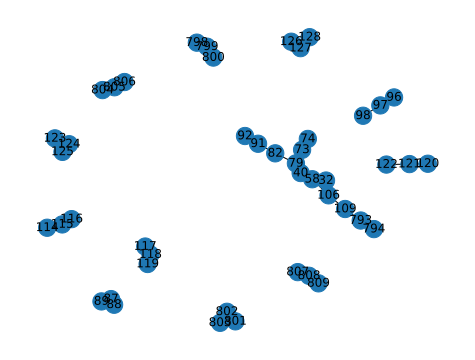

fusion  (800, 801)  success
in dfs for graph with nodes [32, 40, 58, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 803, 804, 805, 806, 807, 808, 809] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (803, 804), (806, 106), (802, 809), (794, 807), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


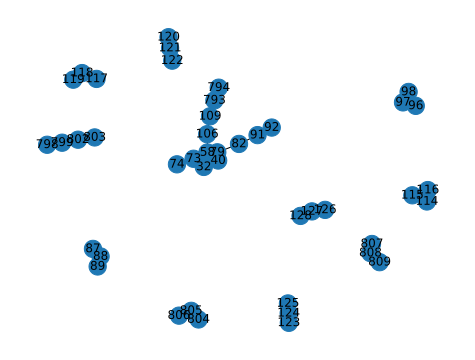

fusion  (803, 804)  success
in dfs for graph with nodes [32, 40, 58, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 106, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 805, 806, 807, 808, 809] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (803, 804), (806, 106), (802, 809), (794, 807), (109, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


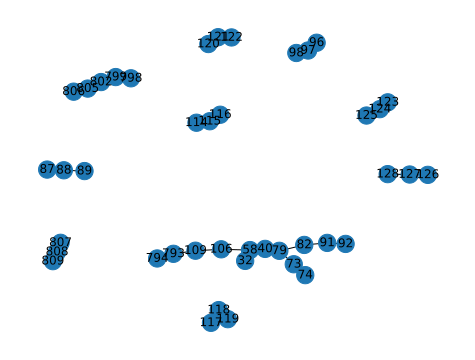

fusion  (806, 106)  success
fusion failure  806 106
rebuilding vertex 806
connected components for neighbor 805 : {802, 805, 798, 799}
set initial ghz as  (806, 805, 813) fusing the last with neighbor 805
rebuilding vertex 106
connected components for neighbor 58 : {32, 40, 73, 74, 79, 82, 58, 91, 92}
set initial ghz as  (106, 58, 816) fusing the last with neighbor 58
add subgraph of neighbor 109
vertex map: {806: 812, 805: 811, 106: 817, 58: 814, 109: 820}
in dfs for graph with nodes [32, 40, 58, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 805, 807, 808, 809, 810, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 4

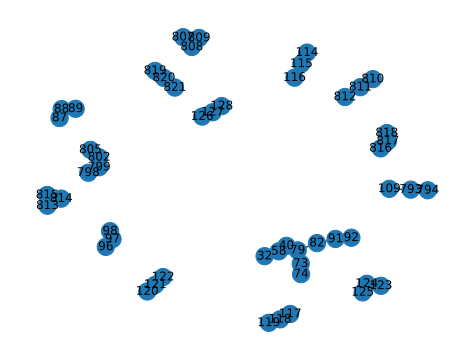

fusion  (805, 810)  success
in dfs for graph with nodes [32, 40, 58, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 821] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (805, 810), (58, 813), (815, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


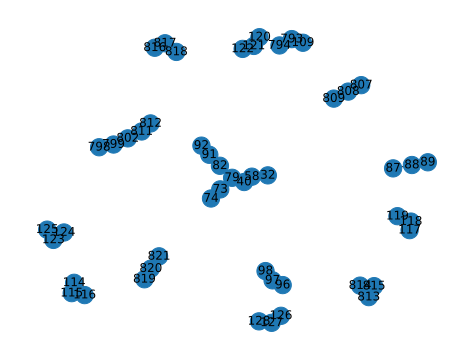

fusion  (58, 813)  success
in dfs for graph with nodes [32, 40, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 814, 815, 816, 817, 818, 819, 820, 821] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (805, 810), (58, 813), (815, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


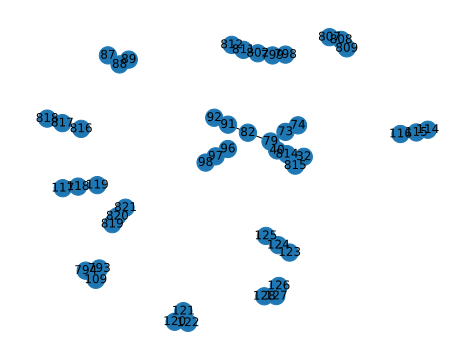

fusion  (815, 816)  success
in dfs for graph with nodes [32, 40, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 814, 817, 818, 819, 820, 821] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (805, 810), (58, 813), (815, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


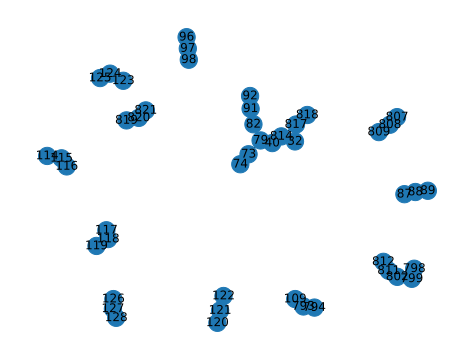

fusion  (818, 819)  success
in dfs for graph with nodes [32, 40, 73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 814, 817, 820, 821] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (805, 810), (58, 813), (815, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 79), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


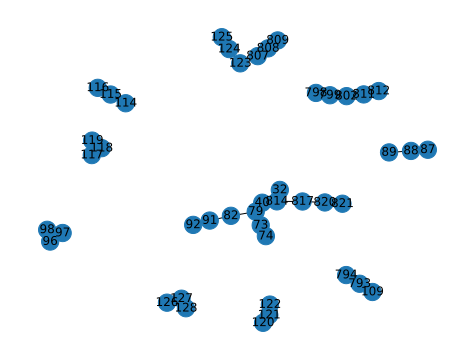

fusion  (821, 109)  success
fusion failure  821 109
rebuilding vertex 821
connected components for neighbor 820 : {32, 40, 73, 74, 814, 79, 817, 82, 820, 91, 92}
set initial ghz as  (821, 820, 825) fusing the last with neighbor 820
rebuilding vertex 109
connected components for neighbor 793 : {793, 794}
set initial ghz as  (109, 793, 794)
vertex map: {821: 824, 820: 823, 109: 827, 793: 826, 794: 825}
fusion failure  818 819
rebuilding vertex 818
connected components for neighbor 817 : {32, 40, 73, 74, 814, 79, 817, 82, 91, 92}
set initial ghz as  (818, 817, 831) fusing the last with neighbor 817
rebuilding vertex 819
connected components for neighbor 820 : {820, 821}
set initial ghz as  (819, 820, 821)
vertex map: {818: 830, 817: 829, 819: 833, 820: 832, 821: 831}
fusion failure  815 816
rebuilding vertex 815
connected components for neighbor 814 : {32, 40, 73, 74, 814, 79, 82, 91, 92}
set initial ghz as  (815, 814, 837) fusing the last with neighbor 814
rebuilding vertex 816
connected

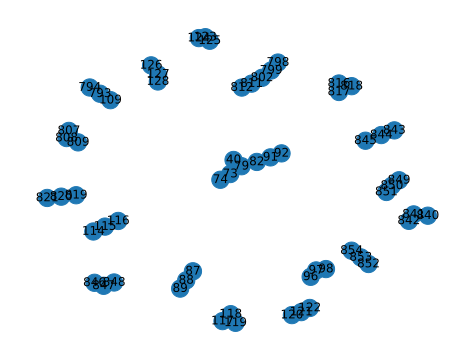

fusion  (40, 840)  success
in dfs for graph with nodes [73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 816, 817, 818, 819, 820, 821, 841, 842, 843, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (40, 840), (842, 843), (844, 846), (848, 849), (851, 79), (847, 854), (852, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 850), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


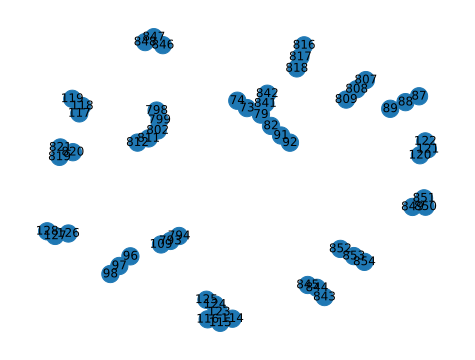

fusion  (842, 843)  success
in dfs for graph with nodes [73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 816, 817, 818, 819, 820, 821, 841, 844, 845, 846, 847, 848, 849, 850, 851, 852, 853, 854] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (40, 840), (842, 843), (844, 846), (848, 849), (851, 79), (847, 854), (852, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 850), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


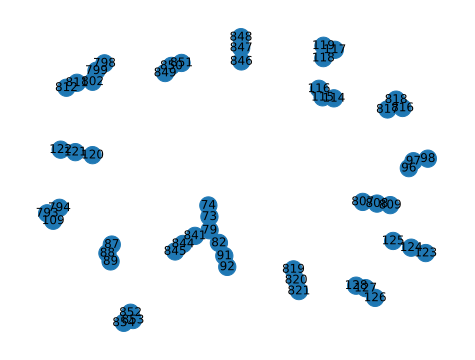

fusion  (844, 846)  success
in dfs for graph with nodes [73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 816, 817, 818, 819, 820, 821, 841, 845, 847, 848, 849, 850, 851, 852, 853, 854] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (40, 840), (842, 843), (844, 846), (848, 849), (851, 79), (847, 854), (852, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 850), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


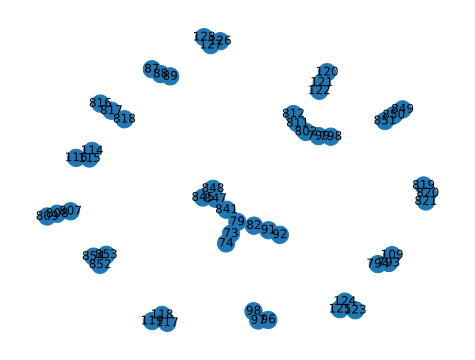

fusion  (848, 849)  success
in dfs for graph with nodes [73, 74, 79, 82, 87, 88, 89, 91, 92, 96, 97, 98, 109, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 793, 794, 798, 799, 802, 807, 808, 809, 811, 812, 816, 817, 818, 819, 820, 821, 841, 845, 847, 850, 851, 852, 853, 854] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (64, 78), (80, 81), (70, 105), (107, 108), (800, 801), (40, 840), (842, 843), (844, 846), (848, 849), (851, 79), (847, 854), (852, 816), (818, 819), (821, 109), (812, 817), (802, 809), (794, 807), (820, 114), (116, 117), (119, 73), (115, 120), (122, 123), (125, 850), (121, 128), (126, 96), (92, 97), (82, 89), (74, 87)]


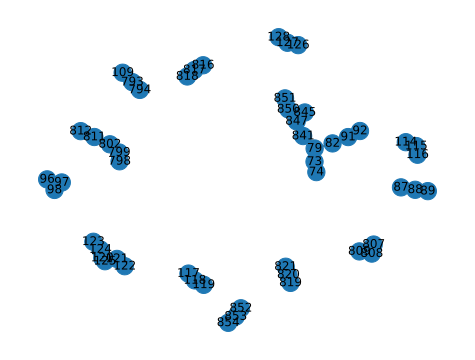

fusion  (851, 79)  success
fusion failure  851 79
rebuilding vertex 851
connected components for neighbor 850 : {841, 850, 845, 847}
set initial ghz as  (851, 850, 858) fusing the last with neighbor 850
rebuilding vertex 79
connected components for neighbor 73 : {73, 74}
set initial ghz as  (79, 73, 74)
add subgraph of neighbor 82
add subgraph of neighbor 841
vertex map: {851: 857, 850: 856, 79: 868, 73: 859, 74: 858, 82: 865, 841: 871}
fusion failure  848 849
rebuilding vertex 848
connected components for neighbor 847 : {73, 841, 74, 845, 79, 847, 82, 91, 92}
set initial ghz as  (848, 847, 876) fusing the last with neighbor 847
rebuilding vertex 849
connected components for neighbor 850 : {850, 851}
set initial ghz as  (849, 850, 851)
vertex map: {848: 875, 847: 874, 849: 878, 850: 877, 851: 876}
fusion failure  844 846
rebuilding vertex 844
connected components for neighbor 845 : {845}
connected components for neighbor 841 : {73, 841, 74, 79, 82, 91, 92}
set initial ghz as  (844, 841

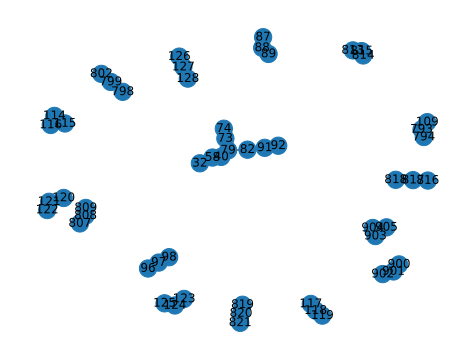

fusion  (802, 900)  success
fusion failure  802 900
rebuilding vertex 802
connected components for neighbor 799 : {798, 799}
set initial ghz as  (802, 799, 798)
rebuilding vertex 900
connected components for neighbor 901 : {901, 902}
set initial ghz as  (900, 901, 902)
vertex map: {802: 908, 799: 907, 798: 906, 900: 911, 901: 910, 902: 909}
fusion failure  803 804
rebuilding vertex 803
connected components for neighbor 802 : {802, 798, 799}
set initial ghz as  (803, 802, 915) fusing the last with neighbor 802
rebuilding vertex 804
connected components for neighbor 805 : {805, 806}
set initial ghz as  (804, 805, 806)
vertex map: {803: 914, 802: 913, 804: 917, 805: 916, 806: 915}
fusion failure  800 801
rebuilding vertex 800
connected components for neighbor 799 : {798, 799}
set initial ghz as  (800, 799, 798)
rebuilding vertex 801
connected components for neighbor 802 : {802, 803}
set initial ghz as  (801, 802, 803)
vertex map: {800: 920, 799: 919, 798: 918, 801: 923, 802: 922, 803: 921

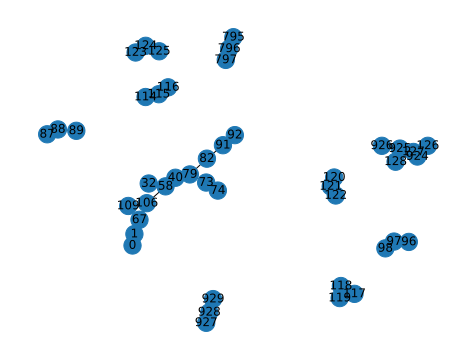

fusion  (109, 924)  success
fusion failure  109 924
rebuilding vertex 109
connected components for neighbor 106 : {32, 1, 0, 67, 40, 73, 106, 74, 79, 82, 58, 91, 92}
set initial ghz as  (109, 106, 933) fusing the last with neighbor 106
rebuilding vertex 924
connected components for neighbor 925 : {925, 926}
set initial ghz as  (924, 925, 926)
vertex map: {109: 932, 106: 931, 924: 935, 925: 934, 926: 933}
fusion failure  110 111
rebuilding vertex 110
connected components for neighbor 109 : {32, 1, 0, 67, 7, 40, 73, 106, 74, 109, 79, 82, 58, 91, 92}
set initial ghz as  (110, 109, 939) fusing the last with neighbor 109
rebuilding vertex 111
connected components for neighbor 112 : {112, 113}
set initial ghz as  (111, 112, 113)
vertex map: {110: 938, 109: 937, 111: 941, 112: 940, 113: 939}
fusion failure  107 108
rebuilding vertex 107
connected components for neighbor 106 : {32, 1, 0, 67, 7, 40, 73, 106, 74, 79, 82, 58, 91, 92}
set initial ghz as  (107, 106, 945) fusing the last with neighb

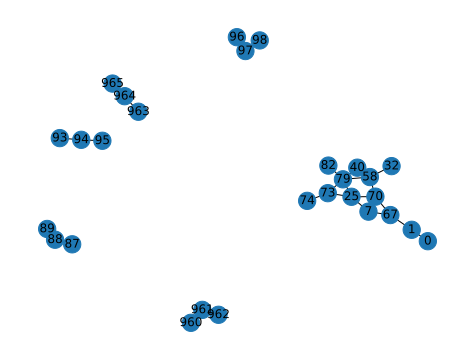

fusion  (82, 960)  success
fusion failure  82 960
rebuilding vertex 82
connected components for neighbor 79 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 79, 25, 58}
set initial ghz as  (82, 79, 969) fusing the last with neighbor 79
rebuilding vertex 960
connected components for neighbor 961 : {961, 962}
set initial ghz as  (960, 961, 962)
vertex map: {82: 968, 79: 967, 960: 971, 961: 970, 962: 969}
in dfs for graph with nodes [0, 1, 7, 25, 32, 40, 58, 67, 70, 73, 74, 79, 87, 88, 89, 93, 94, 95, 96, 97, 98, 963, 964, 965, 966, 967, 968, 969, 970, 971] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (4, 66), (79, 966), (968, 971), (969, 965), (25, 93), (95, 96), (963, 97), (970, 89), (74, 87)]


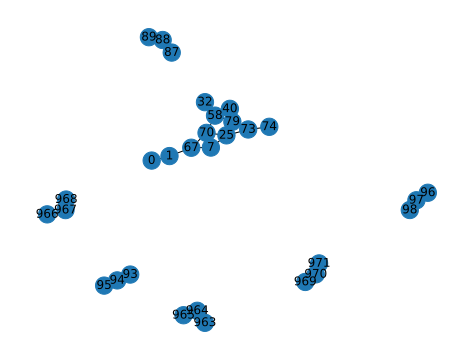

fusion  (79, 966)  success
fusion failure  79 966
rebuilding vertex 79
connected components for neighbor 25 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 25, 58}
set initial ghz as  (79, 25, 975) fusing the last with neighbor 25
add subgraph of neighbor 58
add subgraph of neighbor 40
add subgraph of neighbor 73
rebuilding vertex 966
connected components for neighbor 967 : {968, 967}
set initial ghz as  (966, 967, 968)
vertex map: {79: 988, 25: 973, 58: 979, 40: 985, 73: 991, 966: 995, 967: 994, 968: 993}
fusion failure  83 84
rebuilding vertex 83
connected components for neighbor 82 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 79, 82, 20, 22, 25, 58}
set initial ghz as  (83, 82, 999) fusing the last with neighbor 82
rebuilding vertex 84
connected components for neighbor 85 : {85, 86}
set initial ghz as  (84, 85, 86)
vertex map: {83: 998, 82: 997, 84: 1001, 85: 1000, 86: 999}
fusion failure  80 81
rebuilding vertex 80
connected components for neighbor 79 : {32, 1, 0, 67, 70, 7, 40, 73, 74, 79, 20, 22, 25,

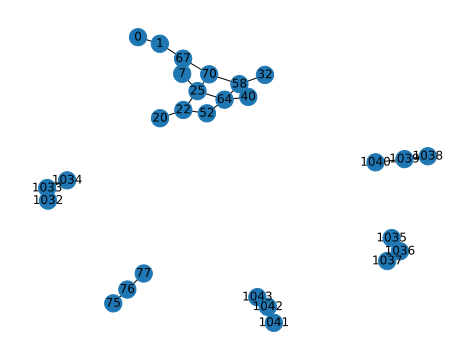

fusion  (64, 1032)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 52, 58, 67, 70, 75, 76, 77, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (64, 1032), (1034, 1035), (1037, 1038), (1040, 25), (1036, 1043), (52, 75), (1041, 77)]


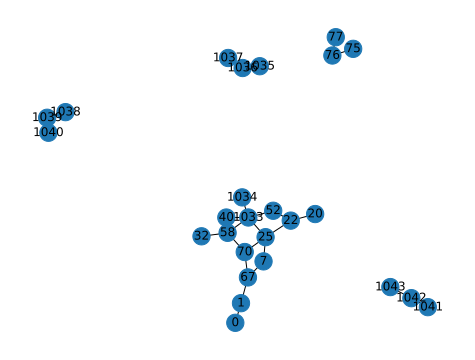

fusion  (1034, 1035)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 52, 58, 67, 70, 75, 76, 77, 1033, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (64, 1032), (1034, 1035), (1037, 1038), (1040, 25), (1036, 1043), (52, 75), (1041, 77)]


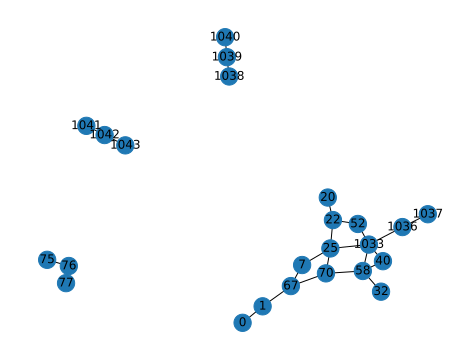

fusion  (1037, 1038)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 52, 58, 67, 70, 75, 76, 77, 1033, 1036, 1039, 1040, 1041, 1042, 1043] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (64, 1032), (1034, 1035), (1037, 1038), (1040, 25), (1036, 1043), (52, 75), (1041, 77)]


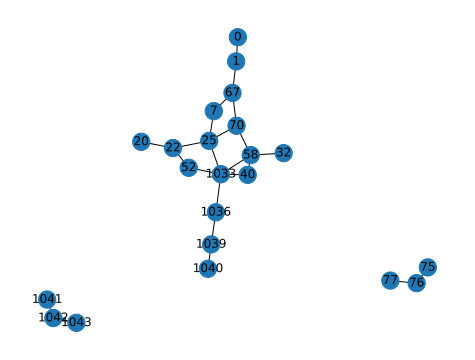

fusion  (1040, 25)  success
fusion failure  1040 25
rebuilding vertex 1040
connected components for neighbor 1039 : {32, 1, 0, 67, 70, 7, 40, 1033, 1036, 1039, 52, 20, 22, 58}
set initial ghz as  (1040, 1039, 1047) fusing the last with neighbor 1039
rebuilding vertex 25
connected components for neighbor 22 : {32, 1, 0, 67, 70, 7, 40, 1033, 1036, 1039, 20, 52, 22, 58}
set initial ghz as  (25, 22, 1050) fusing the last with neighbor 22
add subgraph of neighbor 70
add subgraph of neighbor 7
add subgraph of neighbor 1033
vertex map: {1040: 1046, 1039: 1045, 25: 1063, 22: 1048, 70: 1054, 7: 1060, 1033: 1066}
fusion failure  1037 1038
rebuilding vertex 1037
connected components for neighbor 1036 : {32, 1, 0, 67, 70, 7, 40, 1033, 1036, 52, 20, 22, 25, 58}
set initial ghz as  (1037, 1036, 1071) fusing the last with neighbor 1036
rebuilding vertex 1038
connected components for neighbor 1039 : {1040, 1039}
set initial ghz as  (1038, 1039, 1040)
vertex map: {1037: 1070, 1036: 1069, 1038: 1073, 10

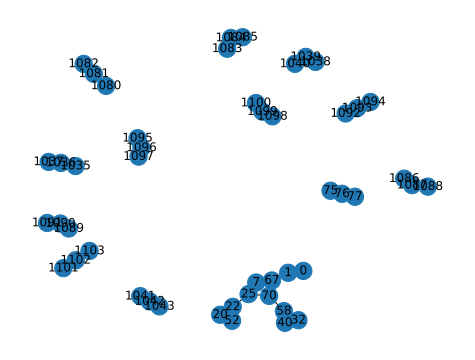

fusion  (52, 1080)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


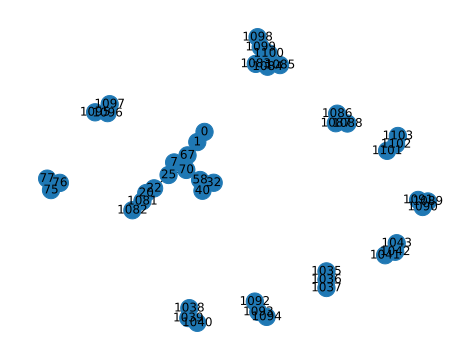

fusion  (1082, 1083)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1085, 1086, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


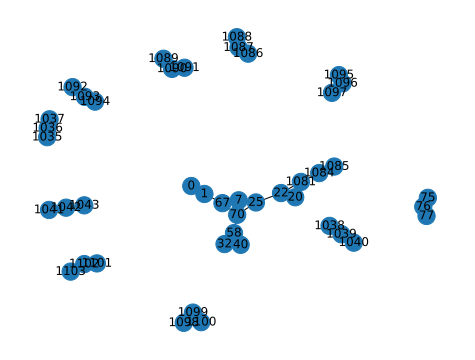

fusion  (1085, 1086)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1087, 1088, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


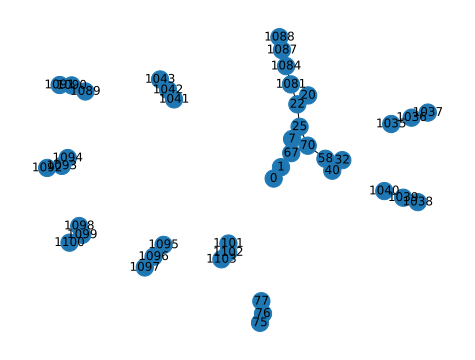

fusion  (1088, 25)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1087, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


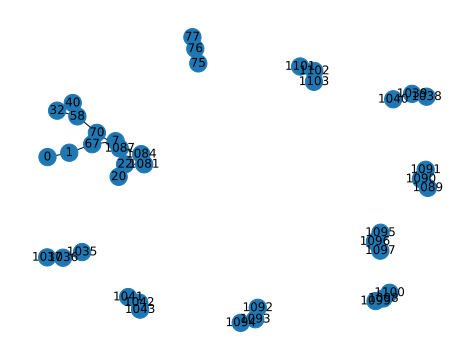

fusion  (1084, 1089)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


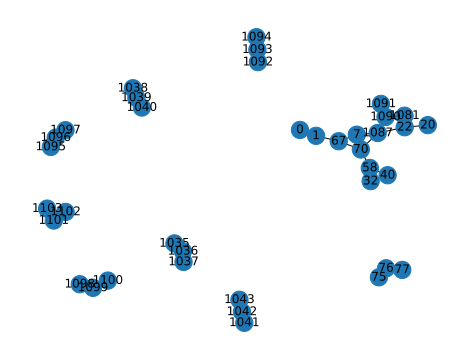

fusion  (1091, 1092)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1090, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


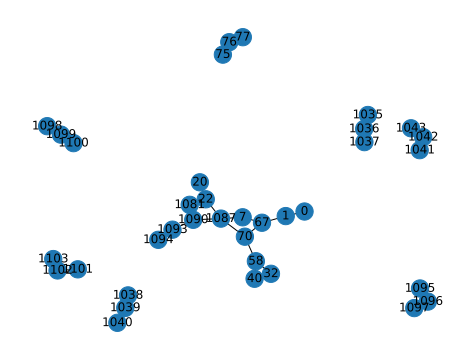

fusion  (1094, 58)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 40, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1090, 1093, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


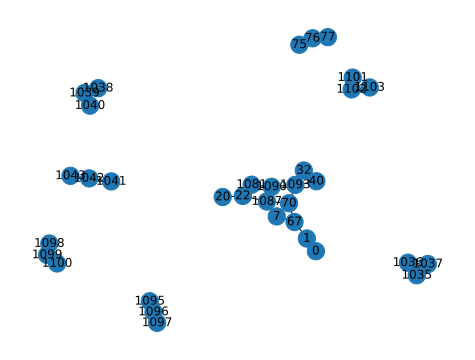

fusion  (1090, 1095)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 40, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1093, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


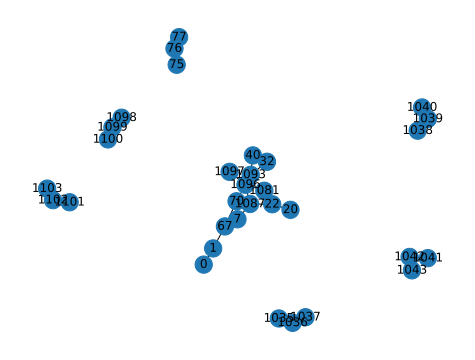

fusion  (1097, 1098)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 40, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1093, 1096, 1099, 1100, 1101, 1102, 1103] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


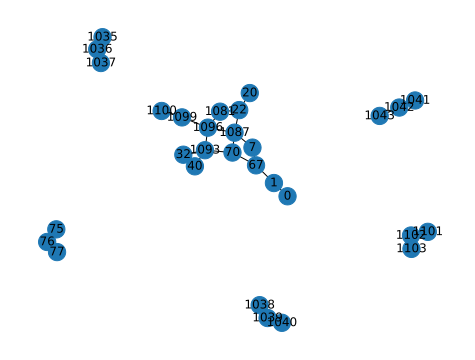

fusion  (1100, 40)  success
fusion failure  1100 40
rebuilding vertex 1100
connected components for neighbor 1099 : {32, 1, 0, 67, 1093, 70, 7, 1096, 1099, 20, 22, 1081, 1087}
set initial ghz as  (1100, 1099, 1107) fusing the last with neighbor 1099
rebuilding vertex 40
connected components for neighbor 1093 : {32, 1, 0, 67, 1093, 70, 7, 1096, 1099, 20, 22, 1081, 1087}
set initial ghz as  (40, 1093, 1110) fusing the last with neighbor 1093
vertex map: {1100: 1106, 1099: 1105, 40: 1109, 1093: 1108}
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1093, 1096, 1099, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085

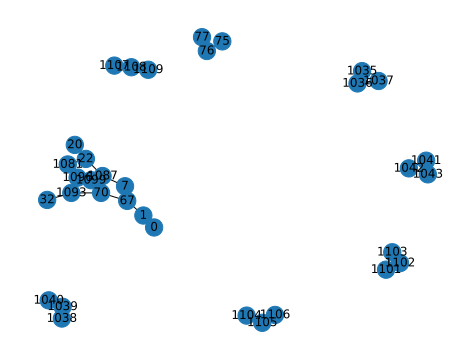

fusion  (1099, 1104)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1093, 1096, 1101, 1102, 1103, 1105, 1106, 1107, 1108, 1109] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1099, 1104), (1093, 1107), (1106, 1109), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


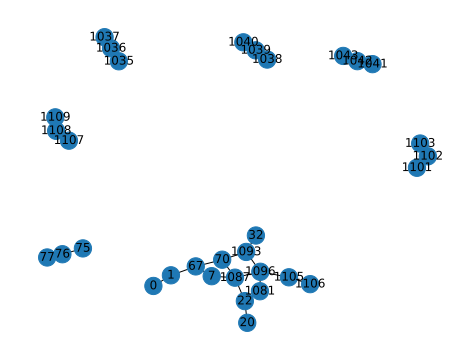

fusion  (1093, 1107)  success
fusion failure  1093 1107
rebuilding vertex 1093
connected components for neighbor 32 : {32}
connected components for neighbor 70 : {0, 1, 67, 70, 7, 1096, 1105, 1106, 20, 22, 1081, 1087}
set initial ghz as  (1093, 70, 1113) fusing the last with neighbor 70
add singular vertex 32
add subgraph of neighbor 1096
rebuilding vertex 1107
connected components for neighbor 1108 : {1108, 1109}
set initial ghz as  (1107, 1108, 1109)
vertex map: {1093: 1117, 70: 1111, 32: 1115, 1096: 1120, 1107: 1124, 1108: 1123, 1109: 1122}
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (4

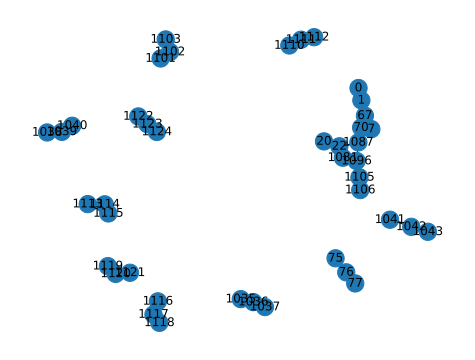

fusion  (70, 1110)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (70, 1110), (1112, 1113), (1114, 1116), (1118, 1119), (1121, 1096), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


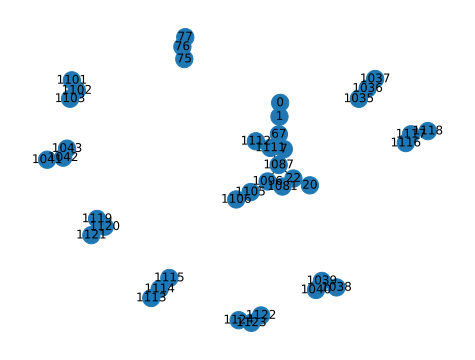

fusion  (1112, 1113)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1111, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (70, 1110), (1112, 1113), (1114, 1116), (1118, 1119), (1121, 1096), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1087), (1036, 1043), (1081, 75), (1041, 77)]


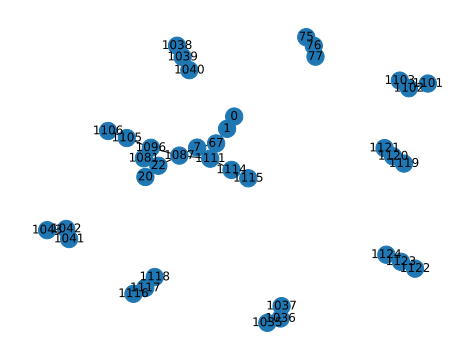

fusion  (1114, 1116)  success
fusion failure  1114 1116
rebuilding vertex 1114
connected components for neighbor 1115 : {1115}
connected components for neighbor 1111 : {0, 1, 67, 7, 1096, 1105, 1106, 20, 22, 1111, 1081, 1087}
set initial ghz as  (1114, 1111, 1128) fusing the last with neighbor 1111
add singular vertex 1115
rebuilding vertex 1116
connected components for neighbor 1117 : {1117, 1118}
set initial ghz as  (1116, 1117, 1118)
vertex map: {1114: 1129, 1111: 1126, 1115: 1130, 1116: 1133, 1117: 1132, 1118: 1131}
fusion failure  1112 1113
rebuilding vertex 1112
connected components for neighbor 1111 : {0, 1, 67, 7, 1096, 1105, 1106, 20, 22, 1111, 1081, 1087}
set initial ghz as  (1112, 1111, 1137) fusing the last with neighbor 1111
rebuilding vertex 1113
connected components for neighbor 1114 : {1114, 1115}
set initial ghz as  (1113, 1114, 1115)
vertex map: {1112: 1136, 1111: 1135, 1113: 1139, 1114: 1138, 1115: 1137}
fusion failure  70 1110
rebuilding vertex 70
connected componen

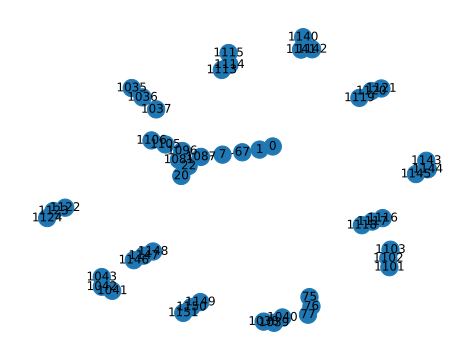

fusion  (67, 1140)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1142, 1143, 1144, 1145, 1146, 1147, 1148, 1149, 1150, 1151] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1145, 1146), (1148, 1087), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1096), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1147), (1036, 1043), (1081, 75), (1041, 77)]


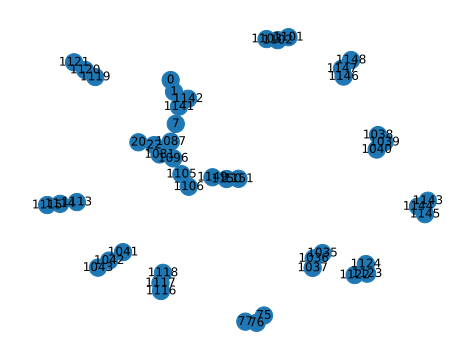

fusion  (1142, 1143)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1145, 1146, 1147, 1148, 1149, 1150, 1151] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1145, 1146), (1148, 1087), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1096), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1147), (1036, 1043), (1081, 75), (1041, 77)]


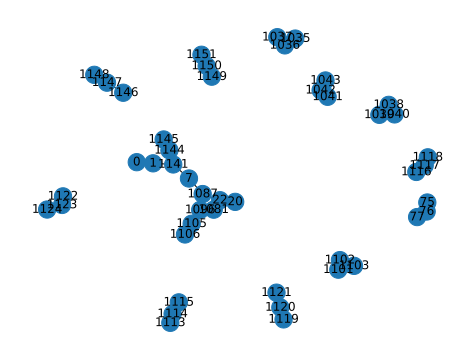

fusion  (1145, 1146)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1147, 1148, 1149, 1150, 1151] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1145, 1146), (1148, 1087), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1096), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1147), (1036, 1043), (1081, 75), (1041, 77)]


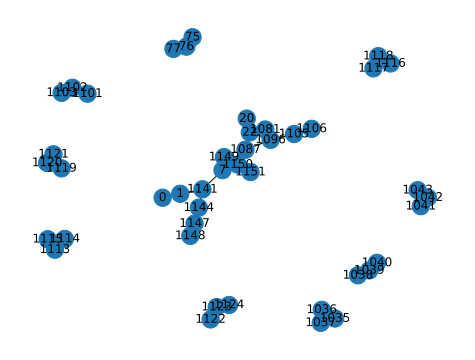

fusion  (1148, 1087)  success
fusion failure  1148 1087
rebuilding vertex 1148
connected components for neighbor 1147 : {0, 1, 7, 1141, 1144, 1147}
set initial ghz as  (1148, 1147, 1155) fusing the last with neighbor 1147
rebuilding vertex 1087
connected components for neighbor 22 : {1096, 1105, 1106, 20, 22, 1081}
set initial ghz as  (1087, 22, 1158) fusing the last with neighbor 22
add subgraph of neighbor 7
add subgraph of neighbor 1096
vertex map: {1148: 1154, 1147: 1153, 1087: 1165, 22: 1156, 7: 1162, 1096: 1168}
in dfs for graph with nodes [0, 1, 7, 20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1147, 1149, 1150, 1151, 1152, 1153, 1154, 1155, 1156, 1157, 1158, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1167, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 2

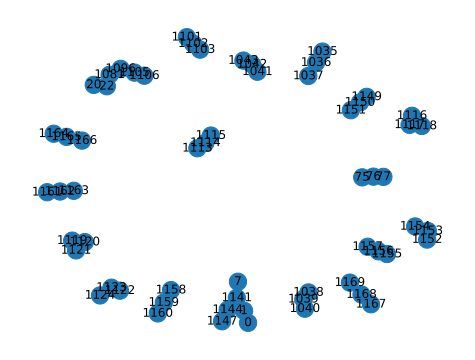

fusion  (1147, 1152)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1155, 1156, 1157, 1158, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1167, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (11

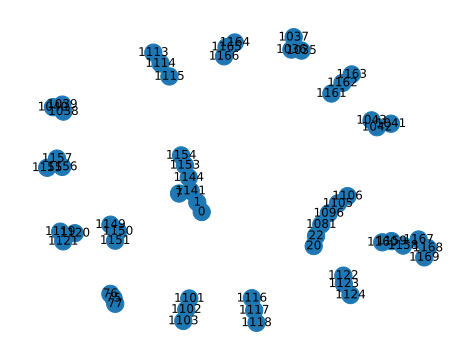

fusion  (22, 1155)  success
in dfs for graph with nodes [0, 1, 7, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1157, 1158, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1167, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (

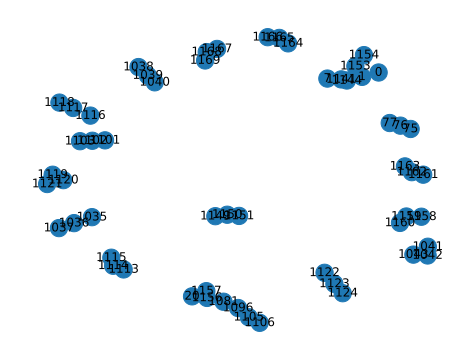

fusion  (1157, 1158)  success
in dfs for graph with nodes [0, 1, 7, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1159, 1160, 1161, 1162, 1163, 1164, 1165, 1166, 1167, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038

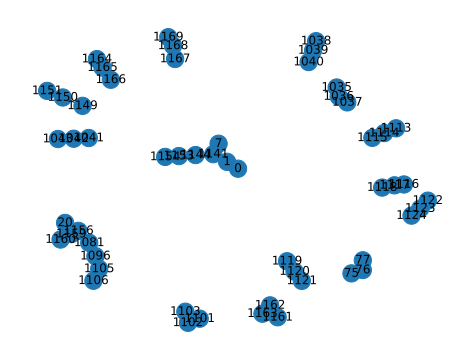

fusion  (1160, 1161)  success
in dfs for graph with nodes [0, 1, 7, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1159, 1162, 1163, 1164, 1165, 1166, 1167, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 11

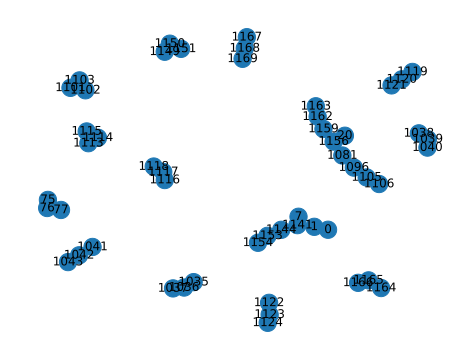

fusion  (1163, 7)  success
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1159, 1162, 1164, 1165, 1166, 1167, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1153), (1036, 

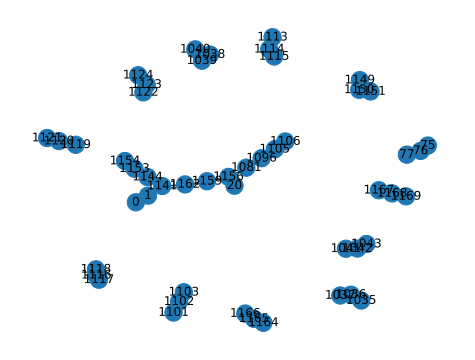

fusion  (1159, 1164)  success
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1162, 1165, 1166, 1167, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1153), (1036, 1043), (1

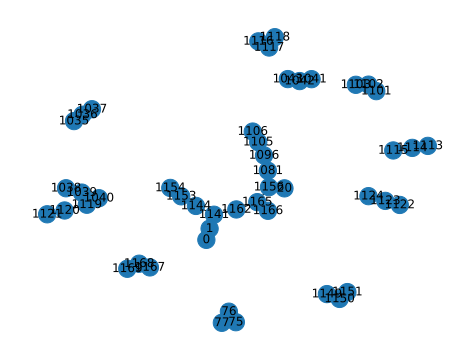

fusion  (1166, 1167)  success
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1162, 1165, 1168, 1169] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1153), (1036, 1043), (1081, 75), (1

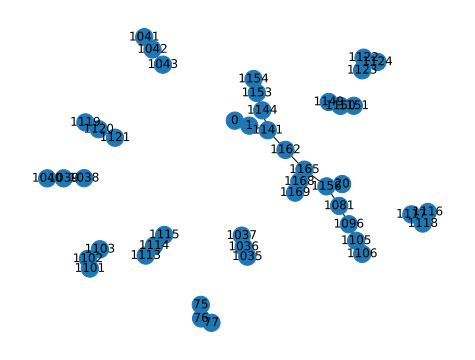

fusion  (1169, 1096)  success
fusion failure  1169 1096
rebuilding vertex 1169
connected components for neighbor 1168 : {0, 1, 1153, 1154, 1156, 1162, 1165, 1168, 20, 1141, 1144, 1081}
set initial ghz as  (1169, 1168, 1173) fusing the last with neighbor 1168
rebuilding vertex 1096
connected components for neighbor 1081 : {0, 1, 1153, 1154, 1156, 1162, 1165, 1168, 20, 1141, 1144, 1081}
set initial ghz as  (1096, 1081, 1176) fusing the last with neighbor 1081
vertex map: {1169: 1172, 1168: 1171, 1096: 1177, 1081: 1174, 1105: 1180, 1106: 1181}
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1101, 1102, 1103, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1162, 1165, 1168, 1170, 1171, 1172, 1173, 1174, 1175, 1176, 1177, 1178, 1179, 1180, 1181] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68,

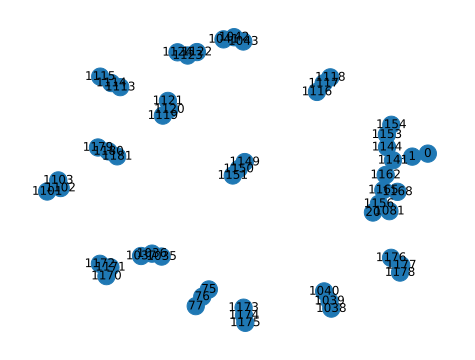

fusion  (1168, 1170)  success
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1101, 1102, 1103, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1162, 1165, 1171, 1172, 1173, 1174, 1175, 1176, 1177, 1178, 1179, 1180, 1181] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1168, 1170), (1081, 1173), (1175, 1176), (1178, 1179), (1172, 1177), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1171), (1117, 1124), (1181, 1122), (1120,

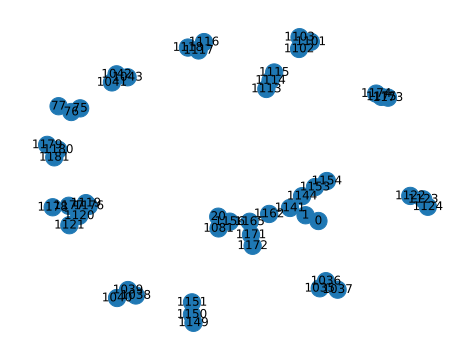

fusion  (1081, 1173)  success
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1101, 1102, 1103, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1162, 1165, 1171, 1172, 1174, 1175, 1176, 1177, 1178, 1179, 1180, 1181] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1168, 1170), (1081, 1173), (1175, 1176), (1178, 1179), (1172, 1177), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1171), (1117, 1124), (1181, 1122), (1120, 1103), (110

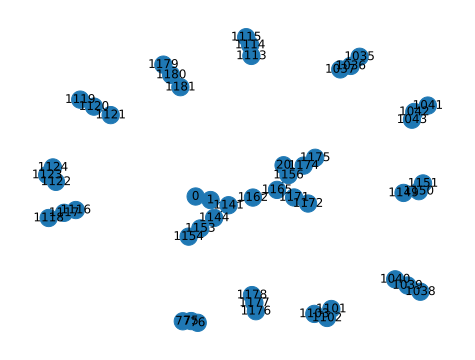

fusion  (1175, 1176)  success
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1101, 1102, 1103, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1162, 1165, 1171, 1172, 1174, 1177, 1178, 1179, 1180, 1181] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1160, 1161), (1163, 7), (1159, 1164), (1168, 1170), (1081, 1173), (1175, 1176), (1178, 1179), (1172, 1177), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1171), (1117, 1124), (1181, 1122), (1120, 1103), (1101, 1035), (1

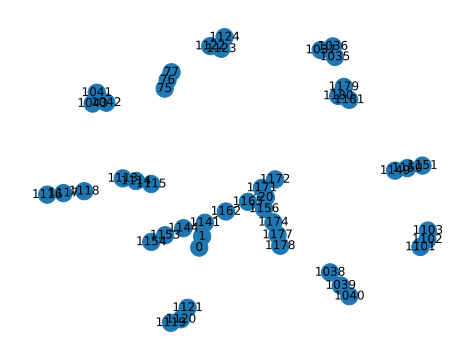

fusion  (1178, 1179)  success
fusion failure  1178 1179
rebuilding vertex 1178
connected components for neighbor 1177 : {0, 1, 1153, 1154, 1156, 1162, 1165, 1171, 20, 1141, 1174, 1172, 1144, 1177}
set initial ghz as  (1178, 1177, 1185) fusing the last with neighbor 1177
rebuilding vertex 1179
connected components for neighbor 1180 : {1180, 1181}
set initial ghz as  (1179, 1180, 1181)
vertex map: {1178: 1184, 1177: 1183, 1179: 1187, 1180: 1186, 1181: 1185}
fusion failure  1175 1176
rebuilding vertex 1175
connected components for neighbor 1174 : {0, 1, 1153, 1154, 1156, 1162, 1165, 1171, 20, 1141, 1174, 1172, 1144}
set initial ghz as  (1175, 1174, 1191) fusing the last with neighbor 1174
rebuilding vertex 1176
connected components for neighbor 1177 : {1177, 1178}
set initial ghz as  (1176, 1177, 1178)
vertex map: {1175: 1190, 1174: 1189, 1176: 1193, 1177: 1192, 1178: 1191}
fusion failure  1081 1173
rebuilding vertex 1081
connected components for neighbor 1156 : {0, 1, 1153, 1154, 1156, 1

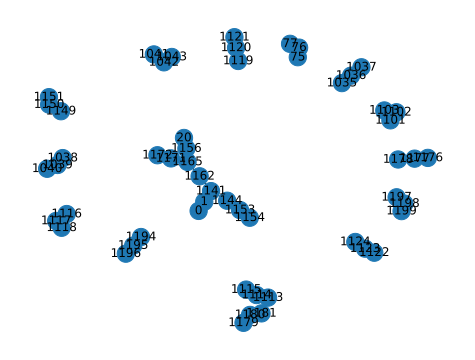

fusion  (1156, 1194)  success
fusion failure  1156 1194
rebuilding vertex 1156
connected components for neighbor 20 : {20}
connected components for neighbor 1165 : {0, 1, 1153, 1154, 1162, 1165, 1171, 1172, 1141, 1144}
set initial ghz as  (1156, 1165, 1203) fusing the last with neighbor 1165
add singular vertex 20
rebuilding vertex 1194
connected components for neighbor 1195 : {1195, 1196}
set initial ghz as  (1194, 1195, 1196)
vertex map: {1156: 1204, 1165: 1201, 20: 1205, 1194: 1208, 1195: 1207, 1196: 1206}
fusion failure  1168 1170
rebuilding vertex 1168
connected components for neighbor 1165 : {0, 1, 1153, 1154, 1156, 1162, 1165, 20, 1141, 1144, 1081}
set initial ghz as  (1168, 1165, 1212) fusing the last with neighbor 1165
rebuilding vertex 1170
connected components for neighbor 1171 : {1171, 1172}
set initial ghz as  (1170, 1171, 1172)
vertex map: {1168: 1211, 1165: 1210, 1170: 1214, 1171: 1213, 1172: 1212}
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038

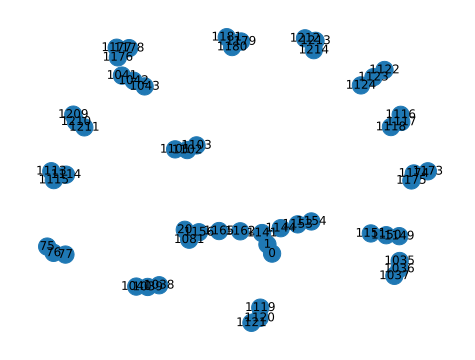

fusion  (1165, 1209)  success
fusion failure  1165 1209
rebuilding vertex 1165
connected components for neighbor 1156 : {1081, 1156, 20}
set initial ghz as  (1165, 1156, 1218) fusing the last with neighbor 1156
add subgraph of neighbor 1162
rebuilding vertex 1209
connected components for neighbor 1210 : {1210, 1211}
set initial ghz as  (1209, 1210, 1211)
vertex map: {1165: 1219, 1156: 1216, 1162: 1222, 1209: 1226, 1210: 1225, 1211: 1224}
fusion failure  1166 1167
rebuilding vertex 1166
connected components for neighbor 1165 : {0, 1, 1153, 1154, 1156, 1096, 1162, 1165, 1105, 1106, 20, 1141, 1144, 1081}
set initial ghz as  (1166, 1165, 1230) fusing the last with neighbor 1165
rebuilding vertex 1167
connected components for neighbor 1168 : {1168, 1169}
set initial ghz as  (1167, 1168, 1169)
vertex map: {1166: 1229, 1165: 1228, 1167: 1232, 1168: 1231, 1169: 1230}
fusion failure  1159 1164
rebuilding vertex 1159
connected components for neighbor 1156 : {1156, 1096, 1105, 1106, 20, 1081}
set

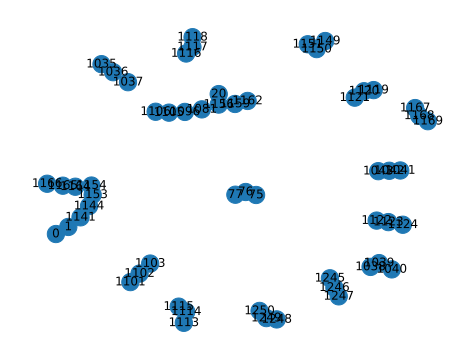

fusion  (1162, 1245)  success
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1159, 1164, 1165, 1166, 1167, 1168, 1169, 1246, 1247, 1248, 1249, 1250] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1162, 1245), (1141, 1248), (1247, 1250), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (1117, 1124), (1106, 1122), (1120, 1103), (1101

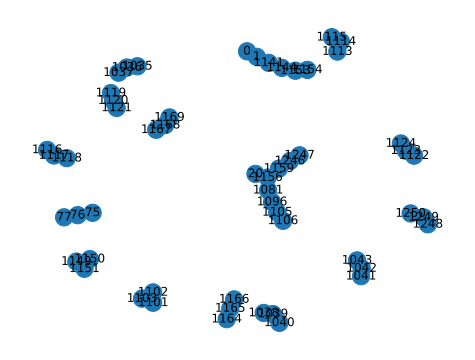

fusion  (1141, 1248)  success
fusion failure  1141 1248
rebuilding vertex 1141
connected components for neighbor 1 : {0, 1}
set initial ghz as  (1141, 1, 0)
add subgraph of neighbor 1144
rebuilding vertex 1248
connected components for neighbor 1249 : {1249, 1250}
set initial ghz as  (1248, 1249, 1250)
vertex map: {1141: 1255, 1: 1252, 0: 1251, 1144: 1258, 1248: 1262, 1249: 1261, 1250: 1260}
in dfs for graph with nodes [20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1159, 1164, 1165, 1166, 1167, 1168, 1169, 1246, 1247, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 

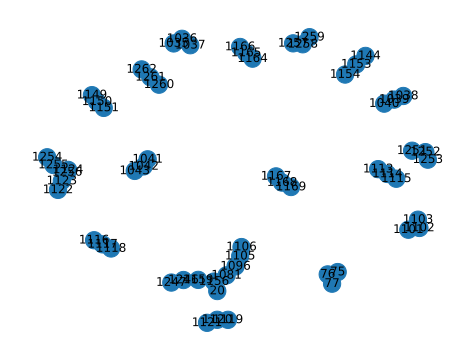

fusion  (1253, 1254)  success
in dfs for graph with nodes [20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1159, 1164, 1165, 1166, 1167, 1168, 1169, 1246, 1247, 1251, 1252, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1253, 1254), (1256, 1257), (1259, 1144), (1255, 1262), (1247, 1260), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1258, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (11

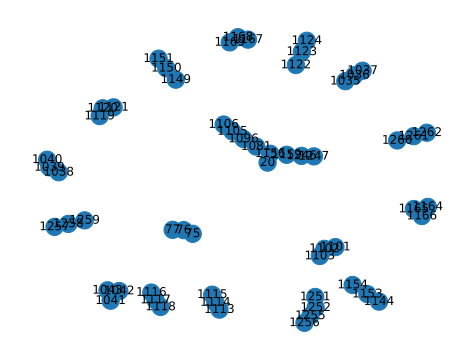

fusion  (1256, 1257)  success
in dfs for graph with nodes [20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1159, 1164, 1165, 1166, 1167, 1168, 1169, 1246, 1247, 1251, 1252, 1255, 1258, 1259, 1260, 1261, 1262] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1094, 58), (67, 1140), (1142, 1143), (1147, 1152), (22, 1155), (1157, 1158), (1253, 1254), (1256, 1257), (1259, 1144), (1255, 1262), (1247, 1260), (1159, 1164), (1166, 1167), (1169, 1096), (1154, 1165), (1258, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1168), (

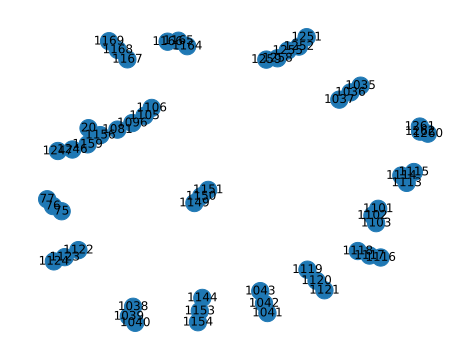

fusion  (1259, 1144)  success
fusion failure  1259 1144
rebuilding vertex 1259
connected components for neighbor 1258 : {1258, 1251, 1252, 1255}
set initial ghz as  (1259, 1258, 1266) fusing the last with neighbor 1258
rebuilding vertex 1144
connected components for neighbor 1153 : {1153, 1154}
set initial ghz as  (1144, 1153, 1154)
vertex map: {1259: 1265, 1258: 1264, 1144: 1268, 1153: 1267, 1154: 1266}
fusion failure  1256 1257
rebuilding vertex 1256
connected components for neighbor 1255 : {1251, 1252, 1255}
set initial ghz as  (1256, 1255, 1272) fusing the last with neighbor 1255
rebuilding vertex 1257
connected components for neighbor 1258 : {1258, 1259}
set initial ghz as  (1257, 1258, 1259)
vertex map: {1256: 1271, 1255: 1270, 1257: 1274, 1258: 1273, 1259: 1272}
fusion failure  1253 1254
rebuilding vertex 1253
connected components for neighbor 1252 : {1251, 1252}
set initial ghz as  (1253, 1252, 1251)
rebuilding vertex 1254
connected components for neighbor 1255 : {1256, 1255}
s

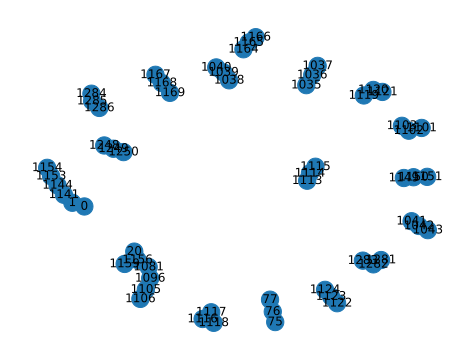

fusion  (1159, 1281)  success
fusion failure  1159 1281
rebuilding vertex 1159
connected components for neighbor 1156 : {1156, 1096, 1105, 1106, 20, 1081}
set initial ghz as  (1159, 1156, 1290) fusing the last with neighbor 1156
rebuilding vertex 1281
connected components for neighbor 1282 : {1282, 1283}
set initial ghz as  (1281, 1282, 1283)
vertex map: {1159: 1289, 1156: 1288, 1281: 1292, 1282: 1291, 1283: 1290}
in dfs for graph with nodes [0, 1, 20, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1156, 1164, 1165, 1166, 1167, 1168, 1169, 1248, 1249, 1250, 1284, 1285, 1286, 1287, 1288, 1289, 1290, 1291, 1292] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71

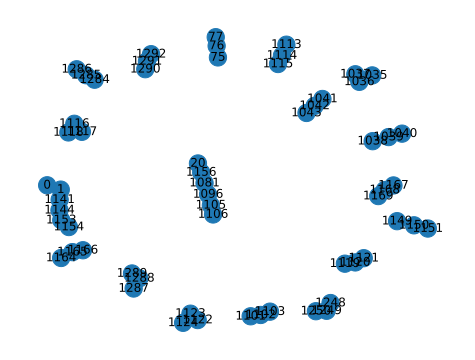

fusion  (1156, 1287)  success
fusion failure  1156 1287
rebuilding vertex 1156
connected components for neighbor 20 : {20}
connected components for neighbor 1081 : {1096, 1081, 1105, 1106}
set initial ghz as  (1156, 1081, 1296) fusing the last with neighbor 1081
add singular vertex 20
rebuilding vertex 1287
connected components for neighbor 1288 : {1288, 1289}
set initial ghz as  (1287, 1288, 1289)
vertex map: {1156: 1297, 1081: 1294, 20: 1298, 1287: 1301, 1288: 1300, 1289: 1299}
in dfs for graph with nodes [0, 1, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1141, 1144, 1149, 1150, 1151, 1153, 1154, 1164, 1165, 1166, 1167, 1168, 1169, 1248, 1249, 1250, 1284, 1285, 1286, 1290, 1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68,

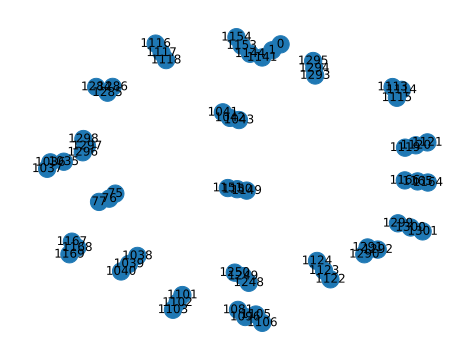

fusion  (1081, 1293)  success
fusion failure  1081 1293
rebuilding vertex 1081
connected components for neighbor 1096 : {1096, 1105, 1106}
set initial ghz as  (1081, 1096, 1305) fusing the last with neighbor 1096
rebuilding vertex 1293
connected components for neighbor 1294 : {1294, 1295}
set initial ghz as  (1293, 1294, 1295)
vertex map: {1081: 1304, 1096: 1303, 1293: 1307, 1294: 1306, 1295: 1305}
fusion failure  1160 1161
rebuilding vertex 1160
connected components for neighbor 1159 : {1156, 1159, 1096, 1105, 1106, 20, 1081}
set initial ghz as  (1160, 1159, 1311) fusing the last with neighbor 1159
rebuilding vertex 1161
connected components for neighbor 1162 : {1162, 1163}
set initial ghz as  (1161, 1162, 1163)
vertex map: {1160: 1310, 1159: 1309, 1161: 1313, 1162: 1312, 1163: 1311}
fusion failure  1157 1158
rebuilding vertex 1157
connected components for neighbor 1156 : {1156, 1096, 1105, 1106, 20, 1081}
set initial ghz as  (1157, 1156, 1317) fusing the last with neighbor 1156
rebui

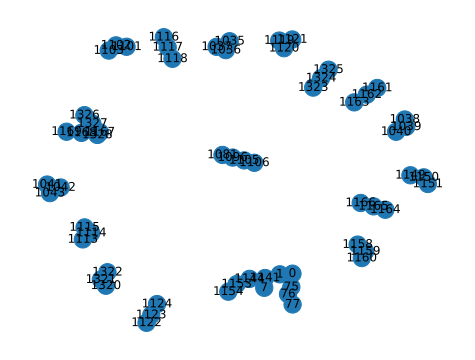

fusion  (1081, 1320)  success
fusion failure  1081 1320
rebuilding vertex 1081
connected components for neighbor 1096 : {1096, 1105, 1106}
set initial ghz as  (1081, 1096, 1332) fusing the last with neighbor 1096
rebuilding vertex 1320
connected components for neighbor 1321 : {1321, 1322}
set initial ghz as  (1320, 1321, 1322)
vertex map: {1081: 1331, 1096: 1330, 1320: 1334, 1321: 1333, 1322: 1332}
fusion failure  1147 1152
rebuilding vertex 1147
connected components for neighbor 1144 : {0, 1, 7, 1141, 1144}
set initial ghz as  (1147, 1144, 1338) fusing the last with neighbor 1144
rebuilding vertex 1152
connected components for neighbor 1153 : {1153, 1154}
set initial ghz as  (1152, 1153, 1154)
vertex map: {1147: 1337, 1144: 1336, 1152: 1340, 1153: 1339, 1154: 1338}
in dfs for graph with nodes [0, 1, 7, 20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 112

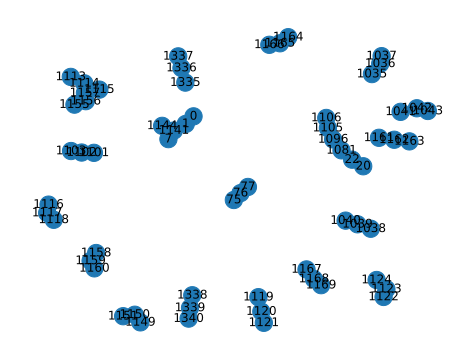

fusion  (1144, 1335)  success
fusion failure  1144 1335
rebuilding vertex 1144
connected components for neighbor 1141 : {0, 1, 1141, 7}
set initial ghz as  (1144, 1141, 1344) fusing the last with neighbor 1141
rebuilding vertex 1335
connected components for neighbor 1336 : {1336, 1337}
set initial ghz as  (1335, 1336, 1337)
vertex map: {1144: 1343, 1141: 1342, 1335: 1346, 1336: 1345, 1337: 1344}
fusion failure  1145 1146
rebuilding vertex 1145
connected components for neighbor 1144 : {0, 1, 7, 1096, 1105, 1106, 20, 1141, 22, 1144, 1081, 1087}
set initial ghz as  (1145, 1144, 1350) fusing the last with neighbor 1144
rebuilding vertex 1146
connected components for neighbor 1147 : {1147, 1148}
set initial ghz as  (1146, 1147, 1148)
vertex map: {1145: 1349, 1144: 1348, 1146: 1352, 1147: 1351, 1148: 1350}
fusion failure  1142 1143
rebuilding vertex 1142
connected components for neighbor 1141 : {0, 1, 7, 1096, 1105, 1106, 20, 1141, 22, 1081, 1087}
set initial ghz as  (1142, 1141, 1356) fusin

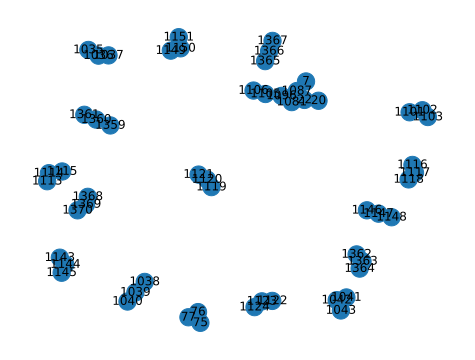

fusion  (7, 1359)  success
in dfs for graph with nodes [20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1143, 1144, 1145, 1146, 1147, 1148, 1149, 1150, 1151, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (7, 1359), (1361, 1362), (1364, 1365), (1363, 1370), (1368, 1143), (1145, 1146), (1148, 1087), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1096), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1147), (1036, 1043), (1081, 75), (1041, 77)]


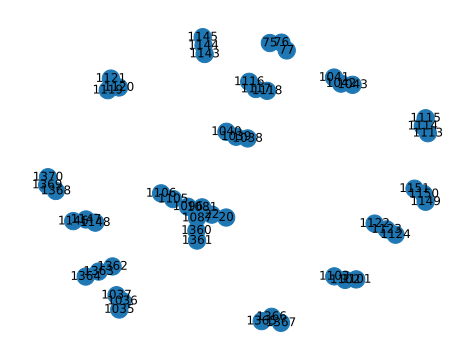

fusion  (1361, 1362)  success
in dfs for graph with nodes [20, 22, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1096, 1101, 1102, 1103, 1105, 1106, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1143, 1144, 1145, 1146, 1147, 1148, 1149, 1150, 1151, 1360, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (7, 1359), (1361, 1362), (1364, 1365), (1363, 1370), (1368, 1143), (1145, 1146), (1148, 1087), (1144, 1151), (1149, 1113), (1114, 1116), (1118, 1119), (1121, 1096), (1117, 1124), (1106, 1122), (1120, 1103), (1101, 1035), (1037, 1038), (1040, 1147), (1036, 1043), (1081, 75), (1041, 77)]


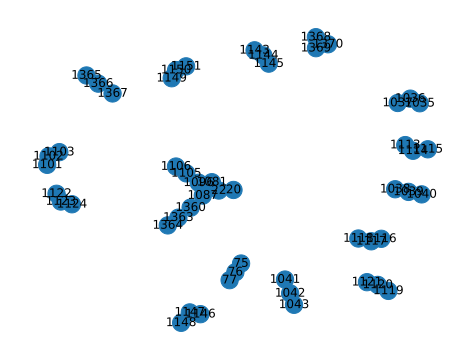

fusion  (1364, 1365)  success
fusion failure  1364 1365
rebuilding vertex 1364
connected components for neighbor 1363 : {1096, 1360, 1105, 1106, 1363, 20, 22, 1081, 1087}
set initial ghz as  (1364, 1363, 1374) fusing the last with neighbor 1363
rebuilding vertex 1365
connected components for neighbor 1366 : {1366, 1367}
set initial ghz as  (1365, 1366, 1367)
vertex map: {1364: 1373, 1363: 1372, 1365: 1376, 1366: 1375, 1367: 1374}
fusion failure  1361 1362
rebuilding vertex 1361
connected components for neighbor 1360 : {1096, 1360, 1105, 1106, 20, 22, 1081, 1087}
set initial ghz as  (1361, 1360, 1380) fusing the last with neighbor 1360
rebuilding vertex 1362
connected components for neighbor 1363 : {1363, 1364}
set initial ghz as  (1362, 1363, 1364)
vertex map: {1361: 1379, 1360: 1378, 1362: 1382, 1363: 1381, 1364: 1380}
fusion failure  7 1359
rebuilding vertex 7
connected components for neighbor 1087 : {1096, 1105, 1106, 20, 22, 1081, 1087}
set initial ghz as  (7, 1087, 1386) fusing th

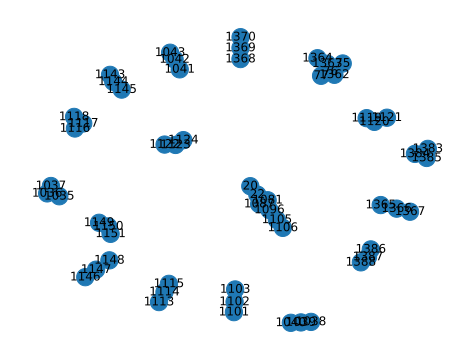

fusion  (1087, 1383)  success
fusion failure  1087 1383
rebuilding vertex 1087
connected components for neighbor 22 : {1096, 1105, 1106, 20, 22, 1081}
set initial ghz as  (1087, 22, 1392) fusing the last with neighbor 22
add subgraph of neighbor 1096
rebuilding vertex 1383
connected components for neighbor 1384 : {1384, 1385}
set initial ghz as  (1383, 1384, 1385)
vertex map: {1087: 1393, 22: 1390, 1096: 1396, 1383: 1400, 1384: 1399, 1385: 1398}
fusion failure  1099 1104
rebuilding vertex 1099
connected components for neighbor 1096 : {32, 1, 0, 67, 1093, 70, 7, 1096, 20, 22, 1081, 1087}
set initial ghz as  (1099, 1096, 1404) fusing the last with neighbor 1096
rebuilding vertex 1104
connected components for neighbor 1105 : {1105, 1106}
set initial ghz as  (1104, 1105, 1106)
vertex map: {1099: 1403, 1096: 1402, 1104: 1406, 1105: 1405, 1106: 1404}
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1093, 1

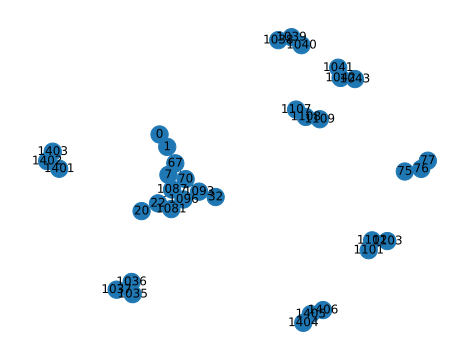

fusion  (1096, 1401)  success
fusion failure  1096 1401
rebuilding vertex 1096
connected components for neighbor 1081 : {32, 1, 0, 67, 1093, 70, 7, 20, 22, 1081, 1087}
set initial ghz as  (1096, 1081, 1410) fusing the last with neighbor 1081
add subgraph of neighbor 1087
add subgraph of neighbor 1093
rebuilding vertex 1401
connected components for neighbor 1402 : {1402, 1403}
set initial ghz as  (1401, 1402, 1403)
vertex map: {1096: 1417, 1081: 1408, 1087: 1414, 1093: 1420, 1401: 1424, 1402: 1423, 1403: 1422}
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1093, 1101, 1102, 1103, 1107, 1108, 1109, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (

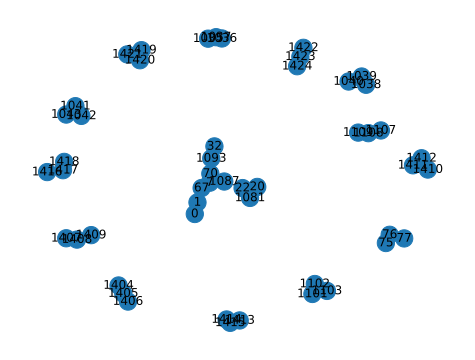

fusion  (1081, 1407)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1087, 1093, 1101, 1102, 1103, 1107, 1108, 1109, 1404, 1405, 1406, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1081, 1407), (1409, 1410), (1412, 1413), (1415, 1087), (1411, 1416), (1418, 1419), (1421, 1093), (1417, 1424), (1422, 1406), (1420, 1107), (1404, 1109), (1423, 1103), (1101, 1035), (1037, 1038), (1040, 1414), (1036, 1043), (1408, 75), (1041, 77)]


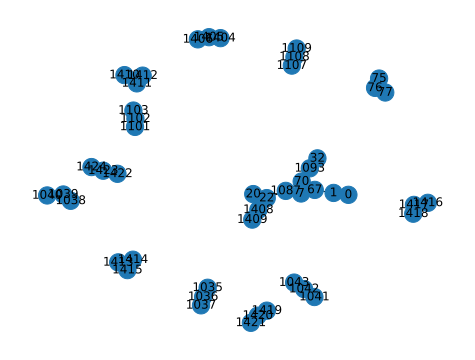

fusion  (1409, 1410)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1087, 1093, 1101, 1102, 1103, 1107, 1108, 1109, 1404, 1405, 1406, 1408, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1081, 1407), (1409, 1410), (1412, 1413), (1415, 1087), (1411, 1416), (1418, 1419), (1421, 1093), (1417, 1424), (1422, 1406), (1420, 1107), (1404, 1109), (1423, 1103), (1101, 1035), (1037, 1038), (1040, 1414), (1036, 1043), (1408, 75), (1041, 77)]


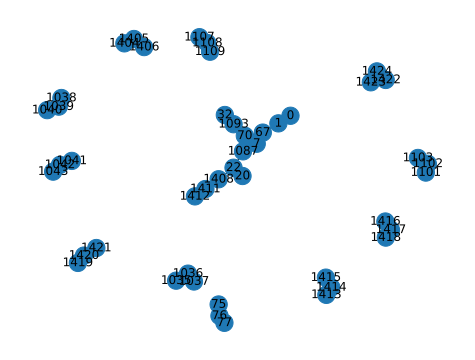

fusion  (1412, 1413)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1087, 1093, 1101, 1102, 1103, 1107, 1108, 1109, 1404, 1405, 1406, 1408, 1411, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1081, 1407), (1409, 1410), (1412, 1413), (1415, 1087), (1411, 1416), (1418, 1419), (1421, 1093), (1417, 1424), (1422, 1406), (1420, 1107), (1404, 1109), (1423, 1103), (1101, 1035), (1037, 1038), (1040, 1414), (1036, 1043), (1408, 75), (1041, 77)]


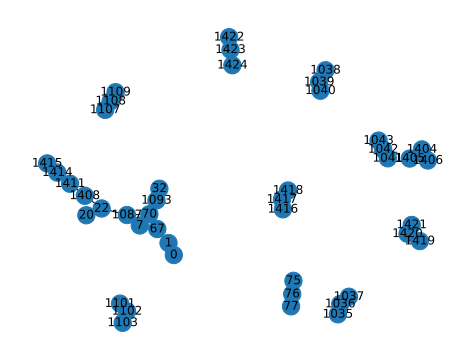

fusion  (1415, 1087)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1093, 1101, 1102, 1103, 1107, 1108, 1109, 1404, 1405, 1406, 1408, 1411, 1414, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1081, 1407), (1409, 1410), (1412, 1413), (1415, 1087), (1411, 1416), (1418, 1419), (1421, 1093), (1417, 1424), (1422, 1406), (1420, 1107), (1404, 1109), (1423, 1103), (1101, 1035), (1037, 1038), (1040, 1414), (1036, 1043), (1408, 75), (1041, 77)]


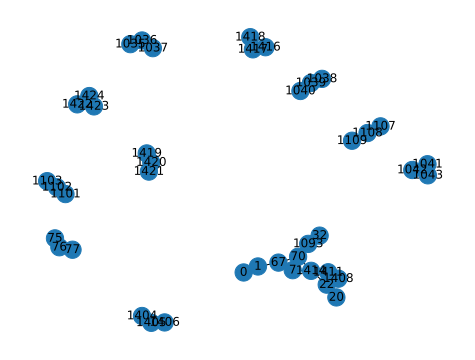

fusion  (1411, 1416)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1093, 1101, 1102, 1103, 1107, 1108, 1109, 1404, 1405, 1406, 1408, 1414, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1088, 25), (1084, 1089), (1091, 1092), (1081, 1407), (1409, 1410), (1412, 1413), (1415, 1087), (1411, 1416), (1418, 1419), (1421, 1093), (1417, 1424), (1422, 1406), (1420, 1107), (1404, 1109), (1423, 1103), (1101, 1035), (1037, 1038), (1040, 1414), (1036, 1043), (1408, 75), (1041, 77)]


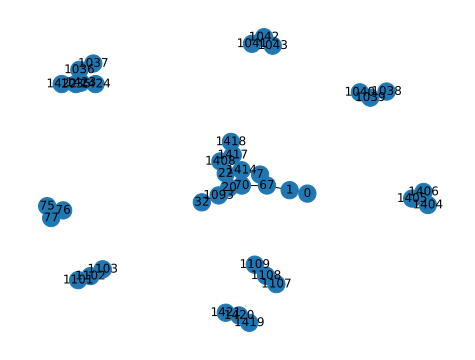

fusion  (1418, 1419)  success
fusion failure  1418 1419
rebuilding vertex 1418
connected components for neighbor 1417 : {1408, 1, 32, 67, 0, 1093, 70, 1414, 7, 1417, 20, 22}
set initial ghz as  (1418, 1417, 1428) fusing the last with neighbor 1417
rebuilding vertex 1419
connected components for neighbor 1420 : {1420, 1421}
set initial ghz as  (1419, 1420, 1421)
vertex map: {1418: 1427, 1417: 1426, 1419: 1430, 1420: 1429, 1421: 1428}
fusion failure  1411 1416
rebuilding vertex 1411
connected components for neighbor 1408 : {1408, 1, 32, 67, 0, 1093, 70, 1414, 7, 20, 22}
set initial ghz as  (1411, 1408, 1434) fusing the last with neighbor 1408
add subgraph of neighbor 1414
rebuilding vertex 1416
connected components for neighbor 1417 : {1417, 1418}
set initial ghz as  (1416, 1417, 1418)
vertex map: {1411: 1435, 1408: 1432, 1414: 1438, 1416: 1442, 1417: 1441, 1418: 1440}
fusion failure  1415 1087
rebuilding vertex 1415
connected components for neighbor 1414 : {1408, 1411, 1414, 20, 22}
set

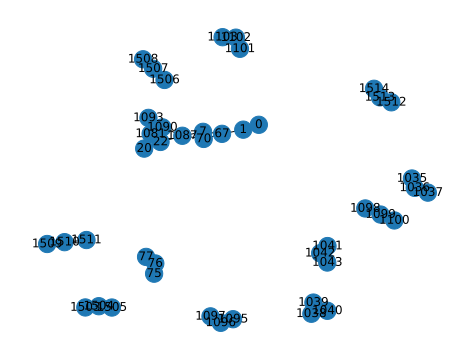

fusion  (1093, 1503)  success
fusion failure  1093 1503
rebuilding vertex 1093
connected components for neighbor 1090 : {0, 1, 1090, 67, 70, 7, 20, 22, 1081, 1087}
set initial ghz as  (1093, 1090, 1518) fusing the last with neighbor 1090
rebuilding vertex 1503
connected components for neighbor 1504 : {1504, 1505}
set initial ghz as  (1503, 1504, 1505)
vertex map: {1093: 1517, 1090: 1516, 1503: 1520, 1504: 1519, 1505: 1518}
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1090, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1513, 1514, 1515, 1516, 1517, 1518, 1519, 1520] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 

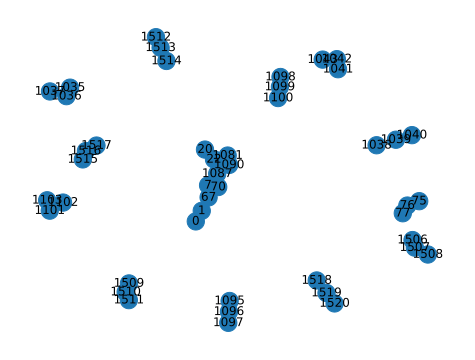

fusion  (1090, 1515)  success
fusion failure  1090 1515
rebuilding vertex 1090
connected components for neighbor 1081 : {0, 1, 67, 70, 7, 20, 22, 1081, 1087}
set initial ghz as  (1090, 1081, 1524) fusing the last with neighbor 1081
add subgraph of neighbor 1087
rebuilding vertex 1515
connected components for neighbor 1516 : {1516, 1517}
set initial ghz as  (1515, 1516, 1517)
vertex map: {1090: 1525, 1081: 1522, 1087: 1528, 1515: 1532, 1516: 1531, 1517: 1530}
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1087, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1513, 1514, 1518, 1519, 1520, 1521, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71

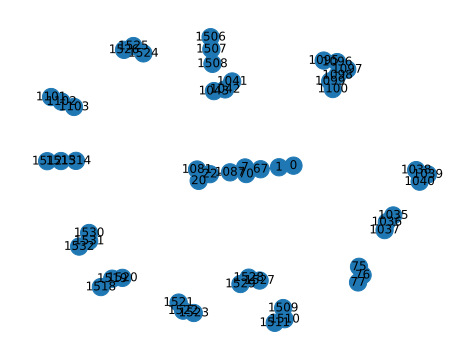

fusion  (1081, 1521)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1087, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1513, 1514, 1518, 1519, 1520, 1522, 1523, 1524, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1081, 1521), (1523, 1524), (1526, 1527), (1529, 1087), (1525, 1532), (1530, 1520), (70, 1506), (1508, 1509), (1510, 1512), (1518, 1513), (1531, 1095), (1097, 1098), (1100, 1514), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1528), (1036, 1043), (1522, 75), (1041, 77)]


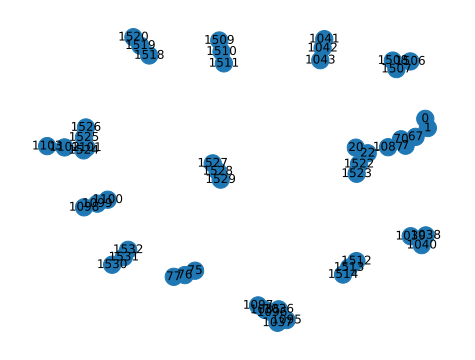

fusion  (1523, 1524)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1087, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1513, 1514, 1518, 1519, 1520, 1522, 1525, 1526, 1527, 1528, 1529, 1530, 1531, 1532] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1081, 1521), (1523, 1524), (1526, 1527), (1529, 1087), (1525, 1532), (1530, 1520), (70, 1506), (1508, 1509), (1510, 1512), (1518, 1513), (1531, 1095), (1097, 1098), (1100, 1514), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1528), (1036, 1043), (1522, 75), (1041, 77)]


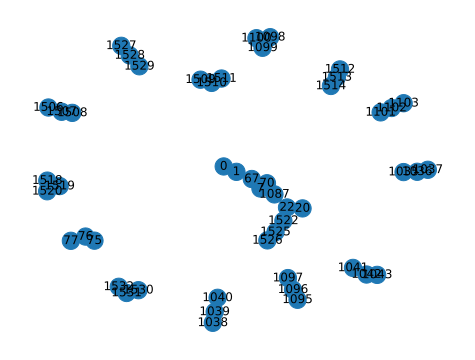

fusion  (1526, 1527)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1087, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1506, 1507, 1508, 1509, 1510, 1511, 1512, 1513, 1514, 1518, 1519, 1520, 1522, 1525, 1528, 1529, 1530, 1531, 1532] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1085, 1086), (1081, 1521), (1523, 1524), (1526, 1527), (1529, 1087), (1525, 1532), (1530, 1520), (70, 1506), (1508, 1509), (1510, 1512), (1518, 1513), (1531, 1095), (1097, 1098), (1100, 1514), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1528), (1036, 1043), (1522, 75), (1041, 77)]


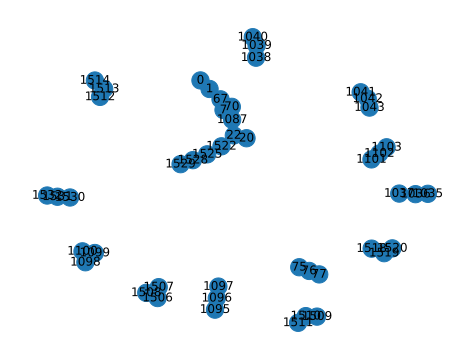

fusion  (1529, 1087)  success
fusion failure  1529 1087
rebuilding vertex 1529
connected components for neighbor 1528 : {1522, 20, 1525, 22, 1528}
set initial ghz as  (1529, 1528, 1536) fusing the last with neighbor 1528
rebuilding vertex 1087
connected components for neighbor 22 : {1522, 20, 1525, 22, 1528}
set initial ghz as  (1087, 22, 1539) fusing the last with neighbor 22
add subgraph of neighbor 70
add subgraph of neighbor 7
vertex map: {1529: 1535, 1528: 1534, 1087: 1546, 22: 1537, 70: 1543, 7: 1549}
fusion failure  1526 1527
rebuilding vertex 1526
connected components for neighbor 1525 : {0, 1, 67, 70, 7, 1522, 20, 1525, 22, 1087}
set initial ghz as  (1526, 1525, 1554) fusing the last with neighbor 1525
rebuilding vertex 1527
connected components for neighbor 1528 : {1528, 1529}
set initial ghz as  (1527, 1528, 1529)
vertex map: {1526: 1553, 1525: 1552, 1527: 1556, 1528: 1555, 1529: 1554}
fusion failure  1523 1524
rebuilding vertex 1523
connected components for neighbor 1522 : 

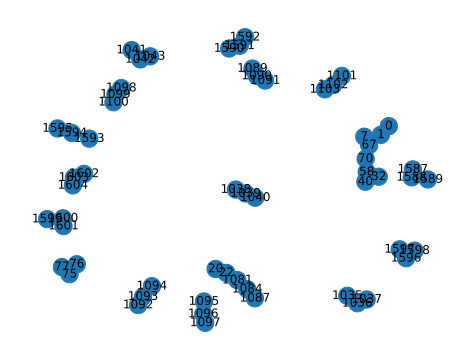

fusion  (1087, 1587)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1590, 1591, 1592, 1593, 1594, 1595, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1601, 1602), (1604, 7), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


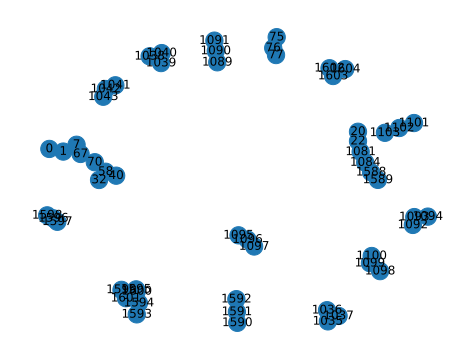

fusion  (22, 1590)  success
in dfs for graph with nodes [0, 1, 7, 20, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1592, 1593, 1594, 1595, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1601, 1602), (1604, 7), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


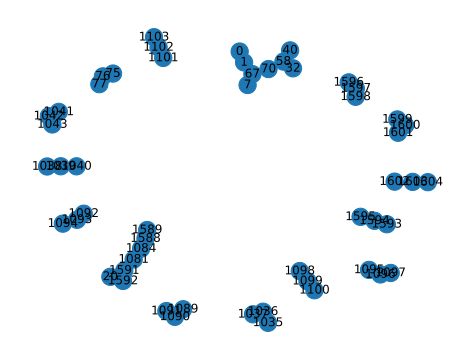

fusion  (1592, 1593)  success
in dfs for graph with nodes [0, 1, 7, 20, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1594, 1595, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1601, 1602), (1604, 7), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


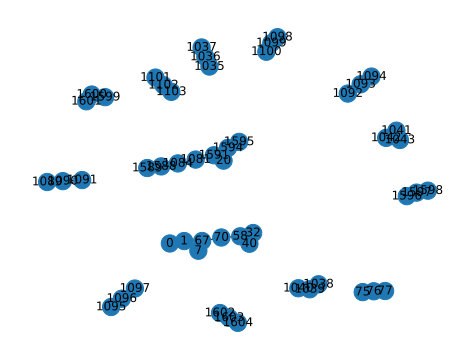

fusion  (1595, 1596)  success
in dfs for graph with nodes [0, 1, 7, 20, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1594, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1601, 1602), (1604, 7), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


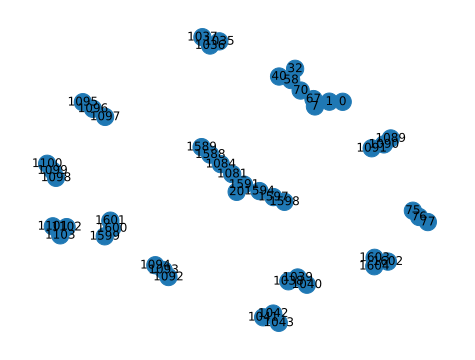

fusion  (1598, 70)  success
in dfs for graph with nodes [0, 1, 7, 20, 32, 40, 58, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1594, 1597, 1599, 1600, 1601, 1602, 1603, 1604] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1601, 1602), (1604, 7), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


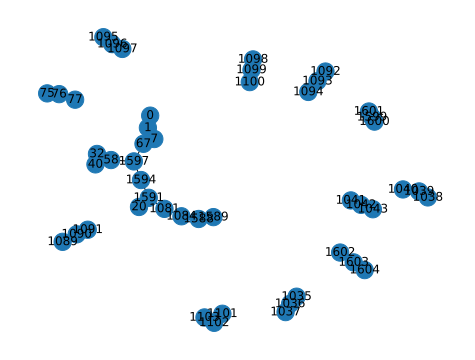

fusion  (1594, 1599)  success
in dfs for graph with nodes [0, 1, 7, 20, 32, 40, 58, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1597, 1600, 1601, 1602, 1603, 1604] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1601, 1602), (1604, 7), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


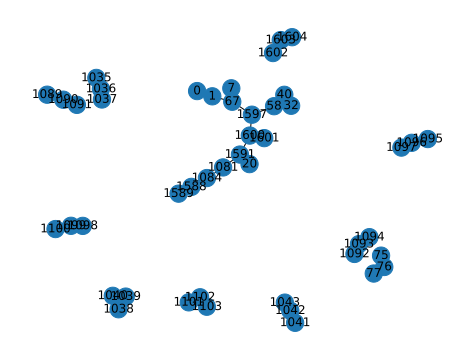

fusion  (1601, 1602)  success
in dfs for graph with nodes [0, 1, 7, 20, 32, 40, 58, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1597, 1600, 1603, 1604] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1601, 1602), (1604, 7), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


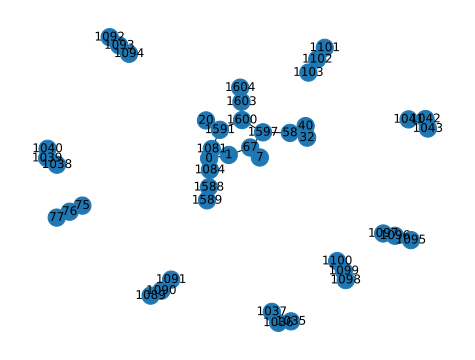

fusion  (1604, 7)  success
fusion failure  1604 7
rebuilding vertex 1604
connected components for neighbor 1603 : {1600, 1, 32, 1603, 67, 0, 40, 20, 1588, 1589, 1591, 1081, 58, 1084, 1597}
set initial ghz as  (1604, 1603, 1608) fusing the last with neighbor 1603
rebuilding vertex 7
connected components for neighbor 67 : {0, 1, 1600, 67, 32, 1603, 40, 20, 1588, 1589, 1591, 1081, 58, 1084, 1597}
set initial ghz as  (7, 67, 1611) fusing the last with neighbor 67
vertex map: {1604: 1607, 1603: 1606, 7: 1610, 67: 1609}
in dfs for graph with nodes [0, 1, 20, 32, 40, 58, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1597, 1600, 1603, 1605, 1606, 1607, 1608, 1609, 1610] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 

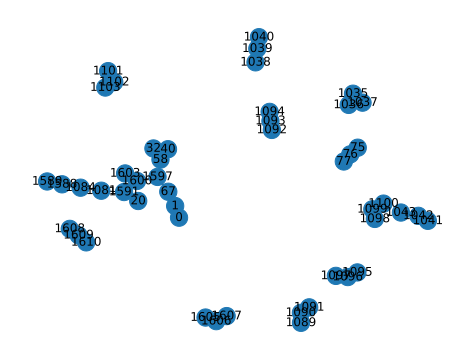

fusion  (1603, 1605)  success
in dfs for graph with nodes [0, 1, 20, 32, 40, 58, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1597, 1600, 1606, 1607, 1608, 1609, 1610] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1603, 1605), (67, 1608), (1607, 1610), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


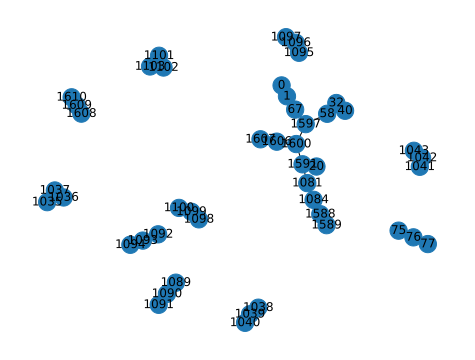

fusion  (67, 1608)  success
fusion failure  67 1608
rebuilding vertex 67
connected components for neighbor 1 : {0, 1}
set initial ghz as  (67, 1, 0)
add subgraph of neighbor 1597
rebuilding vertex 1608
connected components for neighbor 1609 : {1609, 1610}
set initial ghz as  (1608, 1609, 1610)
vertex map: {67: 1615, 1: 1612, 0: 1611, 1597: 1618, 1608: 1622, 1609: 1621, 1610: 1620}
in dfs for graph with nodes [20, 32, 40, 58, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1597, 1600, 1606, 1607, 1611, 1612, 1613, 1614, 1615, 1616, 1617, 1618, 1619, 1620, 1621, 1622] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087

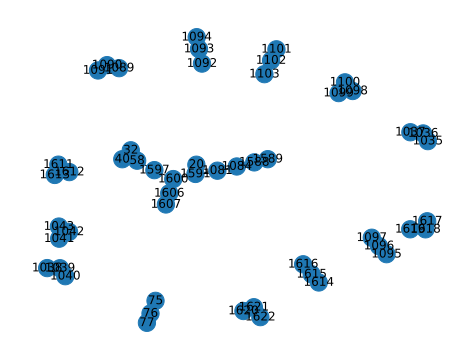

fusion  (1613, 1614)  success
in dfs for graph with nodes [20, 32, 40, 58, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1597, 1600, 1606, 1607, 1611, 1612, 1615, 1616, 1617, 1618, 1619, 1620, 1621, 1622] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1613, 1614), (1616, 1617), (1619, 1597), (1615, 1622), (1607, 1620), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


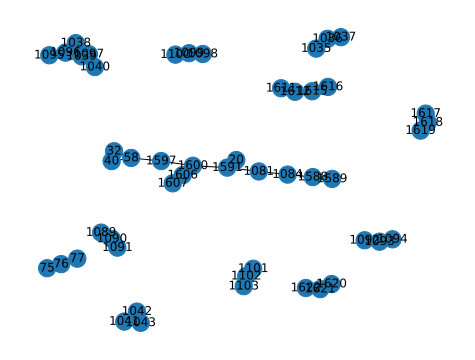

fusion  (1616, 1617)  success
in dfs for graph with nodes [20, 32, 40, 58, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1597, 1600, 1606, 1607, 1611, 1612, 1615, 1618, 1619, 1620, 1621, 1622] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (52, 1080), (1082, 1083), (1087, 1587), (22, 1590), (1592, 1593), (1595, 1596), (1598, 70), (1594, 1599), (1613, 1614), (1616, 1617), (1619, 1597), (1615, 1622), (1607, 1620), (1589, 1600), (1084, 1089), (1091, 1092), (1094, 58), (1090, 1095), (1097, 1098), (1100, 40), (1096, 1103), (1101, 1035), (1037, 1038), (1040, 1588), (1036, 1043), (1081, 75), (1041, 77)]


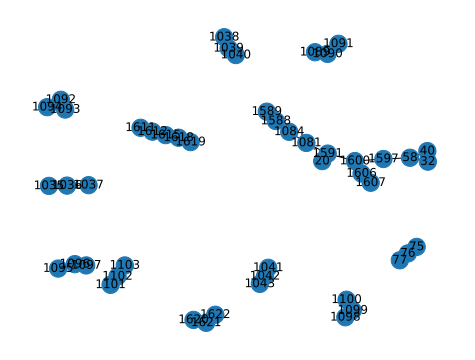

fusion  (1619, 1597)  success
fusion failure  1619 1597
rebuilding vertex 1619
connected components for neighbor 1618 : {1618, 1611, 1612, 1615}
set initial ghz as  (1619, 1618, 1626) fusing the last with neighbor 1618
rebuilding vertex 1597
connected components for neighbor 58 : {32, 58, 40}
set initial ghz as  (1597, 58, 1629) fusing the last with neighbor 58
add subgraph of neighbor 1600
vertex map: {1619: 1625, 1618: 1624, 1597: 1630, 58: 1627, 1600: 1633}
fusion failure  1616 1617
rebuilding vertex 1616
connected components for neighbor 1615 : {1611, 1612, 1615}
set initial ghz as  (1616, 1615, 1638) fusing the last with neighbor 1615
rebuilding vertex 1617
connected components for neighbor 1618 : {1618, 1619}
set initial ghz as  (1617, 1618, 1619)
vertex map: {1616: 1637, 1615: 1636, 1617: 1640, 1618: 1639, 1619: 1638}
fusion failure  1613 1614
rebuilding vertex 1613
connected components for neighbor 1612 : {1611, 1612}
set initial ghz as  (1613, 1612, 1611)
rebuilding vertex 161

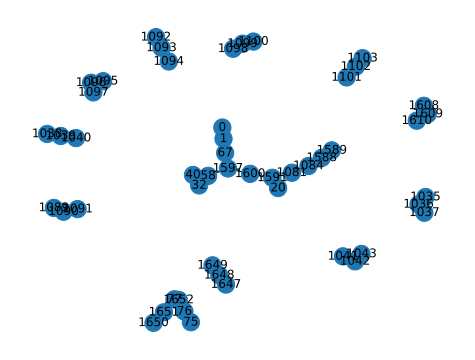

fusion  (1600, 1647)  success
fusion failure  1600 1647
rebuilding vertex 1600
connected components for neighbor 1591 : {1588, 20, 1589, 1591, 1081, 1084}
set initial ghz as  (1600, 1591, 1656) fusing the last with neighbor 1591
add subgraph of neighbor 1597
rebuilding vertex 1647
connected components for neighbor 1648 : {1648, 1649}
set initial ghz as  (1647, 1648, 1649)
vertex map: {1600: 1657, 1591: 1654, 1597: 1660, 1647: 1664, 1648: 1663, 1649: 1662}
fusion failure  1601 1602
rebuilding vertex 1601
connected components for neighbor 1600 : {1600, 1, 32, 67, 0, 7, 40, 20, 1588, 1589, 1591, 1081, 58, 1084, 1597}
set initial ghz as  (1601, 1600, 1668) fusing the last with neighbor 1600
rebuilding vertex 1602
connected components for neighbor 1603 : {1603, 1604}
set initial ghz as  (1602, 1603, 1604)
vertex map: {1601: 1667, 1600: 1666, 1602: 1670, 1603: 1669, 1604: 1668}
fusion failure  1594 1599
rebuilding vertex 1594
connected components for neighbor 1591 : {1588, 20, 1589, 1591, 10

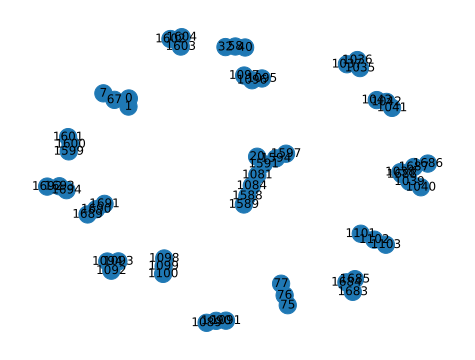

fusion  (1597, 1683)  success
fusion failure  1597 1683
rebuilding vertex 1597
connected components for neighbor 1594 : {20, 1588, 1589, 1591, 1081, 1594, 1084}
set initial ghz as  (1597, 1594, 1698) fusing the last with neighbor 1594
rebuilding vertex 1683
connected components for neighbor 1684 : {1684, 1685}
set initial ghz as  (1683, 1684, 1685)
vertex map: {1597: 1697, 1594: 1696, 1683: 1700, 1684: 1699, 1685: 1698}
in dfs for graph with nodes [0, 1, 7, 20, 32, 40, 58, 67, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1081, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1591, 1594, 1599, 1600, 1601, 1602, 1603, 1604, 1686, 1687, 1688, 1689, 1690, 1691, 1692, 1693, 1694, 1695, 1696, 1697, 1698, 1699, 1700] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), 

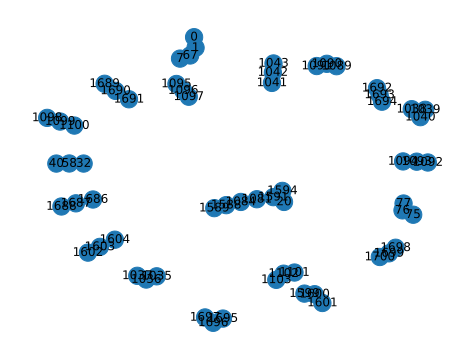

fusion  (1594, 1695)  success
fusion failure  1594 1695
rebuilding vertex 1594
connected components for neighbor 1591 : {1588, 20, 1589, 1591, 1081, 1084}
set initial ghz as  (1594, 1591, 1704) fusing the last with neighbor 1591
rebuilding vertex 1695
connected components for neighbor 1696 : {1696, 1697}
set initial ghz as  (1695, 1696, 1697)
vertex map: {1594: 1703, 1591: 1702, 1695: 1706, 1696: 1705, 1697: 1704}
fusion failure  1595 1596
rebuilding vertex 1595
connected components for neighbor 1594 : {20, 1588, 1589, 1591, 1081, 1594, 1084}
set initial ghz as  (1595, 1594, 1710) fusing the last with neighbor 1594
rebuilding vertex 1596
connected components for neighbor 1597 : {1597, 1598}
set initial ghz as  (1596, 1597, 1598)
vertex map: {1595: 1709, 1594: 1708, 1596: 1712, 1597: 1711, 1598: 1710}
fusion failure  1592 1593
rebuilding vertex 1592
connected components for neighbor 1591 : {1588, 20, 1589, 1591, 1081, 1084}
set initial ghz as  (1592, 1591, 1716) fusing the last with nei

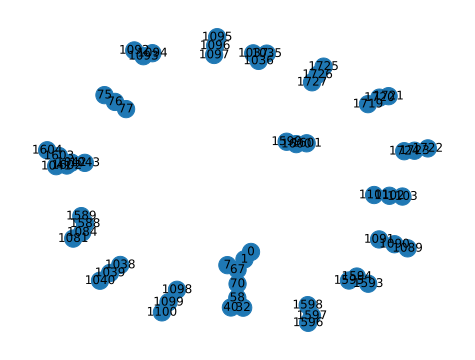

fusion  (1081, 1719)  success
fusion failure  1081 1719
rebuilding vertex 1081
connected components for neighbor 1084 : {1084, 1589, 1588}
set initial ghz as  (1081, 1084, 1731) fusing the last with neighbor 1084
rebuilding vertex 1719
connected components for neighbor 1720 : {1720, 1721}
set initial ghz as  (1719, 1720, 1721)
vertex map: {1081: 1730, 1084: 1729, 1719: 1733, 1720: 1732, 1721: 1731}
in dfs for graph with nodes [0, 1, 7, 32, 40, 58, 67, 70, 75, 76, 77, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1084, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1588, 1589, 1593, 1594, 1595, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604, 1722, 1723, 1724, 1725, 1726, 1727, 1728, 1729, 1730, 1731, 1732, 1733] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (5

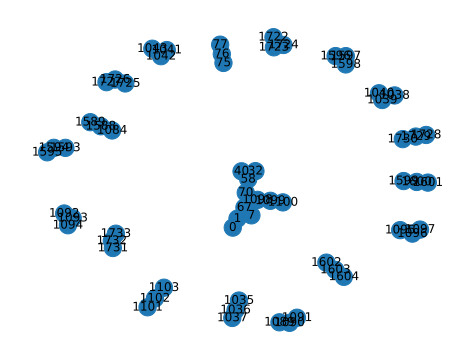

fusion  (1084, 1728)  success
fusion failure  1084 1728
rebuilding vertex 1084
connected components for neighbor 1588 : {1588, 1589}
set initial ghz as  (1084, 1588, 1589)
rebuilding vertex 1728
connected components for neighbor 1729 : {1729, 1730}
set initial ghz as  (1728, 1729, 1730)
vertex map: {1084: 1736, 1588: 1735, 1589: 1734, 1728: 1739, 1729: 1738, 1730: 1737}
fusion failure  1087 1587
rebuilding vertex 1087
connected components for neighbor 1084 : {1081, 1084, 20, 22}
set initial ghz as  (1087, 1084, 1743) fusing the last with neighbor 1084
rebuilding vertex 1587
connected components for neighbor 1588 : {1588, 1589}
set initial ghz as  (1587, 1588, 1589)
vertex map: {1087: 1742, 1084: 1741, 1587: 1745, 1588: 1744, 1589: 1743}
fusion failure  1085 1086
rebuilding vertex 1085
connected components for neighbor 1084 : {32, 1, 0, 67, 70, 7, 40, 20, 22, 1081, 58, 1084, 25}
set initial ghz as  (1085, 1084, 1749) fusing the last with neighbor 1084
rebuilding vertex 1086
connected co

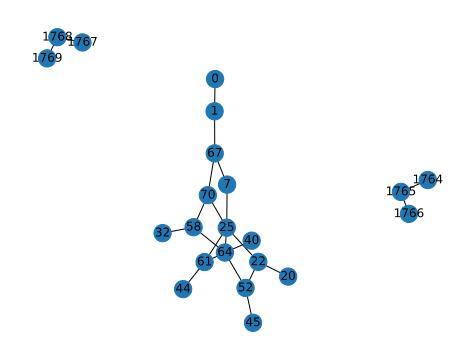

fusion  (58, 1764)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 40, 44, 45, 52, 61, 64, 67, 70, 1765, 1766, 1767, 1768, 1769] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (58, 1764), (40, 1767), (1766, 1769), (44, 45)]


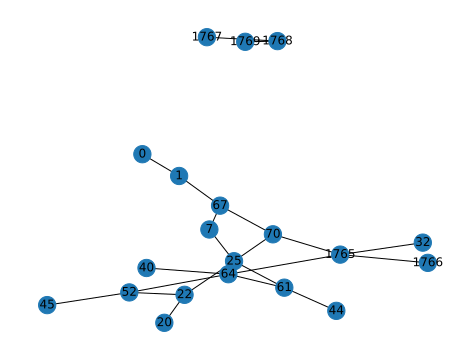

fusion  (40, 1767)  success
fusion failure  40 1767
rebuilding vertex 40
connected components for neighbor 64 : {64, 32, 1, 67, 0, 1765, 70, 7, 1766, 44, 45, 52, 20, 22, 25, 61}
set initial ghz as  (40, 64, 1773) fusing the last with neighbor 64
rebuilding vertex 1767
connected components for neighbor 1768 : {1768, 1769}
set initial ghz as  (1767, 1768, 1769)
vertex map: {40: 1772, 64: 1771, 1767: 1775, 1768: 1774, 1769: 1773}
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 52, 61, 64, 67, 70, 1765, 1766, 1770, 1771, 1772, 1773, 1774, 1775] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (11, 42), (64, 1770), (1772, 1775), (1766, 1773), (44, 45)]


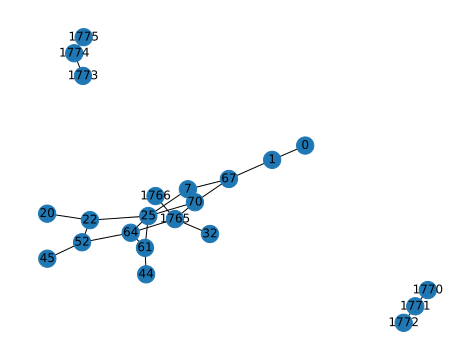

fusion  (64, 1770)  success
fusion failure  64 1770
rebuilding vertex 64
connected components for neighbor 61 : {32, 1, 0, 67, 1765, 70, 7, 1766, 44, 45, 20, 52, 22, 25, 61}
set initial ghz as  (64, 61, 1779) fusing the last with neighbor 61
add subgraph of neighbor 52
add subgraph of neighbor 25
add subgraph of neighbor 1765
rebuilding vertex 1770
connected components for neighbor 1771 : {1771, 1772}
set initial ghz as  (1770, 1771, 1772)
vertex map: {64: 1792, 61: 1777, 52: 1783, 25: 1789, 1765: 1795, 1770: 1799, 1771: 1798, 1772: 1797}
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 52, 61, 67, 70, 1765, 1766, 1773, 1774, 1775, 1776, 1777, 1778, 1779, 1780, 1781, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55

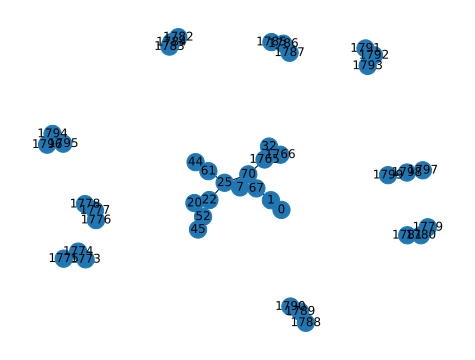

fusion  (61, 1776)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 52, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1778, 1779, 1780, 1781, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


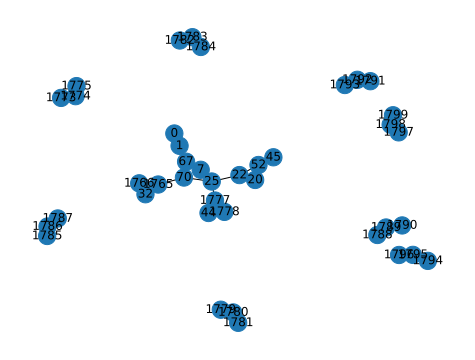

fusion  (1778, 1779)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 52, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1780, 1781, 1782, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


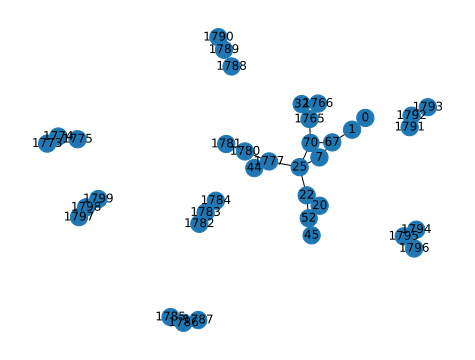

fusion  (1781, 1782)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 52, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1780, 1783, 1784, 1785, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


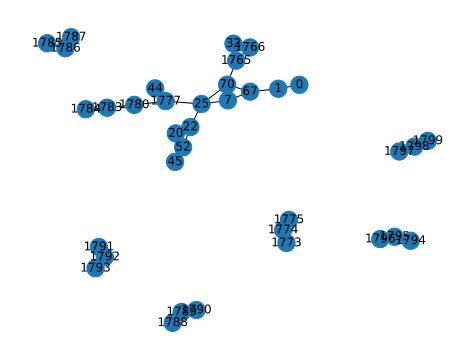

fusion  (1784, 52)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1780, 1783, 1785, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


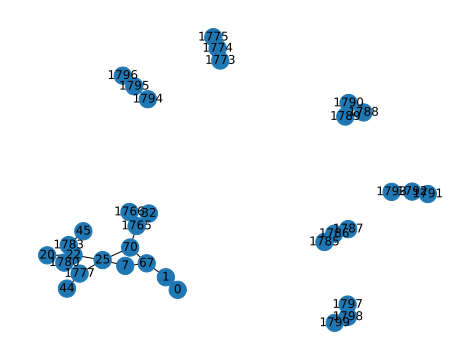

fusion  (1780, 1785)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1783, 1786, 1787, 1788, 1789, 1790, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


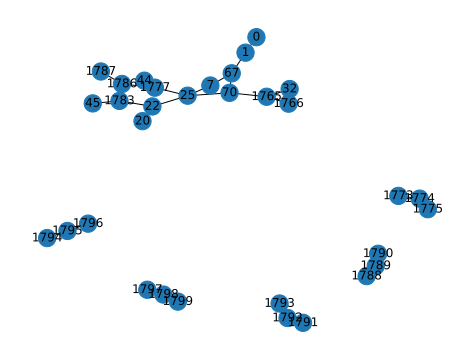

fusion  (1787, 1788)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 25, 32, 44, 45, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1783, 1786, 1789, 1790, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


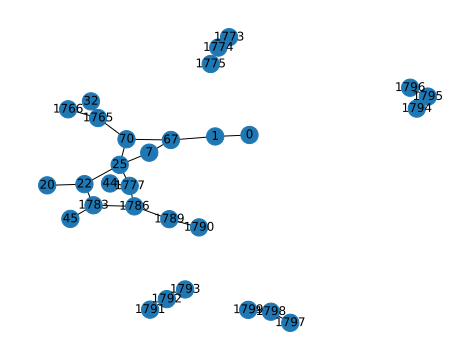

fusion  (1790, 25)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 44, 45, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1783, 1786, 1789, 1791, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


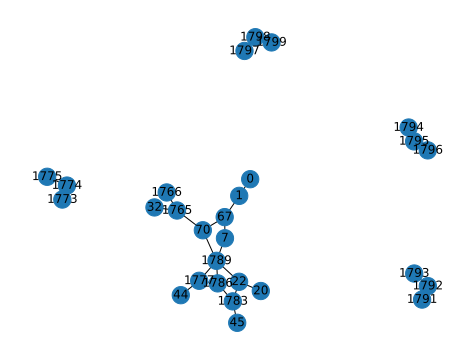

fusion  (1786, 1791)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 44, 45, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1793, 1794, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


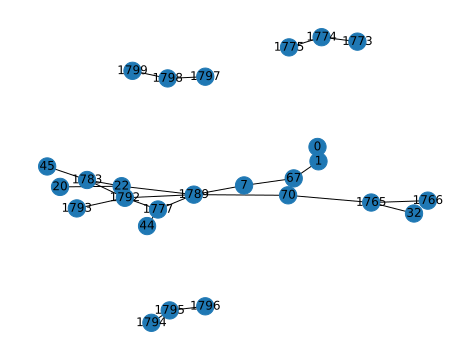

fusion  (1793, 1794)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 32, 44, 45, 67, 70, 1765, 1766, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1795, 1796, 1797, 1798, 1799] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1793, 1794), (1796, 1765), (1792, 1799), (1797, 1775), (1766, 1773), (44, 45)]


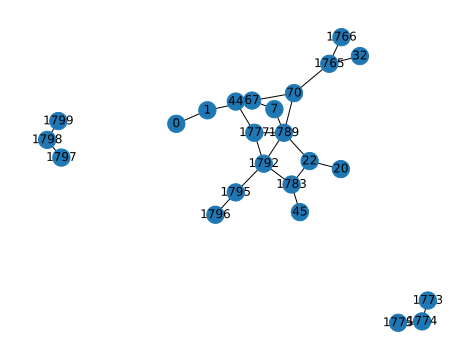

fusion  (1796, 1765)  success
fusion failure  1796 1765
rebuilding vertex 1796
connected components for neighbor 1795 : {1792, 1, 0, 1795, 67, 70, 7, 44, 45, 1777, 20, 22, 1783, 1789}
set initial ghz as  (1796, 1795, 1803) fusing the last with neighbor 1795
rebuilding vertex 1765
connected components for neighbor 1766 : {1766}
connected components for neighbor 32 : {32}
connected components for neighbor 70 : {1792, 1, 0, 67, 1795, 70, 7, 44, 45, 1777, 20, 22, 1783, 1789}
set initial ghz as  (1765, 70, 1806) fusing the last with neighbor 70
add singular vertex 1766
add singular vertex 32
vertex map: {1796: 1802, 1795: 1801, 1765: 1810, 70: 1804, 1766: 1808, 32: 1811}
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 67, 70, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1795, 1797, 1798, 1799, 1800, 1801, 1802, 1803, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 

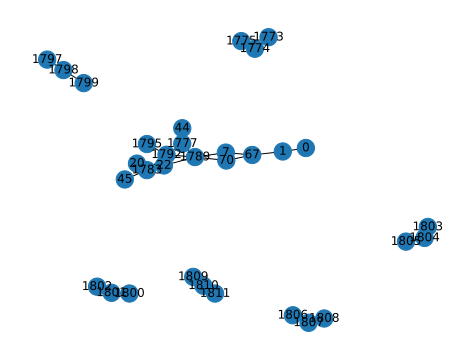

fusion  (1795, 1800)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 67, 70, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1797, 1798, 1799, 1801, 1802, 1803, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1795, 1800), (70, 1803), (1805, 1806), (1807, 1809), (1802, 1810), (1792, 1799), (1797, 1775), (1808, 1773), (44, 45)]


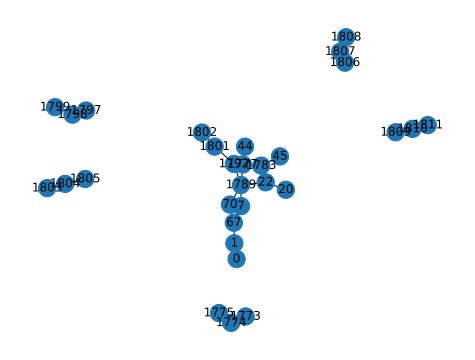

fusion  (70, 1803)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 67, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1797, 1798, 1799, 1801, 1802, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1795, 1800), (70, 1803), (1805, 1806), (1807, 1809), (1802, 1810), (1792, 1799), (1797, 1775), (1808, 1773), (44, 45)]


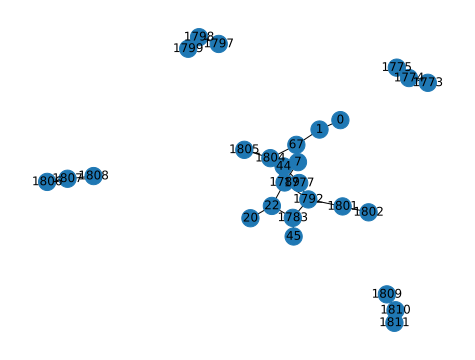

fusion  (1805, 1806)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 67, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1797, 1798, 1799, 1801, 1802, 1804, 1807, 1808, 1809, 1810, 1811] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (1795, 1800), (70, 1803), (1805, 1806), (1807, 1809), (1802, 1810), (1792, 1799), (1797, 1775), (1808, 1773), (44, 45)]


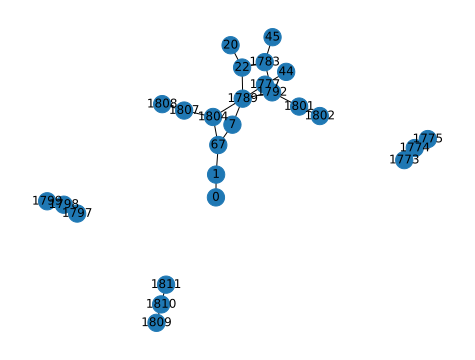

fusion  (1807, 1809)  success
fusion failure  1807 1809
rebuilding vertex 1807
connected components for neighbor 1808 : {1808}
connected components for neighbor 1804 : {1792, 1, 0, 67, 7, 1801, 1802, 1804, 44, 45, 1777, 20, 22, 1783, 1789}
set initial ghz as  (1807, 1804, 1815) fusing the last with neighbor 1804
add singular vertex 1808
rebuilding vertex 1809
connected components for neighbor 1810 : {1810, 1811}
set initial ghz as  (1809, 1810, 1811)
vertex map: {1807: 1816, 1804: 1813, 1808: 1817, 1809: 1820, 1810: 1819, 1811: 1818}
fusion failure  1805 1806
rebuilding vertex 1805
connected components for neighbor 1804 : {1792, 1, 0, 67, 7, 1801, 1802, 1804, 44, 45, 1777, 20, 22, 1783, 1789}
set initial ghz as  (1805, 1804, 1824) fusing the last with neighbor 1804
rebuilding vertex 1806
connected components for neighbor 1807 : {1808, 1807}
set initial ghz as  (1806, 1807, 1808)
vertex map: {1805: 1823, 1804: 1822, 1806: 1826, 1807: 1825, 1808: 1824}
fusion failure  70 1803
rebuilding 

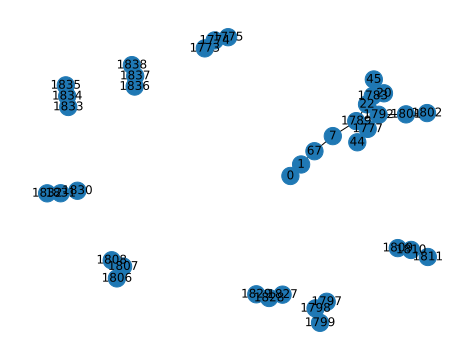

fusion  (67, 1827)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1829, 1830, 1831, 1832, 1833, 1834, 1835, 1836, 1837, 1838] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1832, 1833), (1835, 1789), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1792, 1799), (1797, 1775), (1808, 1773), (44, 45)]


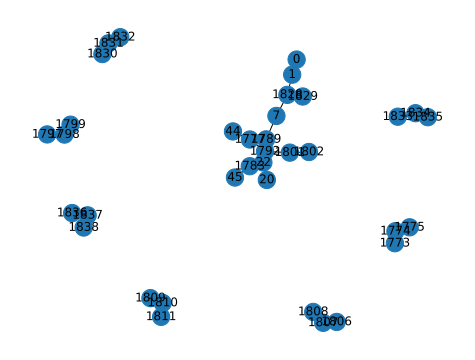

fusion  (1829, 1830)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1832, 1833, 1834, 1835, 1836, 1837, 1838] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1832, 1833), (1835, 1789), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1792, 1799), (1797, 1775), (1808, 1773), (44, 45)]


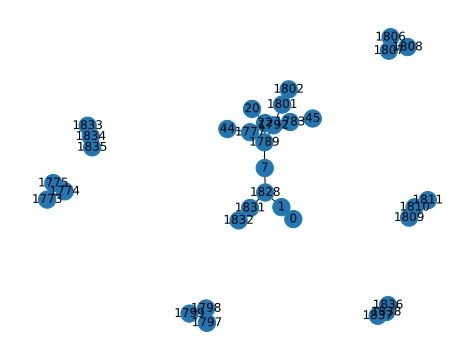

fusion  (1832, 1833)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 1773, 1774, 1775, 1777, 1783, 1789, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1834, 1835, 1836, 1837, 1838] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1832, 1833), (1835, 1789), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1792, 1799), (1797, 1775), (1808, 1773), (44, 45)]


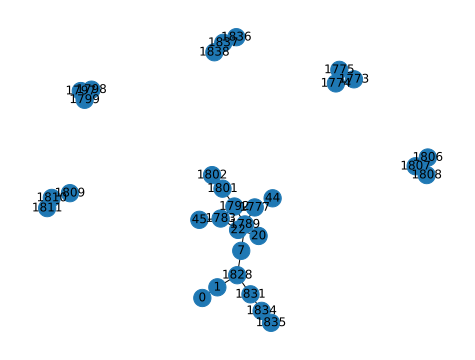

fusion  (1835, 1789)  success
fusion failure  1835 1789
rebuilding vertex 1835
connected components for neighbor 1834 : {0, 1, 1828, 7, 1831, 1834}
set initial ghz as  (1835, 1834, 1842) fusing the last with neighbor 1834
rebuilding vertex 1789
connected components for neighbor 22 : {1792, 1801, 1802, 44, 45, 1777, 20, 22, 1783}
set initial ghz as  (1789, 22, 1845) fusing the last with neighbor 22
add subgraph of neighbor 7
add subgraph of neighbor 1777
add subgraph of neighbor 1792
vertex map: {1835: 1841, 1834: 1840, 1789: 1858, 22: 1843, 7: 1849, 1777: 1855, 1792: 1861}
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1834, 1836, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (6

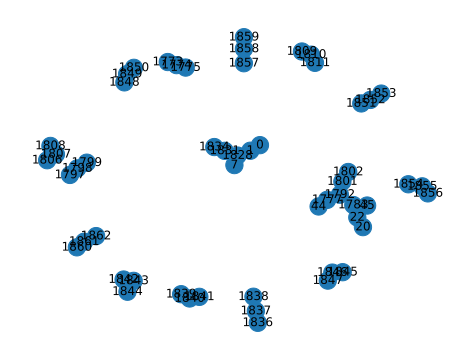

fusion  (1834, 1839)  success
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 17

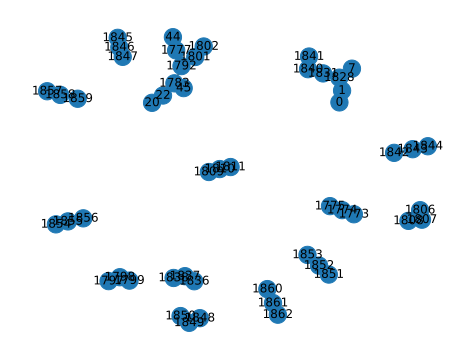

fusion  (22, 1842)  success
in dfs for graph with nodes [0, 1, 7, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1844, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45

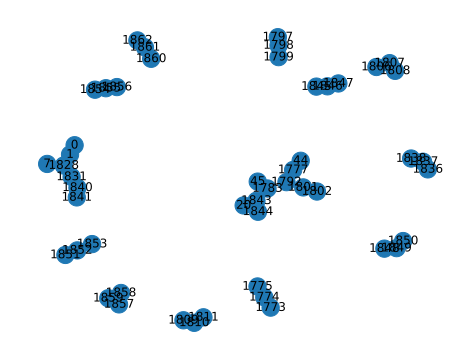

fusion  (1844, 1845)  success
in dfs for graph with nodes [0, 1, 7, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


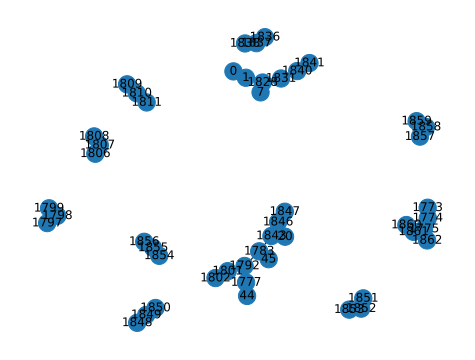

fusion  (1847, 1848)  success
in dfs for graph with nodes [0, 1, 7, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1846, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


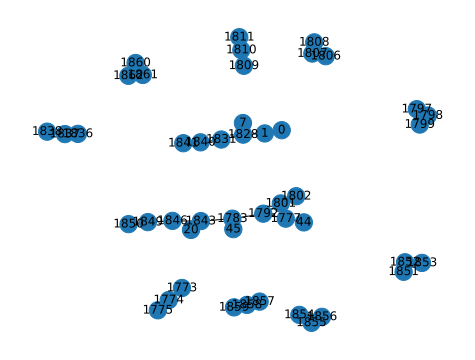

fusion  (1850, 7)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1846, 1849, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


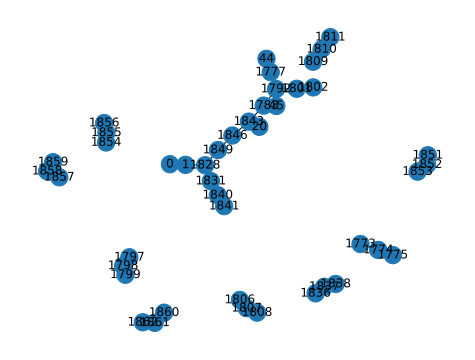

fusion  (1846, 1851)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


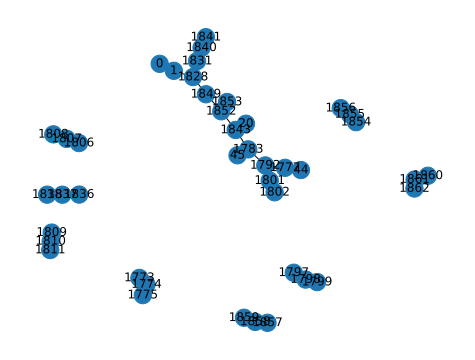

fusion  (1853, 1854)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1852, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


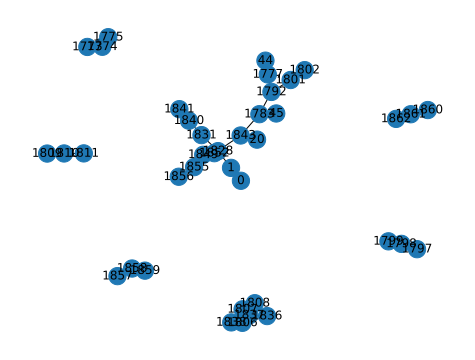

fusion  (1856, 1777)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1852, 1855, 1857, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


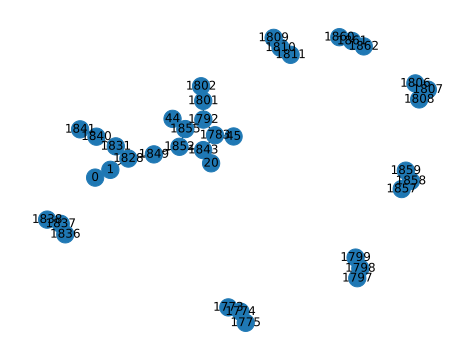

fusion  (1852, 1857)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1859, 1860, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


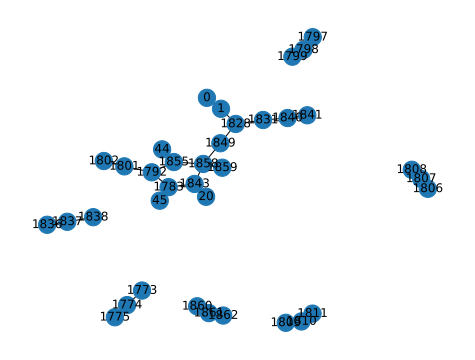

fusion  (1859, 1860)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1861, 1862] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773), (44, 45)]


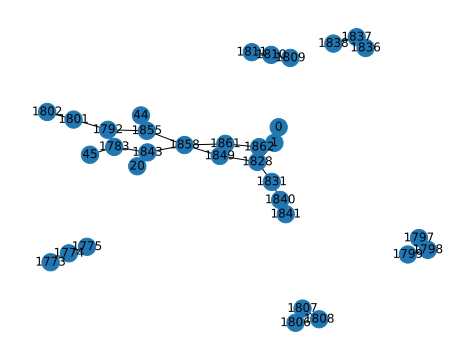

fusion  (1862, 1792)  success
fusion failure  1862 1792
rebuilding vertex 1862
connected components for neighbor 1861 : {0, 1, 1858, 1828, 1861, 1831, 44, 45, 1840, 1841, 1843, 20, 1783, 1849, 1855}
set initial ghz as  (1862, 1861, 1866) fusing the last with neighbor 1861
rebuilding vertex 1792
connected components for neighbor 1783 : {0, 1, 1858, 1828, 1861, 1831, 44, 45, 1840, 1841, 1843, 20, 1783, 1849, 1855}
set initial ghz as  (1792, 1783, 1869) fusing the last with neighbor 1783
add subgraph of neighbor 1855
vertex map: {1862: 1865, 1861: 1864, 1792: 1876, 1783: 1867, 1801: 1873, 1802: 1874, 1855: 1879}
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1783, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1861, 1863, 1864, 1865, 1866, 1867, 1868, 1869, 1870, 1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 2

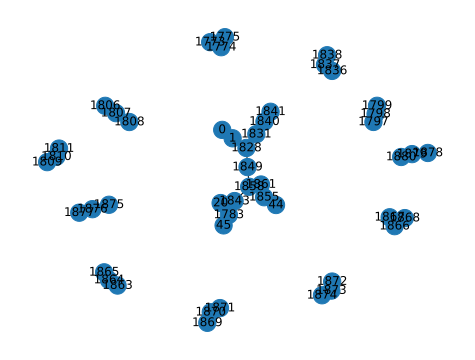

fusion  (1861, 1863)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1783, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1864, 1865, 1866, 1867, 1868, 1869, 1870, 1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1861, 1863), (1783, 1866), (1868, 1869), (1871, 1872), (1870, 1875), (1877, 1878), (1880, 1855), (1865, 1876), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809)

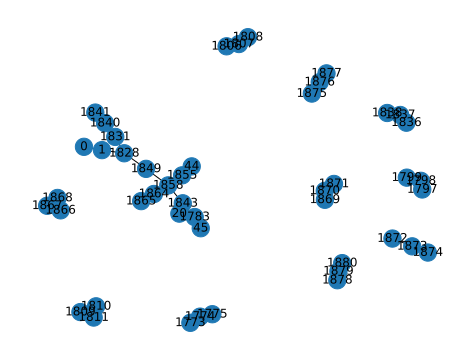

fusion  (1783, 1866)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1864, 1865, 1867, 1868, 1869, 1870, 1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1861, 1863), (1783, 1866), (1868, 1869), (1871, 1872), (1870, 1875), (1877, 1878), (1880, 1855), (1865, 1876), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1874, 181

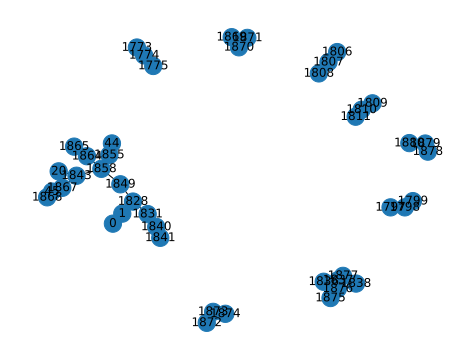

fusion  (1868, 1869)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1864, 1865, 1867, 1870, 1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1861, 1863), (1783, 1866), (1868, 1869), (1871, 1872), (1870, 1875), (1877, 1878), (1880, 1855), (1865, 1876), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1874, 1810), (1864, 1

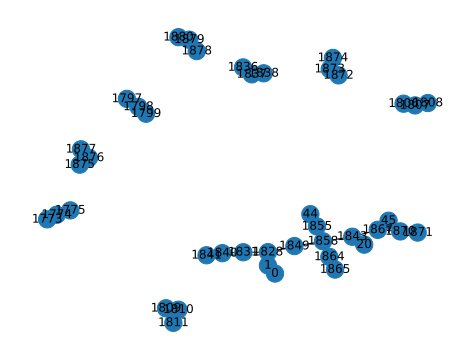

fusion  (1871, 1872)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1864, 1865, 1867, 1870, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1861, 1863), (1783, 1866), (1868, 1869), (1871, 1872), (1870, 1875), (1877, 1878), (1880, 1855), (1865, 1876), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1874, 1810), (1864, 1799), (1797,

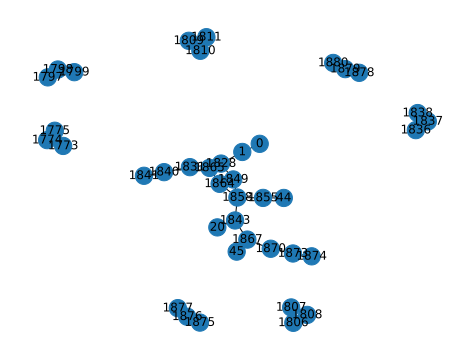

fusion  (1870, 1875)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1864, 1865, 1867, 1873, 1874, 1876, 1877, 1878, 1879, 1880] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1861, 1863), (1783, 1866), (1868, 1869), (1871, 1872), (1870, 1875), (1877, 1878), (1880, 1855), (1865, 1876), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1874, 1810), (1864, 1799), (1797, 1775), (180

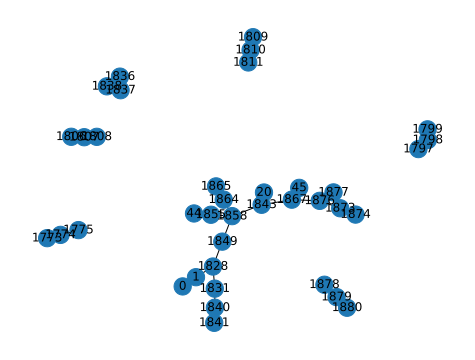

fusion  (1877, 1878)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1855, 1858, 1864, 1865, 1867, 1873, 1874, 1876, 1879, 1880] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1861, 1863), (1783, 1866), (1868, 1869), (1871, 1872), (1870, 1875), (1877, 1878), (1880, 1855), (1865, 1876), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1874, 1810), (1864, 1799), (1797, 1775), (1808, 1773), (4

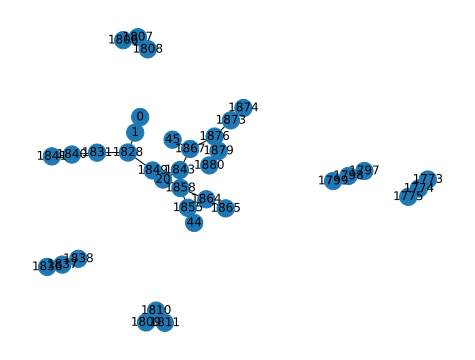

fusion  (1880, 1855)  success
fusion failure  1880 1855
rebuilding vertex 1880
connected components for neighbor 1879 : {0, 1, 1858, 1828, 1831, 1864, 1865, 1867, 45, 1840, 1873, 1874, 1843, 1876, 20, 1841, 1879, 1849}
set initial ghz as  (1880, 1879, 1884) fusing the last with neighbor 1879
rebuilding vertex 1855
connected components for neighbor 44 : {44}
connected components for neighbor 1858 : {0, 1, 1858, 1828, 1831, 1864, 1865, 1867, 45, 1840, 1873, 1874, 1843, 20, 1876, 1841, 1879, 1849}
set initial ghz as  (1855, 1858, 1887) fusing the last with neighbor 1858
add singular vertex 44
vertex map: {1880: 1883, 1879: 1882, 1855: 1888, 1858: 1885, 44: 1889}
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1858, 1864, 1865, 1867, 1873, 1874, 1876, 1879, 1881, 1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54

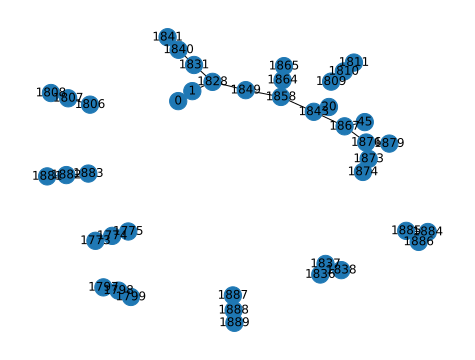

fusion  (1879, 1881)  success
fusion failure  1879 1881
rebuilding vertex 1879
connected components for neighbor 1876 : {0, 1, 1858, 1828, 1831, 1864, 1865, 1867, 45, 1840, 1873, 1874, 1843, 1876, 20, 1841, 1849}
set initial ghz as  (1879, 1876, 1893) fusing the last with neighbor 1876
rebuilding vertex 1881
connected components for neighbor 1882 : {1882, 1883}
set initial ghz as  (1881, 1882, 1883)
vertex map: {1879: 1892, 1876: 1891, 1881: 1895, 1882: 1894, 1883: 1893}
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1858, 1864, 1865, 1867, 1873, 1874, 1876, 1884, 1885, 1886, 1887, 1888, 1889, 1890, 1891, 1892, 1893, 1894, 1895] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (

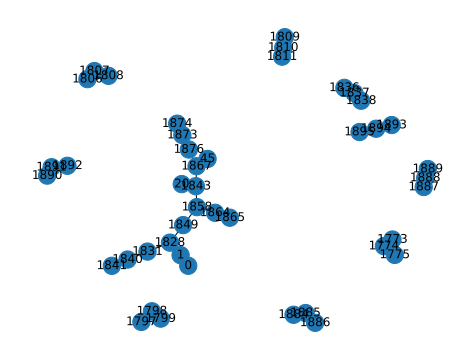

fusion  (1876, 1890)  success
fusion failure  1876 1890
rebuilding vertex 1876
connected components for neighbor 1867 : {0, 1, 1858, 1828, 1831, 1864, 1865, 1867, 45, 1840, 1841, 1843, 20, 1849}
set initial ghz as  (1876, 1867, 1899) fusing the last with neighbor 1867
rebuilding vertex 1890
connected components for neighbor 1891 : {1891, 1892}
set initial ghz as  (1890, 1891, 1892)
vertex map: {1876: 1900, 1867: 1897, 1873: 1903, 1874: 1904, 1890: 1907, 1891: 1906, 1892: 1905}
fusion failure  1877 1878
rebuilding vertex 1877
connected components for neighbor 1876 : {0, 1, 20, 1828, 1831, 44, 45, 1840, 1841, 1843, 1849, 1855, 1858, 1864, 1865, 1867, 1873, 1874, 1876}
set initial ghz as  (1877, 1876, 1911) fusing the last with neighbor 1876
rebuilding vertex 1878
connected components for neighbor 1879 : {1880, 1879}
set initial ghz as  (1878, 1879, 1880)
vertex map: {1877: 1910, 1876: 1909, 1878: 1913, 1879: 1912, 1880: 1911}
fusion failure  1870 1875
rebuilding vertex 1870
connected com

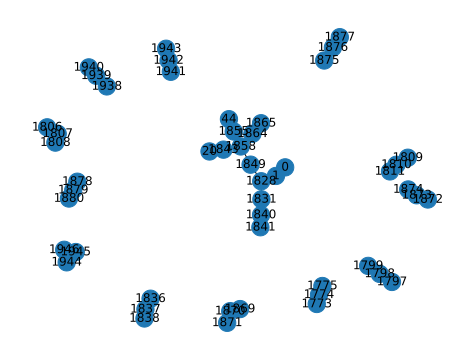

fusion  (1843, 1938)  success
in dfs for graph with nodes [0, 1, 20, 44, 1773, 1774, 1775, 1797, 1798, 1799, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1849, 1855, 1858, 1864, 1865, 1869, 1870, 1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1843, 1938), (1940, 1941), (1942, 1946), (1944, 1869), (1871, 1872), (1870, 1875), (1877, 1878), (1880, 1855), (1865, 1876), (1841, 1858), (1831, 1838)

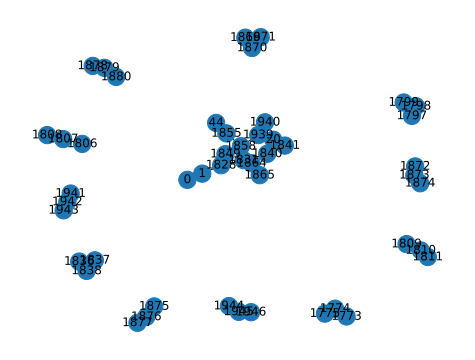

fusion  (1940, 1941)  success
fusion failure  1940 1941
rebuilding vertex 1940
connected components for neighbor 1939 : {0, 1, 1858, 1828, 1831, 1864, 1865, 44, 1840, 1841, 1939, 20, 1849, 1855}
set initial ghz as  (1940, 1939, 1950) fusing the last with neighbor 1939
rebuilding vertex 1941
connected components for neighbor 1942 : {1942, 1943}
set initial ghz as  (1941, 1942, 1943)
vertex map: {1940: 1949, 1939: 1948, 1941: 1952, 1942: 1951, 1943: 1950}
fusion failure  1843 1938
rebuilding vertex 1843
connected components for neighbor 20 : {20}
connected components for neighbor 1858 : {0, 1, 1858, 1828, 1831, 1864, 1865, 44, 1840, 1841, 1849, 1855}
set initial ghz as  (1843, 1858, 1956) fusing the last with neighbor 1858
add singular vertex 20
rebuilding vertex 1938
connected components for neighbor 1939 : {1939, 1940}
set initial ghz as  (1938, 1939, 1940)
vertex map: {1843: 1957, 1858: 1954, 20: 1958, 1938: 1961, 1939: 1960, 1940: 1959}
fusion failure  1861 1863
rebuilding vertex 186

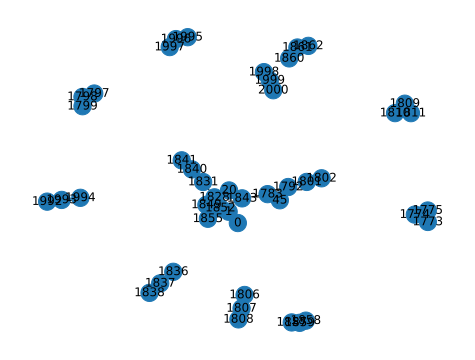

fusion  (1855, 1992)  success
fusion failure  1855 1992
rebuilding vertex 1855
connected components for neighbor 1852 : {1792, 1, 0, 1828, 1831, 1801, 1802, 45, 1840, 1841, 1843, 20, 1783, 1849, 1852}
set initial ghz as  (1855, 1852, 2004) fusing the last with neighbor 1852
rebuilding vertex 1992
connected components for neighbor 1993 : {1993, 1994}
set initial ghz as  (1992, 1993, 1994)
vertex map: {1855: 2003, 1852: 2002, 1992: 2006, 1993: 2005, 1994: 2004}
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1852, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57),

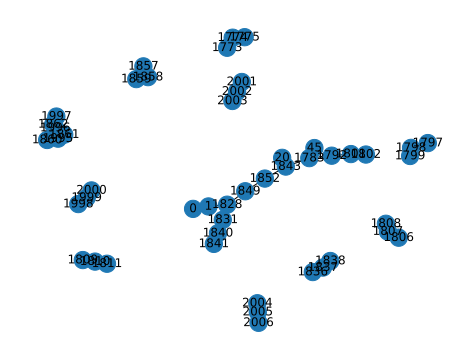

fusion  (1852, 2001)  success
fusion failure  1852 2001
rebuilding vertex 1852
connected components for neighbor 1843 : {1792, 1801, 1802, 45, 1843, 20, 1783}
set initial ghz as  (1852, 1843, 2010) fusing the last with neighbor 1843
add subgraph of neighbor 1849
rebuilding vertex 2001
connected components for neighbor 2002 : {2002, 2003}
set initial ghz as  (2001, 2002, 2003)
vertex map: {1852: 2011, 1843: 2008, 1849: 2014, 2001: 2018, 2002: 2017, 2003: 2016}
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1849, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (

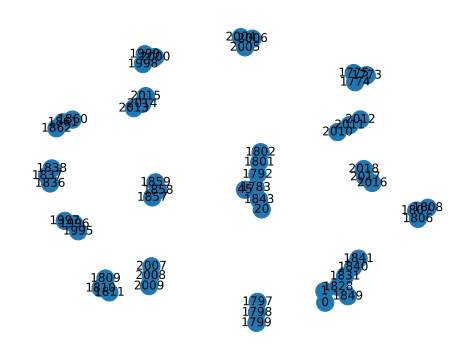

fusion  (1843, 2007)  success
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1849, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1843, 2007), (2009, 2010), (2012, 2013), (2015, 1849), (2011, 2018), (2016, 2006), (1792, 1995), (1997, 1998), (2004, 1999), (2017, 1857), (1859, 1860), (1862, 1996), (1841, 1858), (

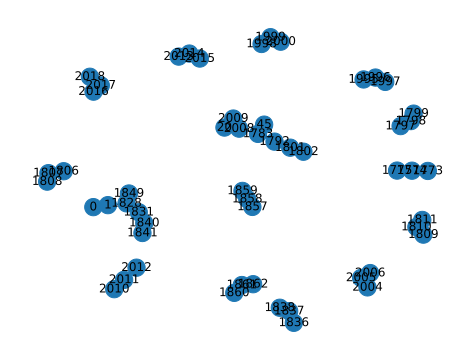

fusion  (2009, 2010)  success
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1849, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1843, 2007), (2009, 2010), (2012, 2013), (2015, 1849), (2011, 2018), (2016, 2006), (1792, 1995), (1997, 1998), (2004, 1999), (2017, 1857), (1859, 1860), (1862, 1996), (1841, 1858), (1831, 1838),

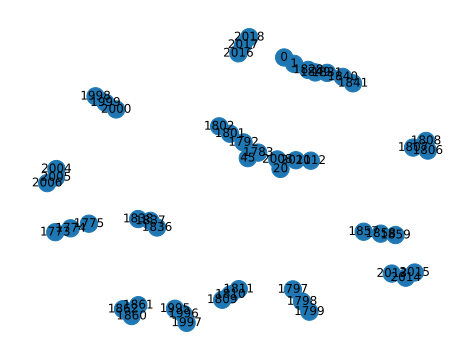

fusion  (2012, 2013)  success
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1849, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2011, 2014, 2015, 2016, 2017, 2018] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1843, 2007), (2009, 2010), (2012, 2013), (2015, 1849), (2011, 2018), (2016, 2006), (1792, 1995), (1997, 1998), (2004, 1999), (2017, 1857), (1859, 1860), (1862, 1996), (1841, 1858), (1831, 1838), (1836, 1806

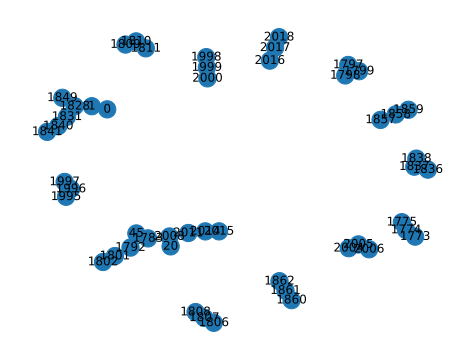

fusion  (2015, 1849)  success
fusion failure  2015 1849
rebuilding vertex 2015
connected components for neighbor 2014 : {1792, 1801, 1802, 45, 20, 1783, 2008, 2011, 2014}
set initial ghz as  (2015, 2014, 2022) fusing the last with neighbor 2014
rebuilding vertex 1849
connected components for neighbor 1828 : {0, 1, 1828, 1831, 1840, 1841}
set initial ghz as  (1849, 1828, 2025) fusing the last with neighbor 1828
vertex map: {2015: 2021, 2014: 2020, 1849: 2024, 1828: 2023}
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2011, 2014, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (1

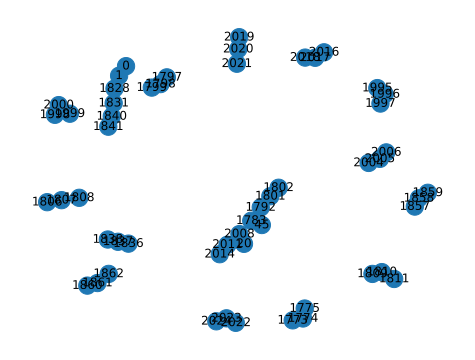

fusion  (2014, 2019)  success
in dfs for graph with nodes [0, 1, 20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2011, 2016, 2017, 2018, 2020, 2021, 2022, 2023, 2024] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1843, 2007), (2009, 2010), (2014, 2019), (1828, 2022), (2021, 2024), (2011, 2018), (2016, 2006), (1792, 1995), (1997, 1998), (2004, 1999), (2017, 1857), (1859, 1860), (1862, 1996), (1841, 1858),

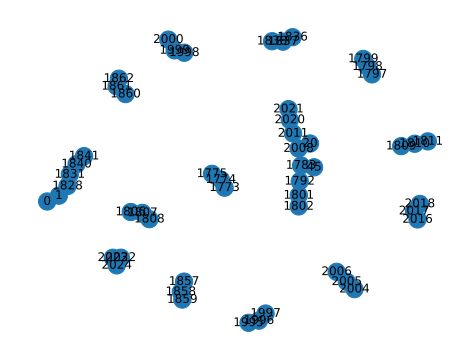

fusion  (1828, 2022)  success
fusion failure  1828 2022
rebuilding vertex 1828
connected components for neighbor 1 : {0, 1}
set initial ghz as  (1828, 1, 0)
add subgraph of neighbor 1831
rebuilding vertex 2022
connected components for neighbor 2023 : {2024, 2023}
set initial ghz as  (2022, 2023, 2024)
vertex map: {1828: 2029, 1: 2026, 0: 2025, 1831: 2032, 2022: 2036, 2023: 2035, 2024: 2034}
in dfs for graph with nodes [20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1831, 1836, 1837, 1838, 1840, 1841, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2011, 2016, 2017, 2018, 2020, 2021, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46

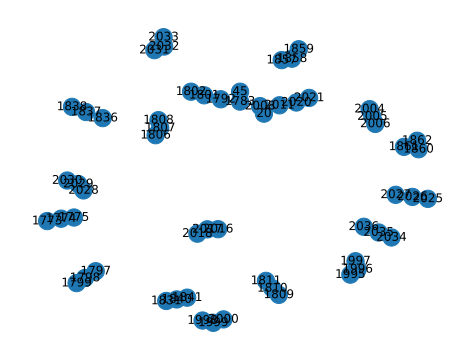

fusion  (2027, 2028)  success
in dfs for graph with nodes [20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1831, 1836, 1837, 1838, 1840, 1841, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2011, 2016, 2017, 2018, 2020, 2021, 2025, 2026, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1843, 2007), (2009, 2010), (2027, 2028), (2030, 2031), (2033, 1831), (2029, 2036), (2021, 2034), (2011, 2018), (2016, 2006), (1792, 1995), (1997, 1998), (2004, 1999

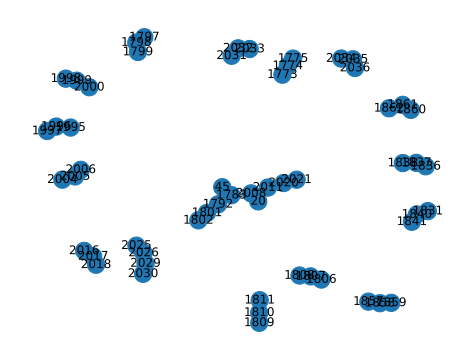

fusion  (2030, 2031)  success
in dfs for graph with nodes [20, 45, 1773, 1774, 1775, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1831, 1836, 1837, 1838, 1840, 1841, 1857, 1858, 1859, 1860, 1861, 1862, 1995, 1996, 1997, 1998, 1999, 2000, 2004, 2005, 2006, 2008, 2011, 2016, 2017, 2018, 2020, 2021, 2025, 2026, 2029, 2032, 2033, 2034, 2035, 2036] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1847, 1848), (1843, 2007), (2009, 2010), (2027, 2028), (2030, 2031), (2033, 1831), (2029, 2036), (2021, 2034), (2011, 2018), (2016, 2006), (1792, 1995), (1997, 1998), (2004, 1999), (2017, 18

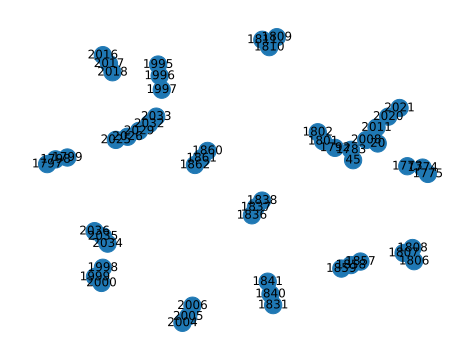

fusion  (2033, 1831)  success
fusion failure  2033 1831
rebuilding vertex 2033
connected components for neighbor 2032 : {2032, 2025, 2026, 2029}
set initial ghz as  (2033, 2032, 2040) fusing the last with neighbor 2032
rebuilding vertex 1831
connected components for neighbor 1840 : {1840, 1841}
set initial ghz as  (1831, 1840, 1841)
vertex map: {2033: 2039, 2032: 2038, 1831: 2042, 1840: 2041, 1841: 2040}
fusion failure  2030 2031
rebuilding vertex 2030
connected components for neighbor 2029 : {2025, 2026, 2029}
set initial ghz as  (2030, 2029, 2046) fusing the last with neighbor 2029
rebuilding vertex 2031
connected components for neighbor 2032 : {2032, 2033}
set initial ghz as  (2031, 2032, 2033)
vertex map: {2030: 2045, 2029: 2044, 2031: 2048, 2032: 2047, 2033: 2046}
fusion failure  2027 2028
rebuilding vertex 2027
connected components for neighbor 2026 : {2025, 2026}
set initial ghz as  (2027, 2026, 2025)
rebuilding vertex 2028
connected components for neighbor 2029 : {2029, 2030}
s

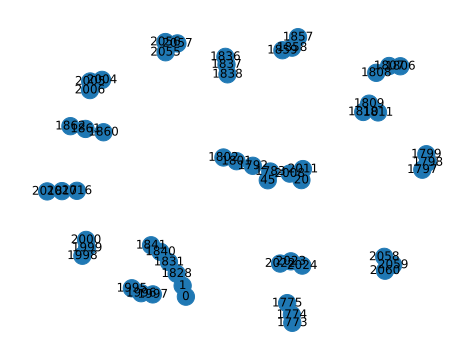

fusion  (2011, 2055)  success
fusion failure  2011 2055
rebuilding vertex 2011
connected components for neighbor 2008 : {1792, 1801, 1802, 45, 20, 1783, 2008}
set initial ghz as  (2011, 2008, 2064) fusing the last with neighbor 2008
rebuilding vertex 2055
connected components for neighbor 2056 : {2056, 2057}
set initial ghz as  (2055, 2056, 2057)
vertex map: {2011: 2063, 2008: 2062, 2055: 2066, 2056: 2065, 2057: 2064}
fusion failure  2012 2013
rebuilding vertex 2012
connected components for neighbor 2011 : {1792, 1801, 1802, 45, 20, 1783, 2008, 2011}
set initial ghz as  (2012, 2011, 2070) fusing the last with neighbor 2011
rebuilding vertex 2013
connected components for neighbor 2014 : {2014, 2015}
set initial ghz as  (2013, 2014, 2015)
vertex map: {2012: 2069, 2011: 2068, 2013: 2072, 2014: 2071, 2015: 2070}
fusion failure  2009 2010
rebuilding vertex 2009
connected components for neighbor 2008 : {1792, 1801, 1802, 45, 20, 1783, 2008}
set initial ghz as  (2009, 2008, 2076) fusing the l

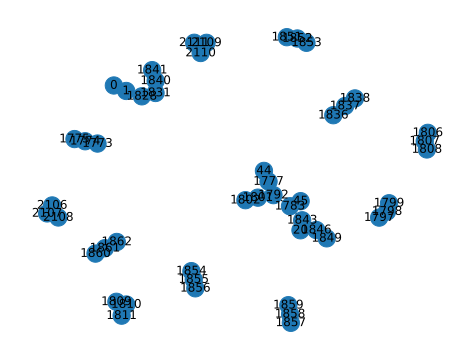

fusion  (1849, 2106)  success
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1846, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2107, 2108, 2109, 2110, 2111] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (1849, 2106), (1828, 2109), (2108, 2111), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861, 1799), (1797, 1775), (1808, 1773

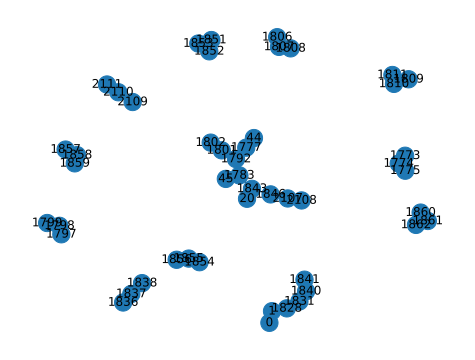

fusion  (1828, 2109)  success
fusion failure  1828 2109
rebuilding vertex 1828
connected components for neighbor 1 : {0, 1}
set initial ghz as  (1828, 1, 0)
add subgraph of neighbor 1831
rebuilding vertex 2109
connected components for neighbor 2110 : {2110, 2111}
set initial ghz as  (2109, 2110, 2111)
vertex map: {1828: 2116, 1: 2113, 0: 2112, 1831: 2119, 2109: 2123, 2110: 2122, 2111: 2121}
in dfs for graph with nodes [20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1846, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2107, 2108, 2112, 2113, 2114, 2115, 2116, 2117, 2118, 2119, 2120, 2121, 2122, 2123] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (

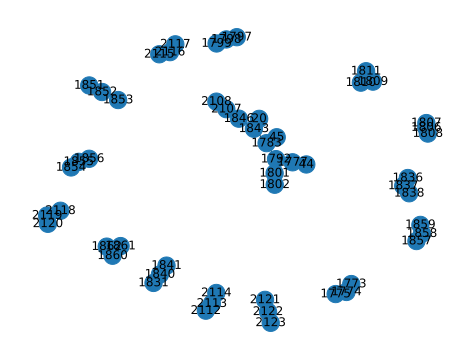

fusion  (2114, 2115)  success
in dfs for graph with nodes [20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1846, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2107, 2108, 2112, 2113, 2116, 2117, 2118, 2119, 2120, 2121, 2122, 2123] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (2114, 2115), (2117, 2118), (2120, 1831), (2116, 2123), (2108, 2121), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (2119, 1838), (1836, 1806), (1807, 18

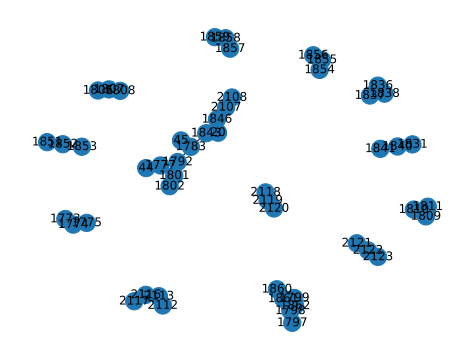

fusion  (2117, 2118)  success
in dfs for graph with nodes [20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1846, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2107, 2108, 2112, 2113, 2116, 2119, 2120, 2121, 2122, 2123] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1834, 1839), (22, 1842), (1844, 1845), (2114, 2115), (2117, 2118), (2120, 1831), (2116, 2123), (2108, 2121), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (2119, 1838), (1836, 1806), (1807, 1809), (1802, 

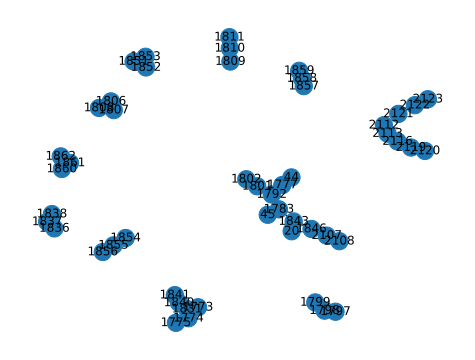

fusion  (2120, 1831)  success
fusion failure  2120 1831
rebuilding vertex 2120
connected components for neighbor 2119 : {2112, 2113, 2116, 2119}
set initial ghz as  (2120, 2119, 2127) fusing the last with neighbor 2119
rebuilding vertex 1831
connected components for neighbor 1840 : {1840, 1841}
set initial ghz as  (1831, 1840, 1841)
vertex map: {2120: 2126, 2119: 2125, 1831: 2129, 1840: 2128, 1841: 2127}
fusion failure  2117 2118
rebuilding vertex 2117
connected components for neighbor 2116 : {2112, 2113, 2116}
set initial ghz as  (2117, 2116, 2133) fusing the last with neighbor 2116
rebuilding vertex 2118
connected components for neighbor 2119 : {2120, 2119}
set initial ghz as  (2118, 2119, 2120)
vertex map: {2117: 2132, 2116: 2131, 2118: 2135, 2119: 2134, 2120: 2133}
fusion failure  2114 2115
rebuilding vertex 2114
connected components for neighbor 2113 : {2112, 2113}
set initial ghz as  (2114, 2113, 2112)
rebuilding vertex 2115
connected components for neighbor 2116 : {2116, 2117}
s

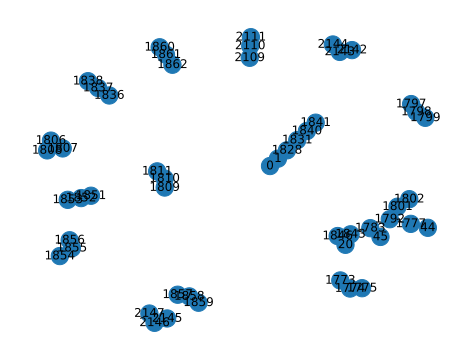

fusion  (1846, 2142)  success
fusion failure  1846 2142
rebuilding vertex 1846
connected components for neighbor 1843 : {1792, 1801, 1802, 44, 45, 1777, 1843, 20, 1783}
set initial ghz as  (1846, 1843, 2151) fusing the last with neighbor 1843
rebuilding vertex 2142
connected components for neighbor 2143 : {2144, 2143}
set initial ghz as  (2142, 2143, 2144)
vertex map: {1846: 2150, 1843: 2149, 2142: 2153, 2143: 2152, 2144: 2151}
in dfs for graph with nodes [0, 1, 20, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1843, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2109, 2110, 2111, 2145, 2146, 2147, 2148, 2149, 2150, 2151, 2152, 2153] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57

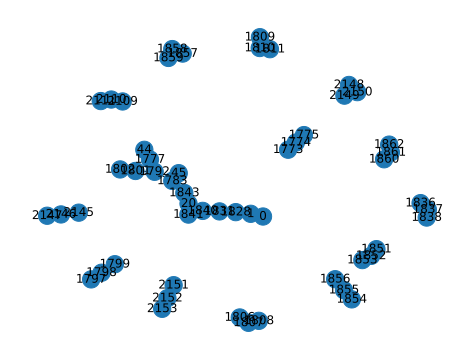

fusion  (1843, 2148)  success
fusion failure  1843 2148
rebuilding vertex 1843
connected components for neighbor 20 : {20}
connected components for neighbor 1783 : {1792, 1801, 1802, 44, 45, 1777, 1783}
set initial ghz as  (1843, 1783, 2157) fusing the last with neighbor 1783
add singular vertex 20
rebuilding vertex 2148
connected components for neighbor 2149 : {2149, 2150}
set initial ghz as  (2148, 2149, 2150)
vertex map: {1843: 2158, 1783: 2155, 20: 2159, 2148: 2162, 2149: 2161, 2150: 2160}
in dfs for graph with nodes [0, 1, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2109, 2110, 2111, 2145, 2146, 2147, 2151, 2152, 2153, 2154, 2155, 2156, 2157, 2158, 2159, 2160, 2161, 2162] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43,

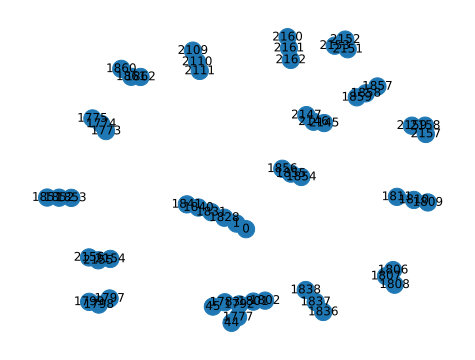

fusion  (1783, 2154)  success
in dfs for graph with nodes [0, 1, 44, 45, 1773, 1774, 1775, 1777, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2109, 2110, 2111, 2145, 2146, 2147, 2151, 2152, 2153, 2155, 2156, 2157, 2158, 2159, 2160, 2161, 2162] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1783, 2154), (2156, 2157), (2158, 2162), (2160, 2153), (2151, 2147), (1828, 2109), (2145, 2111), (2152, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (

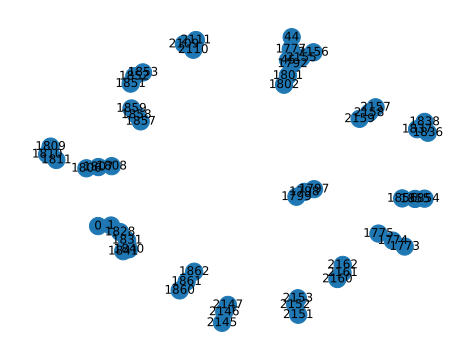

fusion  (2156, 2157)  success
fusion failure  2156 2157
rebuilding vertex 2156
connected components for neighbor 2155 : {1792, 1801, 1802, 2155, 44, 45, 1777}
set initial ghz as  (2156, 2155, 2166) fusing the last with neighbor 2155
rebuilding vertex 2157
connected components for neighbor 2158 : {2158, 2159}
set initial ghz as  (2157, 2158, 2159)
vertex map: {2156: 2165, 2155: 2164, 2157: 2168, 2158: 2167, 2159: 2166}
fusion failure  1783 2154
rebuilding vertex 1783
connected components for neighbor 45 : {45}
connected components for neighbor 1792 : {1792, 1801, 1802, 44, 1777}
set initial ghz as  (1783, 1792, 2172) fusing the last with neighbor 1792
add singular vertex 45
rebuilding vertex 2154
connected components for neighbor 2155 : {2155, 2156}
set initial ghz as  (2154, 2155, 2156)
vertex map: {1783: 2173, 1792: 2170, 45: 2174, 2154: 2177, 2155: 2176, 2156: 2175}
fusion failure  1847 1848
rebuilding vertex 1847
connected components for neighbor 1846 : {1792, 1801, 1802, 44, 45, 17

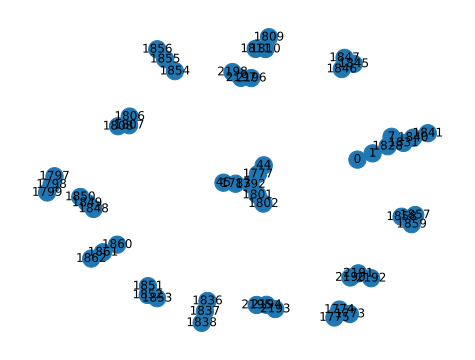

fusion  (1783, 2190)  success
in dfs for graph with nodes [0, 1, 7, 44, 45, 1773, 1774, 1775, 1777, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1831, 1836, 1837, 1838, 1840, 1841, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2191, 2192, 2193, 2194, 2195, 2196, 2197, 2198] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (2, 3), (10, 12), (61, 1776), (1778, 1779), (1781, 1782), (1784, 52), (1780, 1785), (1787, 1788), (1790, 25), (1786, 1791), (67, 1827), (1829, 1830), (1783, 2190), (2192, 2193), (2194, 2198), (2196, 1845), (1847, 1848), (1850, 7), (1846, 1851), (1853, 1854), (1856, 1777), (1852, 1857), (1859, 1860), (1862, 1792), (1841, 1858), (1831, 1838), (1836, 1806), (1807, 1809), (1802, 1810), (1861

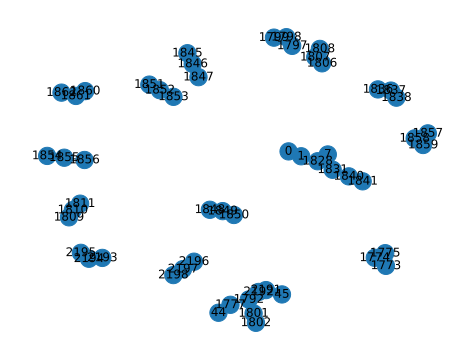

fusion  (2192, 2193)  success
fusion failure  2192 2193
rebuilding vertex 2192
connected components for neighbor 2191 : {1792, 1801, 1802, 44, 45, 2191, 1777}
set initial ghz as  (2192, 2191, 2202) fusing the last with neighbor 2191
rebuilding vertex 2193
connected components for neighbor 2194 : {2194, 2195}
set initial ghz as  (2193, 2194, 2195)
vertex map: {2192: 2201, 2191: 2200, 2193: 2204, 2194: 2203, 2195: 2202}
fusion failure  1783 2190
rebuilding vertex 1783
connected components for neighbor 45 : {45}
connected components for neighbor 1792 : {1792, 1801, 1802, 44, 1777}
set initial ghz as  (1783, 1792, 2208) fusing the last with neighbor 1792
add singular vertex 45
rebuilding vertex 2190
connected components for neighbor 2191 : {2192, 2191}
set initial ghz as  (2190, 2191, 2192)
vertex map: {1783: 2209, 1792: 2206, 45: 2210, 2190: 2213, 2191: 2212, 2192: 2211}
fusion failure  1834 1839
rebuilding vertex 1834
connected components for neighbor 1831 : {0, 1, 1828, 7, 1831}
set ini

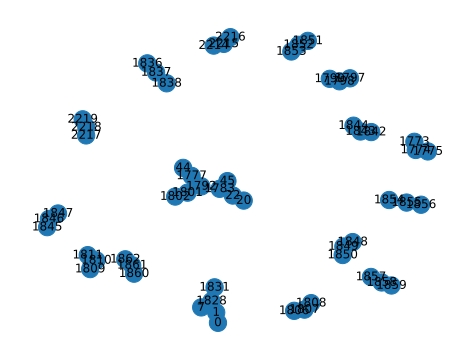

fusion  (1831, 2214)  success
fusion failure  1831 2214
rebuilding vertex 1831
connected components for neighbor 1828 : {0, 1, 1828, 7}
set initial ghz as  (1831, 1828, 2223) fusing the last with neighbor 1828
rebuilding vertex 2214
connected components for neighbor 2215 : {2216, 2215}
set initial ghz as  (2214, 2215, 2216)
vertex map: {1831: 2222, 1828: 2221, 2214: 2225, 2215: 2224, 2216: 2223}
in dfs for graph with nodes [0, 1, 7, 20, 22, 44, 45, 1773, 1774, 1775, 1777, 1783, 1792, 1797, 1798, 1799, 1801, 1802, 1806, 1807, 1808, 1809, 1810, 1811, 1828, 1836, 1837, 1838, 1842, 1843, 1844, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 2217, 2218, 2219, 2220, 2221, 2222, 2223, 2224, 2225] fusion order [(29, 30), (23, 47), (17, 18), (13, 15), (14, 54), (5, 6), (26, 27), (62, 63), (8, 9), (16, 24), (68, 69), (37, 59), (43, 60), (28, 33), (50, 51), (31, 36), (34, 48), (19, 21), (49, 65), (55, 71), (35, 41), (56, 57), (46, 53), (

In [ ]:
fusion_order = current_optimal_graph.get_fusion_order()
random.shuffle(fusion_order)
print(fusion_order)
get_fp_times(fusion_order, int(current_optimal_graph.circuit.m/2), [0.5,0.66,0.75,0.85,1], verbose=True)

In [88]:
fusion_order

[(10, 15), (8, 9), (2, 3), (11, 12), (19, 21), (5, 6), (17, 18)]

sink from  20 to 28
fuse 28 30
fuse 16 18
fuse 4 6
fuse 20 22
sink from  38 to 40
fuse 40 42
fuse 10 12
fuse 34 36
DEPTH: 2


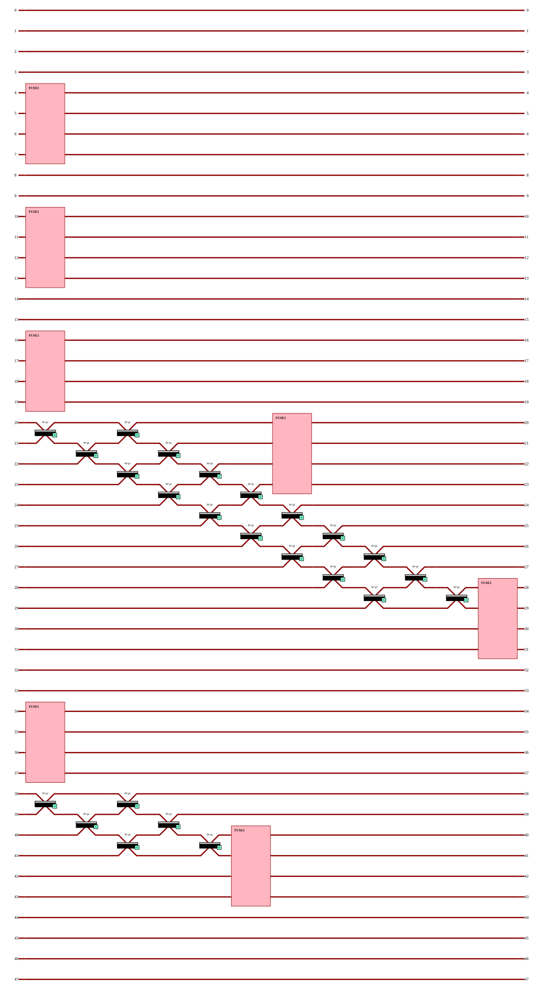

In [87]:
new_g = LOGraph(0, G)
new_g.build_from_fusion_order(fusion_order)
print("DEPTH:",new_g.depth())
pcvl.pdisplay(new_g.circuit)

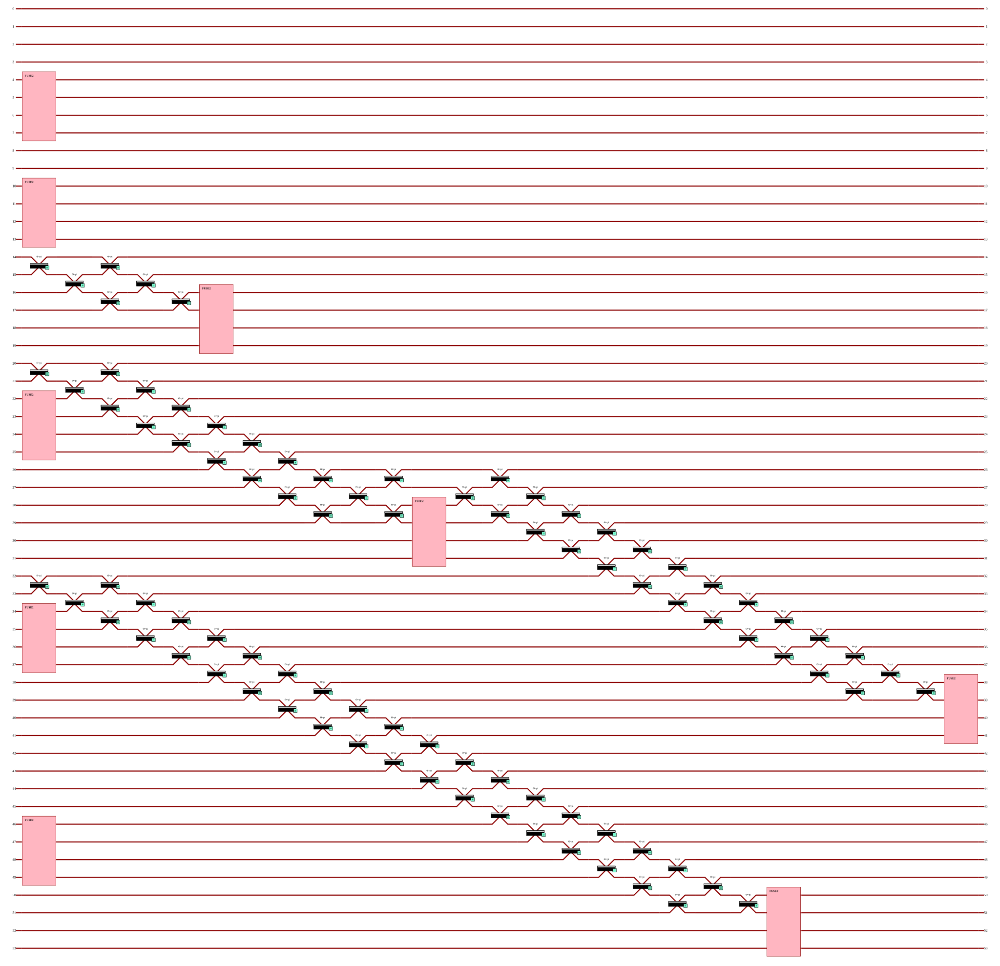

In [31]:
pcvl.pdisplay(current_optimal_graph.circuit)